# 1- Introduction

This dataset captures the purchasing behavior of 9,506 online clients for a major American retailer, Vanguard, over the past 12 months. It belongs to Retail and E-commerce industry. Overall, it provides a comprehensive view of online shopping behavior and customer demographics, essential for analyzing purchasing trends and enhancing strategic decisions for a retail company’s online presence.

Here is the description of the dataset and the variables:
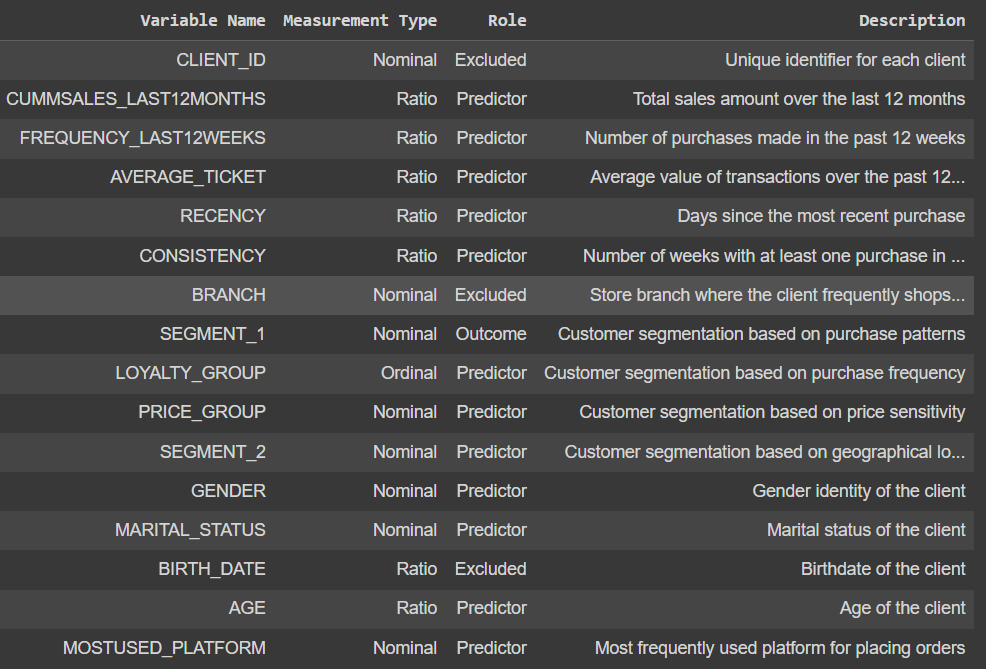


## Important Assumption

The dataset includes various demographic details, customer segmentation, and purchasing patterns. However, there is an issue with the dataset: the documentation needed to understand the customer segmentation variables and their respective classes is inadequate. There is only sufficient clarity on the variables that indicate customer purchasing behavior and demographics. However, choosing any of the customer segmentation variables as the target variable would be most appropriate for making predictions, as these are the effects of the causal variables—purchasing patterns and demographics. Therefore, to meet the project requirements within the available time constraints, a robust segmentation model is being developed with 'segment_1' as the outcome variable. Details of its respective classes will be derived later in stakeholder meetings.

# 2- Exploratory Data Analysis
loading the dataset and necessary packages for performing EDA.

In [5]:
# Install required libraries
! pip install numpy pandas matplotlib seaborn scikit-learn openpyxl

In [6]:
# Libraries for data manipulation
import numpy as np
import pandas as pd

# Libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
# Improve the aesthetics of the visualizations
sns.set()

# Configuration settings for display options
pd.set_option("display.max_columns", None)  # No limit on the number of displayed columns
pd.set_option("display.max_rows", 200)      # Display up to 200 rows

# Suppress warnings for cleaner output (consider being more selective with warnings to ignore)
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Load the dataset from a specified file path
df = pd.read_excel(r"C:\Users\palad\Downloads\ONLINE_CLIENTS_SV.xlsx", sheet_name='DB')

# Show the first few rows of the dataset to verify it's loaded correctly
df.head()

,CLIENT_ID,CUMMSALES_LAST12WEEKS,FREQUENCY_LAST12WEEKS,AVERAGE_TICKET,RECENCY,CONSISTENCY,BRANCH,SEGMENT_1,LOYALTY_GROUP,PRICE_GROUP,SEGMENT_2,GENDER,MARITAL_STATUS,BIRTH_DATE,AGE,MOSTUSED_PLATFORM
0,22335,7516.357,10,751.6357,11,8,2979,Core,Vip,Very Price Sensitive,B,Female,Married,1973-11-12,44.569863,Mobile
1,22349,860.535,1,860.5350,49,1,2979,Core,Ocasional,Selective Price Sensitive,B,Female,Married,1988-04-24,30.112329,Web
2,22389,1576.317,2,788.1585,74,1,2979,Core,Ocasional,Very Price Sensitive,B,Female,Married,1977-01-15,41.391781,Mobile
3,22679,4531.182,3,1510.3940,24,2,2961,Core,Ocasional,Moderately Price Sensitive,B,Male,Married,1987-05-20,31.043836,Mobile
4,22878,6193.583,1,6193.5830,70,1,2979,Core,Ocasional,Selective Price Sensitive,B,Male,Married,1968-09-07,49.753425,Web


In [7]:
# checking shape of the data
print("There are", df.shape[0], 'rows and', df.shape[1], "columns.")

There are 9504 rows and 16 columns.


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9504 entries, 0 to 9503
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   CLIENT_ID              9504 non-null   int64         
 1   CUMMSALES_LAST12WEEKS  9504 non-null   float64       
 2   FREQUENCY_LAST12WEEKS  9504 non-null   int64         
 3   AVERAGE_TICKET         9504 non-null   float64       
 4   RECENCY                9504 non-null   int64         
 5   CONSISTENCY            9504 non-null   int64         
 6   BRANCH                 9504 non-null   int64         
 7   SEGMENT_1              9504 non-null   object        
 8   LOYALTY_GROUP          9504 non-null   object        
 9   PRICE_GROUP            9504 non-null   object        
 10  SEGMENT_2              9504 non-null   object        
 11  GENDER                 9503 non-null   object        
 12  MARITAL_STATUS         9503 non-null   object        
 13  BIR

## Dropping Redundant Variables
Overall, columns like Client_ID, Birth_Date are redundant for this particular dataset analysis. The reasons are: Client ID is just a unique identifier, the presence of column *'Age'* makes '*Birth_date*'  not so effective to use, especially when the project's goal is not focussed on time series or trends over time. These are to be dropped. Then, Branch which represents branch where a transaction happened is supposed to be in factor type. Also lets rename *CUMMSALES_LAST12WEEKS* to *CUMSALES* and *FREQUENCY_LAST12WEEKS* to *FREQUENCY.*

In [10]:
# To retain the original DataFrame, a copy is made.
data = df.copy()

# Drop redundant columns and create a new DataFrame 'data' with the remaining columns
data = data.drop(['CLIENT_ID', 'BIRTH_DATE'], axis=1)

#Change Branch into appropriate datatype
data['BRANCH'] = data['BRANCH'].astype('object')

#renaming columns for brevity and unnecessary distractions
data.rename(columns={'CUMMSALES_LAST12WEEKS': 'CUMSALES', 'FREQUENCY_LAST12WEEKS': 'FREQUENCY'}, inplace=True)

data.head()

,CUMSALES,FREQUENCY,AVERAGE_TICKET,RECENCY,CONSISTENCY,BRANCH,SEGMENT_1,LOYALTY_GROUP,PRICE_GROUP,SEGMENT_2,GENDER,MARITAL_STATUS,AGE,MOSTUSED_PLATFORM
0,7516.357,10,751.6357,11,8,2979,Core,Vip,Very Price Sensitive,B,Female,Married,44.569863,Mobile
1,860.535,1,860.5350,49,1,2979,Core,Ocasional,Selective Price Sensitive,B,Female,Married,30.112329,Web
2,1576.317,2,788.1585,74,1,2979,Core,Ocasional,Very Price Sensitive,B,Female,Married,41.391781,Mobile
3,4531.182,3,1510.3940,24,2,2961,Core,Ocasional,Moderately Price Sensitive,B,Male,Married,31.043836,Mobile
4,6193.583,1,6193.5830,70,1,2979,Core,Ocasional,Selective Price Sensitive,B,Male,Married,49.753425,Web


##  Null Values Detected

In [12]:
data.isnull().sum()

CUMSALES                0
FREQUENCY               0
AVERAGE_TICKET          0
RECENCY                 0
CONSISTENCY             0
BRANCH                  0
SEGMENT_1               0
LOYALTY_GROUP           0
PRICE_GROUP             0
SEGMENT_2               0
GENDER                  1
MARITAL_STATUS          1
AGE                  1158
MOSTUSED_PLATFORM       0
dtype: int64

There are just 1 each missing values in Gender and Marital_status columns. Considering more than 9000 observations, dropping 2 rows would not make troublesome difference. Whereas, the Age column has more than 10% (1158) of missing null values of the total rows (9000+), for that reason dropping is not a good option as precious data that could be useful for accurate predictions could be lost. So, we shall decide which specific imputation to perform on it as we go on with EDA in further steps.

## Anamalies/Outliers Detected

In [15]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CUMSALES,9504.0,3749.918529,7057.653117,2.500000,694.732750,1713.387000,4473.282250,279970.140000
FREQUENCY,9504.0,3.216961,4.106171,1.000000,1.000000,2.000000,4.000000,135.000000
AVERAGE_TICKET,9504.0,1248.730602,2406.863554,2.500000,482.148824,857.233875,1383.428333,130698.600000
RECENCY,9504.0,28.771044,24.240985,0.000000,7.000000,21.000000,48.000000,83.000000
CONSISTENCY,9504.0,2.793876,2.611770,1.000000,1.000000,2.000000,4.000000,12.000000
AGE,8346.0,35.985055,10.036625,2.350685,29.595890,34.783562,40.599315,97.810959


This indicates anamolies in the above continuous variables. EDA can point this out easily.

In [17]:
#summary for categorical variables
data.describe(include= 'object').T

,count,unique,top,freq
BRANCH,9504,25,2978,928
SEGMENT_1,9504,2,Up,5643
LOYALTY_GROUP,9504,4,Ocasional,6910
PRICE_GROUP,9504,5,Very Price Insensitive,2515
SEGMENT_2,9504,6,A,2589
GENDER,9503,2,Female,7445
MARITAL_STATUS,9503,3,Married,5300
MOSTUSED_PLATFORM,9504,3,Web,4929


The column BRANCH also has to be dropped as it is unlikely to add value to the model. The target variable 'SEGMENT_1' can also be determined by other key variables related to customer behavior and purchase patterns. Including 'BRANCH', with its multiple classes (25), which are not in a state of merging due to inadequate information, would introduce unnecessary complexity without contributing significantly to the prediction, potentially leading to inefficiency or overfitting. Also, let's see if there is any useful possibility of reducing the variables with 5 and 6 classes after EDA.

In [19]:
#Drop Branch column
data = data.drop(['BRANCH'], axis=1)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9504 entries, 0 to 9503
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUMSALES           9504 non-null   float64
 1   FREQUENCY          9504 non-null   int64  
 2   AVERAGE_TICKET     9504 non-null   float64
 3   RECENCY            9504 non-null   int64  
 4   CONSISTENCY        9504 non-null   int64  
 5   SEGMENT_1          9504 non-null   object 
 6   LOYALTY_GROUP      9504 non-null   object 
 7   PRICE_GROUP        9504 non-null   object 
 8   SEGMENT_2          9504 non-null   object 
 9   GENDER             9503 non-null   object 
 10  MARITAL_STATUS     9503 non-null   object 
 11  AGE                8346 non-null   float64
 12  MOSTUSED_PLATFORM  9504 non-null   object 
dtypes: float64(3), int64(3), object(7)
memory usage: 965.4+ KB


## Univariate Visuals

In [21]:
def plot_histogram_boxplot(data, feature):
    """
    Plots a histogram and a boxplot for the specified feature in the data.
    Adds mean and median lines to the histogram.

    Args:
    - data: DataFrame containing the data.
    - feature: String representing the column to plot.
    """
    fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (0.2, 0.8)}, figsize=(12, 8))

    # Boxplot
    sns.boxplot(x=data[feature], ax=ax_box)
    ax_box.set(xlabel='')

    # Histogram
    sns.histplot(data[feature], kde=True, ax=ax_hist)
    mean = data[feature].mean()
    median = data[feature].median()

    # Adding mean and median lines
    ax_hist.axvline(mean, color='r', linestyle='--', linewidth=2)
    ax_hist.axvline(median, color='g', linestyle='-', linewidth=2)

    # Labels
    ax_hist.legend({'Mean': mean, 'Median': median})
    ax_hist.set(title=f'{feature} Distribution')
    ax_hist.set(xlabel=feature, ylabel='Frequency')

    plt.show()




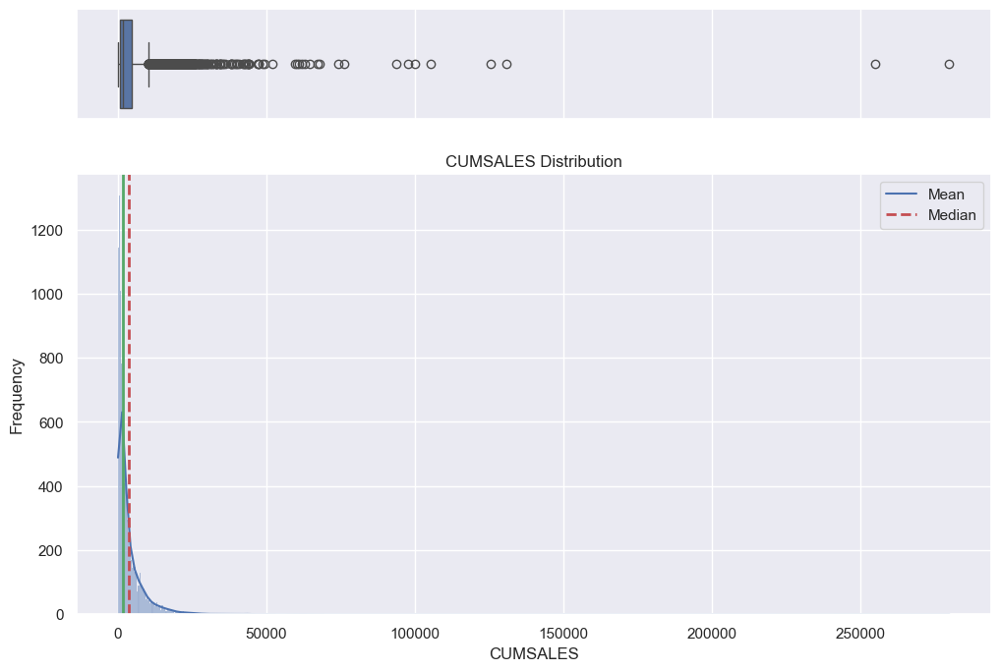

In [22]:
# Plotting cumsales
plot_histogram_boxplot(data, 'CUMSALES')

Presence of more outliers. Not good for model.

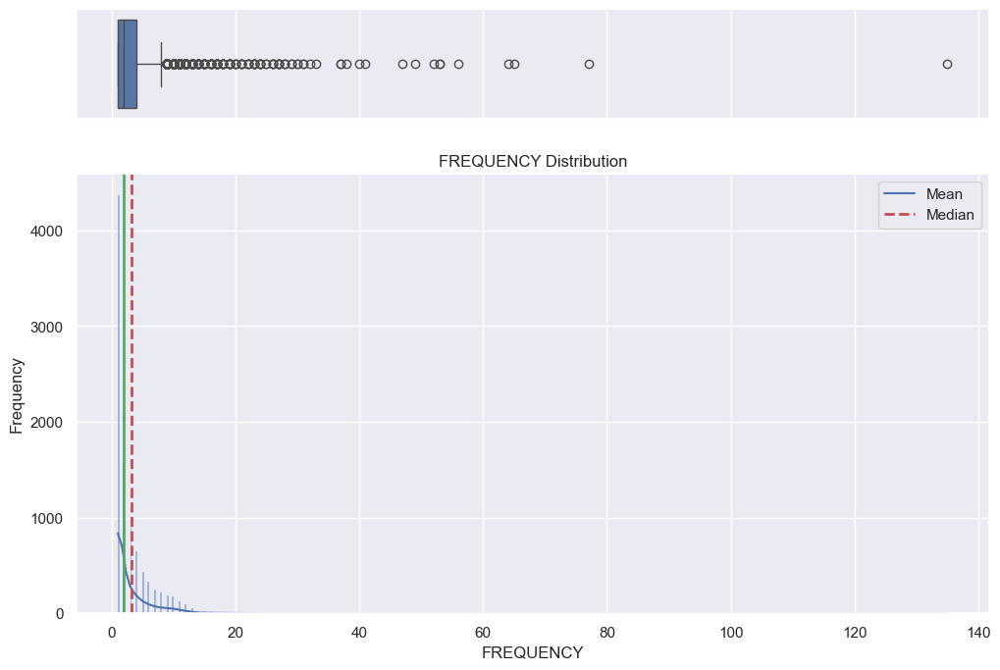

In [24]:
# Plotting frequency
plot_histogram_boxplot(data, 'FREQUENCY')

Outliers present.

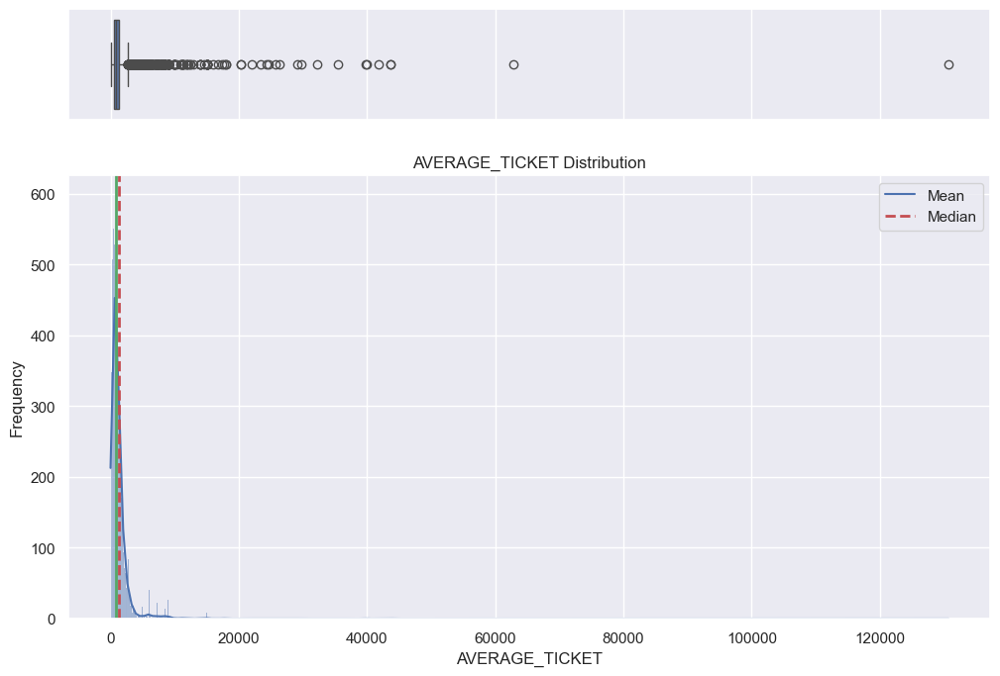

In [26]:
# Plotting average ticket
plot_histogram_boxplot(data, 'AVERAGE_TICKET')

Outliers present.

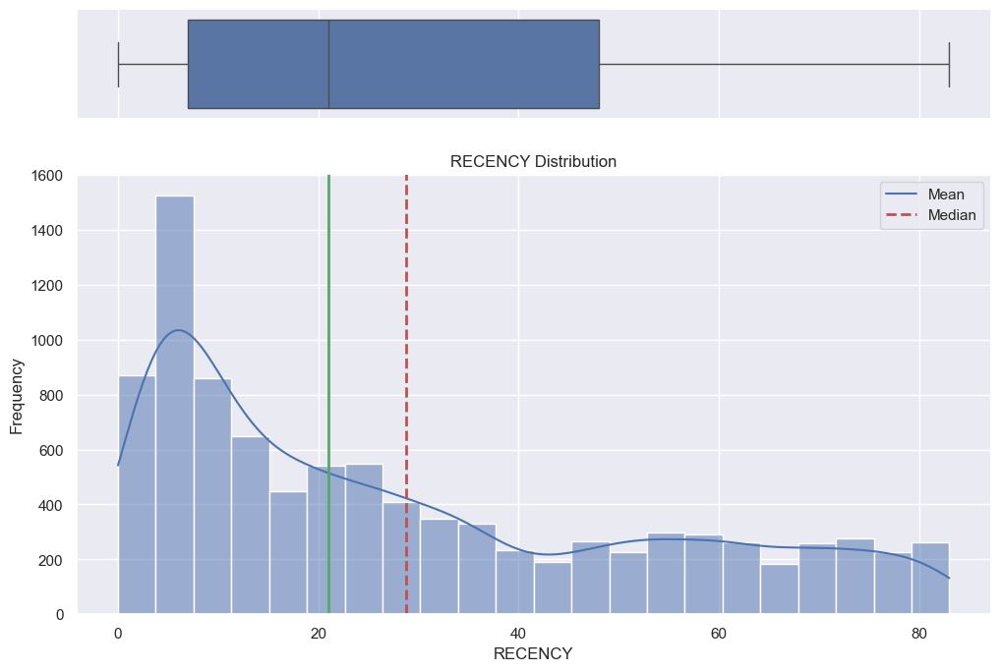

In [28]:
# Plotting recency
plot_histogram_boxplot(data, 'RECENCY')

Recency looks good. Remember it is number of days since last purchase, not months, so fine. Right skewed.

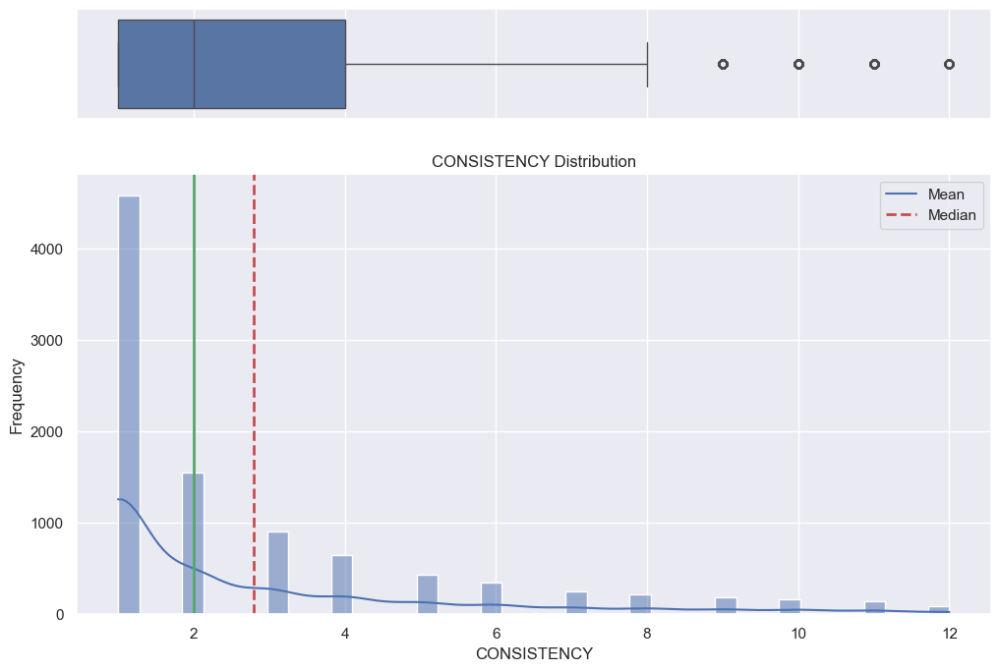

In [30]:
# Plotting consistecency
plot_histogram_boxplot(data, 'CONSISTENCY')

### Imputation of NA in Age variable

Most of the customers fall into the segment visiting once or twice in an year, rarely there were who visited most of the year. They act as outliers.

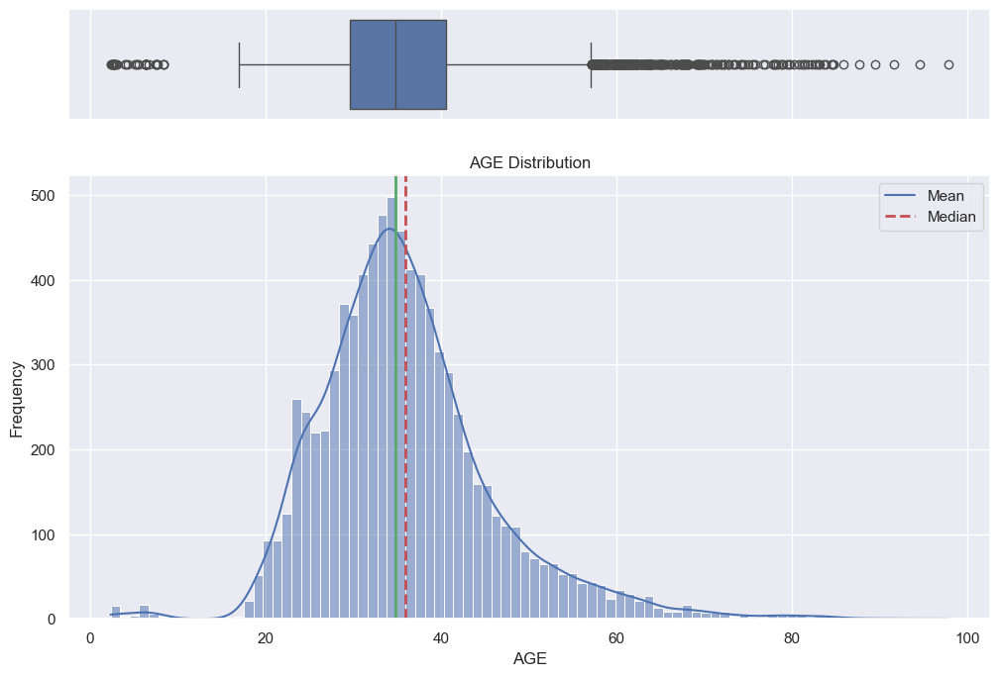

In [33]:
# Plotting age
plot_histogram_boxplot(data, 'AGE')

There is very less chance that anyone below 15 year old places an order. So, outliers on the left of distribution are definitely to be dropped. There are also people who are old which is quite probable considering their proportion. So, lets keep them.

In [35]:
# Calculate the first quartile (Q1) and third quartile (Q3)
Q1_age = data['AGE'].quantile(0.25)
Q3_age = data['AGE'].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR_age = Q3_age - Q1_age

# Define the lower bound (to remove left-side outliers)
lower_bound_age = Q1_age - 1.5 * IQR_age

# Filter data to keep rows where AGE is above the lower bound, but keep NaN values
data = data[(data['AGE'] >= lower_bound_age) | (data['AGE'].isna())]

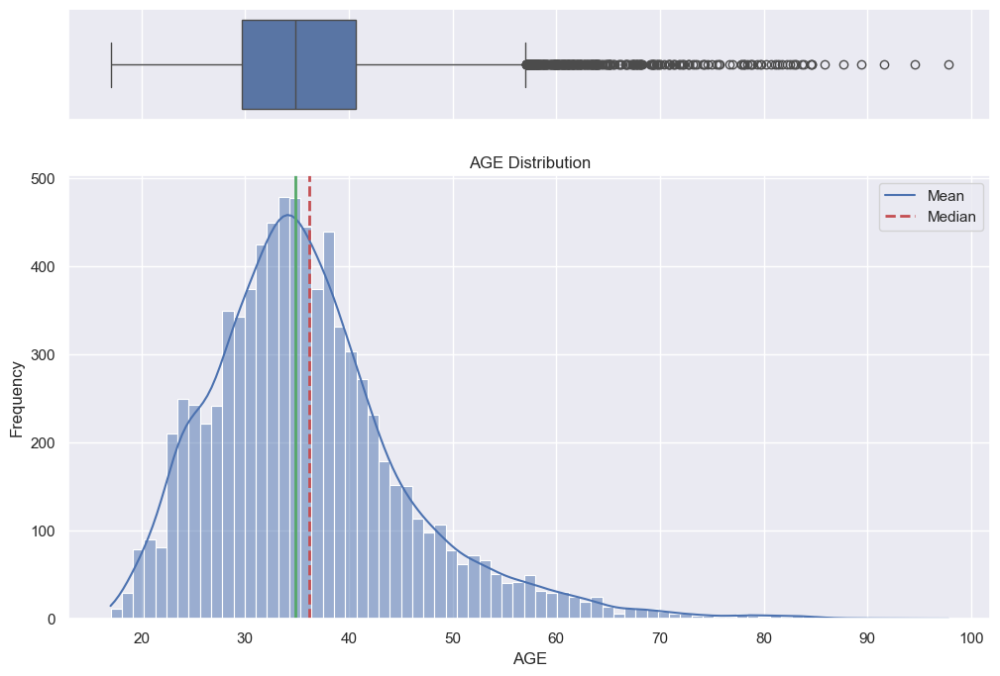

In [36]:
# Plotting age
plot_histogram_boxplot(data, 'AGE')

In [37]:
data.isnull().sum()

CUMSALES                0
FREQUENCY               0
AVERAGE_TICKET          0
RECENCY                 0
CONSISTENCY             0
SEGMENT_1               0
LOYALTY_GROUP           0
PRICE_GROUP             0
SEGMENT_2               0
GENDER                  1
MARITAL_STATUS          1
AGE                  1158
MOSTUSED_PLATFORM       0
dtype: int64

Ofcourse, as we see, variables like age tend to be right skewed. So, let's impute median age value for filling in the more than 10% of those missing values in the AGE variable. Also drop the other rows of missing values in GENDER and MARITAL_STATUS columns as they are just 1 each.

In [39]:
# Impute the median for missing values in 'AGE' column
median_age = data['AGE'].median()
data['AGE'].fillna(median_age, inplace=True)

# Drop rows where 'GENDER' or 'MARITAL_STATUS' is missing
data.dropna(subset=['GENDER', 'MARITAL_STATUS'], inplace=True)

# To verify if the missing values have been handled
print(data.isnull().sum())

CUMSALES             0
FREQUENCY            0
AVERAGE_TICKET       0
RECENCY              0
CONSISTENCY          0
SEGMENT_1            0
LOYALTY_GROUP        0
PRICE_GROUP          0
SEGMENT_2            0
GENDER               0
MARITAL_STATUS       0
AGE                  0
MOSTUSED_PLATFORM    0
dtype: int64


In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9454 entries, 0 to 9503
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUMSALES           9454 non-null   float64
 1   FREQUENCY          9454 non-null   int64  
 2   AVERAGE_TICKET     9454 non-null   float64
 3   RECENCY            9454 non-null   int64  
 4   CONSISTENCY        9454 non-null   int64  
 5   SEGMENT_1          9454 non-null   object 
 6   LOYALTY_GROUP      9454 non-null   object 
 7   PRICE_GROUP        9454 non-null   object 
 8   SEGMENT_2          9454 non-null   object 
 9   GENDER             9454 non-null   object 
 10  MARITAL_STATUS     9454 non-null   object 
 11  AGE                9454 non-null   float64
 12  MOSTUSED_PLATFORM  9454 non-null   object 
dtypes: float64(3), int64(3), object(7)
memory usage: 1.0+ MB


Thus, the dataset is free of null values. Let's go ahead by performing EDA on factor variables.

In [42]:
#defining plotting fucntions for categorical variables
def bar_plot(data, feature, figsize=(14, 6), order=None):
    """
    Bar plot for categorical variables

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (10,6))
    order: order of categories (default None)
    """
    plt.figure(figsize=figsize)
    sns.countplot(data=data, x=feature, order=order, palette="viridis")
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.show()

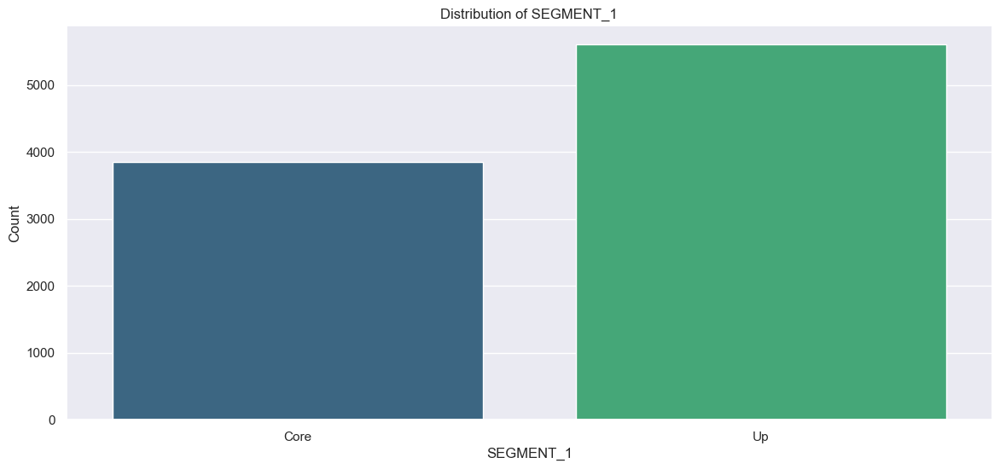

In [43]:
#plotting segment_1
bar_plot(data, 'SEGMENT_1')

Our target variable Segment_1 has less class imbalance. Good sign.

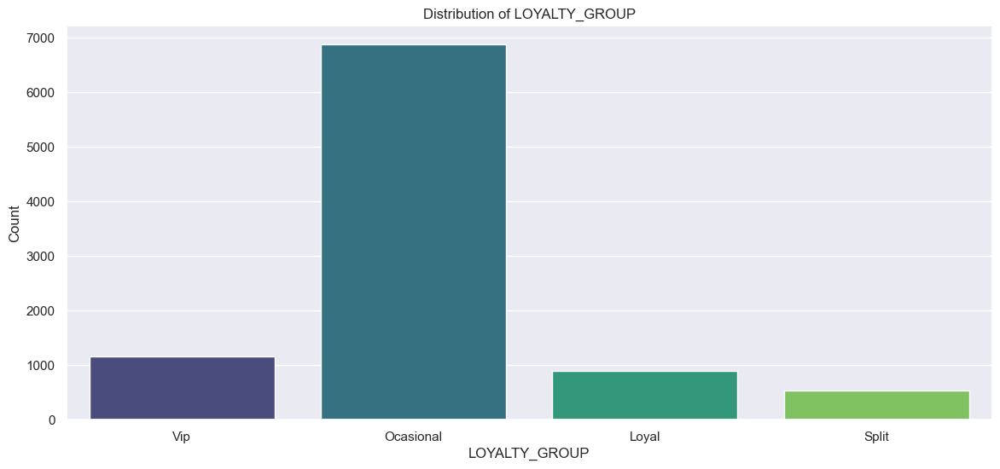

In [45]:
#plotting loyalty_group
bar_plot(data, 'LOYALTY_GROUP')

4 classes in Loayly-group is totally okay.

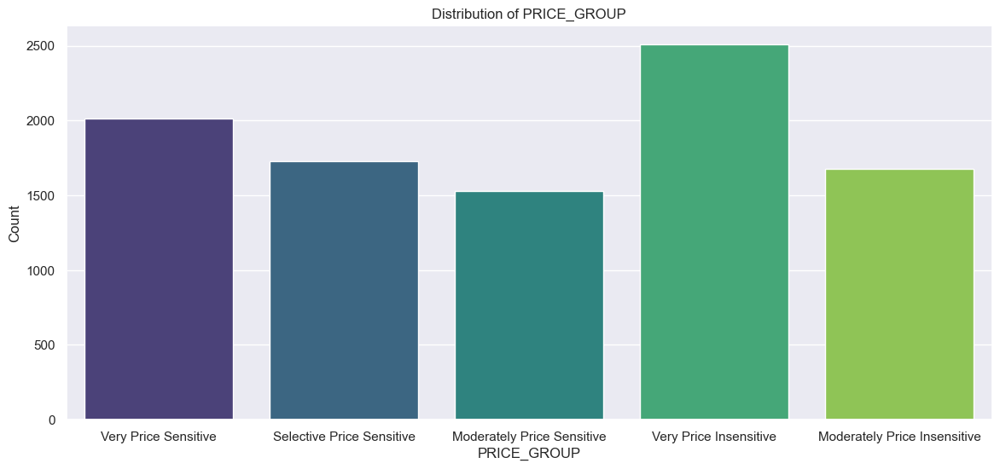

In [47]:
#plotting price_group
bar_plot(data, 'PRICE_GROUP')

All classes indicate their own group. No need to club any of them.

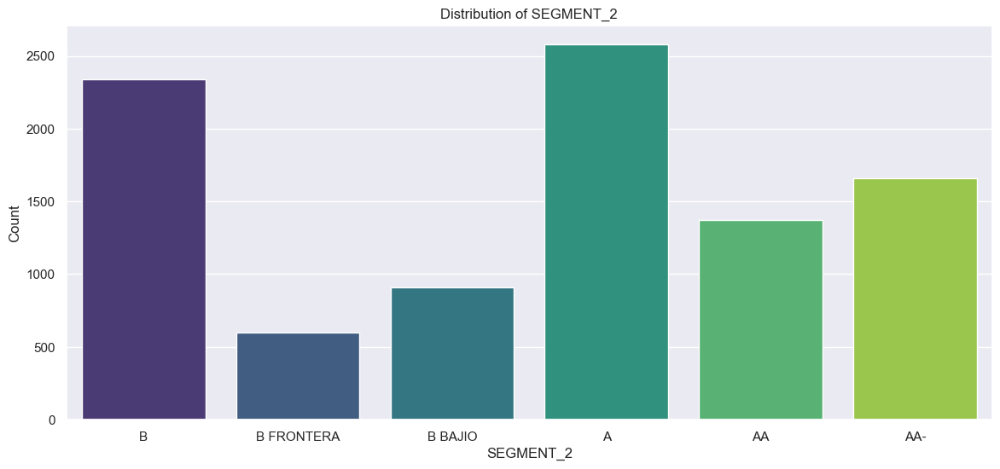

In [49]:
#plotting segment_2
bar_plot(data, 'SEGMENT_2')

There are a good proportions of observations in each of the 6 classes, lets's not drop and retain all of them to see how the model performs.

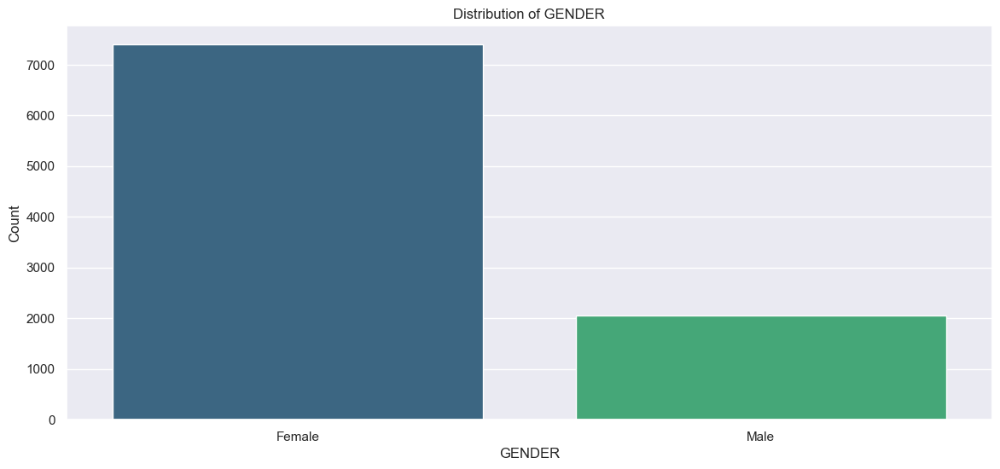

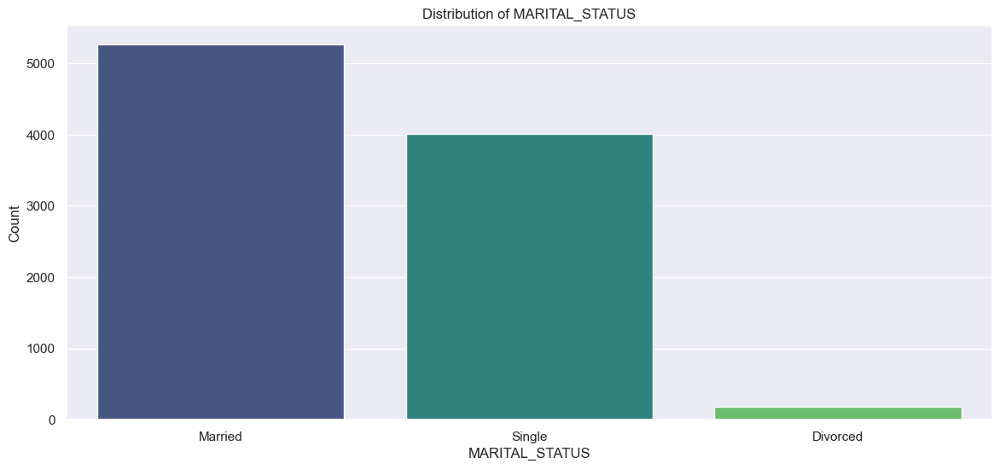

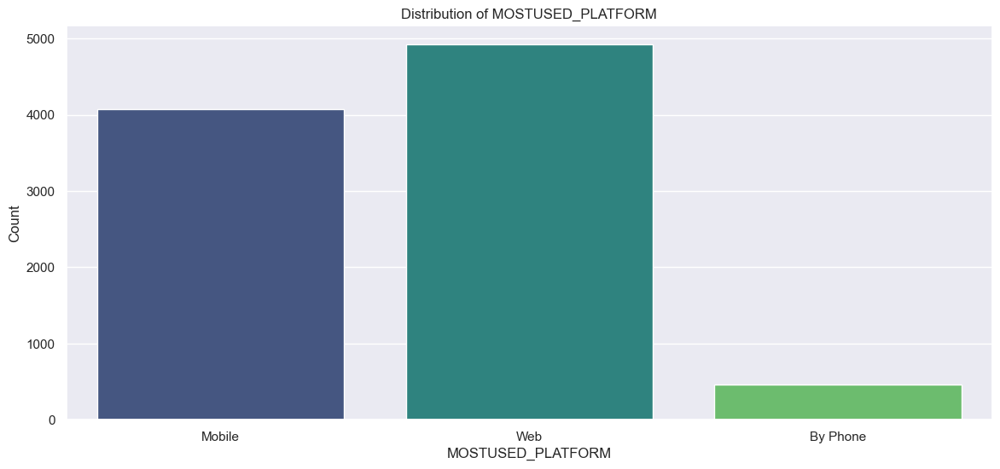

In [51]:
categorical_columns = ['GENDER', 'MARITAL_STATUS', 'MOSTUSED_PLATFORM']

# Plot categorical variables
for column in categorical_columns:
    bar_plot(data, column)

In the MOSTUSED_PLATFORM, Mobile and Phone are same lets club them.

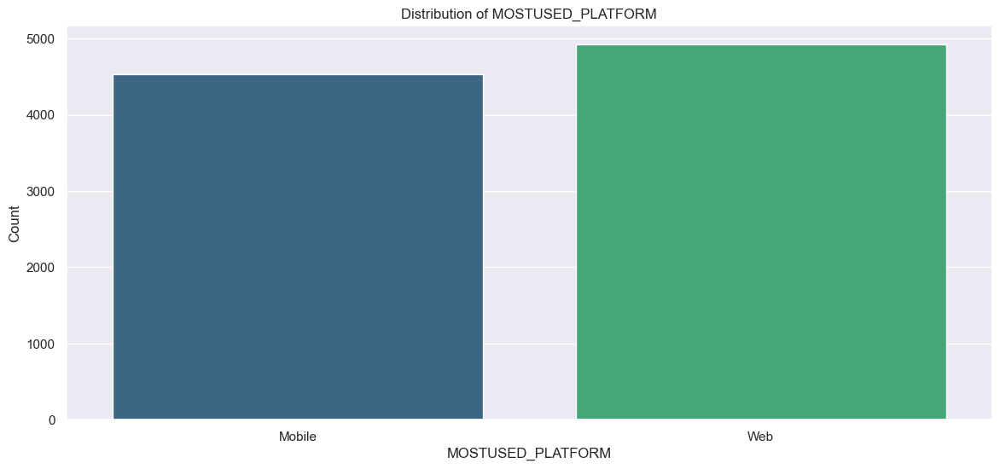

In [53]:
#replacing by phone with mobile
data['MOSTUSED_PLATFORM'] = data['MOSTUSED_PLATFORM'].replace({
     'By Phone': 'Mobile'
    })

bar_plot(data, 'MOSTUSED_PLATFORM')

## Outlier Removal
Time to remove outliers from all numercial columns except AGE which was already taken care of in previous steps. This will ensure that the model understands the patterns well and reduces overfitting because such cases of outlier occurences (for example, customers with very high annual sales amount) are less common. But yes, this comes at a adding a small bias of not able to capture those outlier cases effectively. But that's okay, their number is way lesser than average/general case numbers in the dataset.

In [55]:
def remove_outliers_all_but_age(data):
    """
    Removes outliers from all numerical columns in the DataFrame based on the IQR method,
    except the 'AGE' column.

    Args:
    - data: DataFrame containing the data.

    Returns:
    - A new DataFrame with outliers removed from all numerical columns except 'AGE'.
    """
    # Create a copy of the data to preserve the original DataFrame
    clean_data = data.copy()

    # Loop through all numerical columns except 'AGE'
    for feature in clean_data.select_dtypes(include=['float64', 'int64']).columns:
        if feature == 'AGE':
            continue  # Skip the 'AGE' column

        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = clean_data[feature].quantile(0.25)
        Q3 = clean_data[feature].quantile(0.75)
        IQR = Q3 - Q1

        # Define bounds for the outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filter out the outliers
        clean_data = clean_data[(clean_data[feature] >= lower_bound) & (clean_data[feature] <= upper_bound)]

    return clean_data

# Apply the function to remove outliers from all numerical columns except 'AGE'
clean_data = remove_outliers_all_but_age(data)

# Check the resulting DataFrame after outlier removal
clean_data.info()


<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUMSALES           7561 non-null   float64
 1   FREQUENCY          7561 non-null   int64  
 2   AVERAGE_TICKET     7561 non-null   float64
 3   RECENCY            7561 non-null   int64  
 4   CONSISTENCY        7561 non-null   int64  
 5   SEGMENT_1          7561 non-null   object 
 6   LOYALTY_GROUP      7561 non-null   object 
 7   PRICE_GROUP        7561 non-null   object 
 8   SEGMENT_2          7561 non-null   object 
 9   GENDER             7561 non-null   object 
 10  MARITAL_STATUS     7561 non-null   object 
 11  AGE                7561 non-null   float64
 12  MOSTUSED_PLATFORM  7561 non-null   object 
dtypes: float64(3), int64(3), object(7)
memory usage: 827.0+ KB


Visualizing after outlier removals

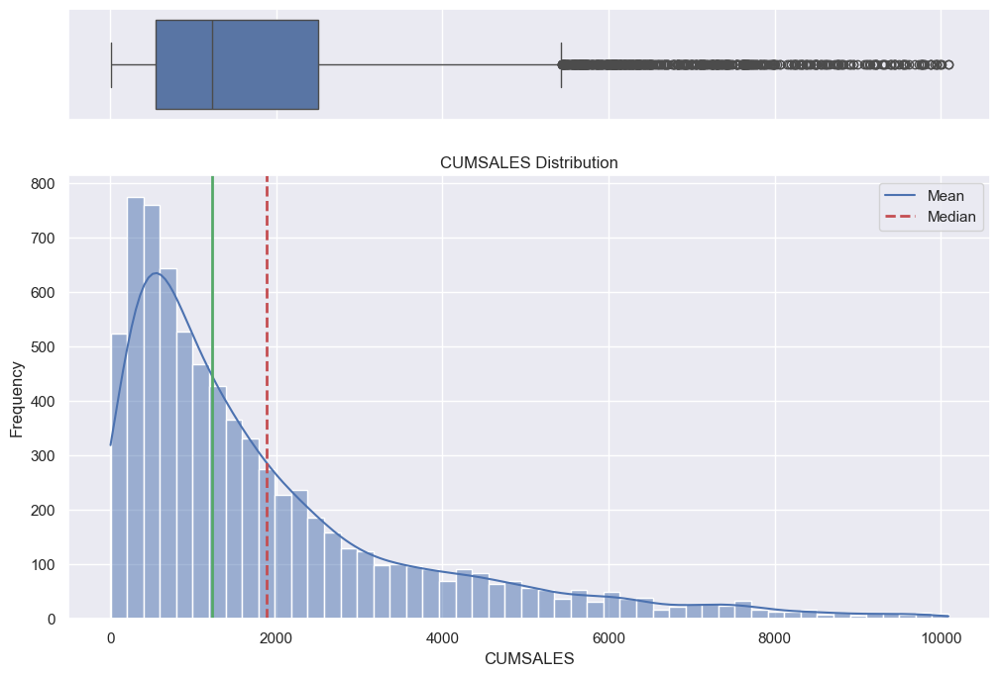

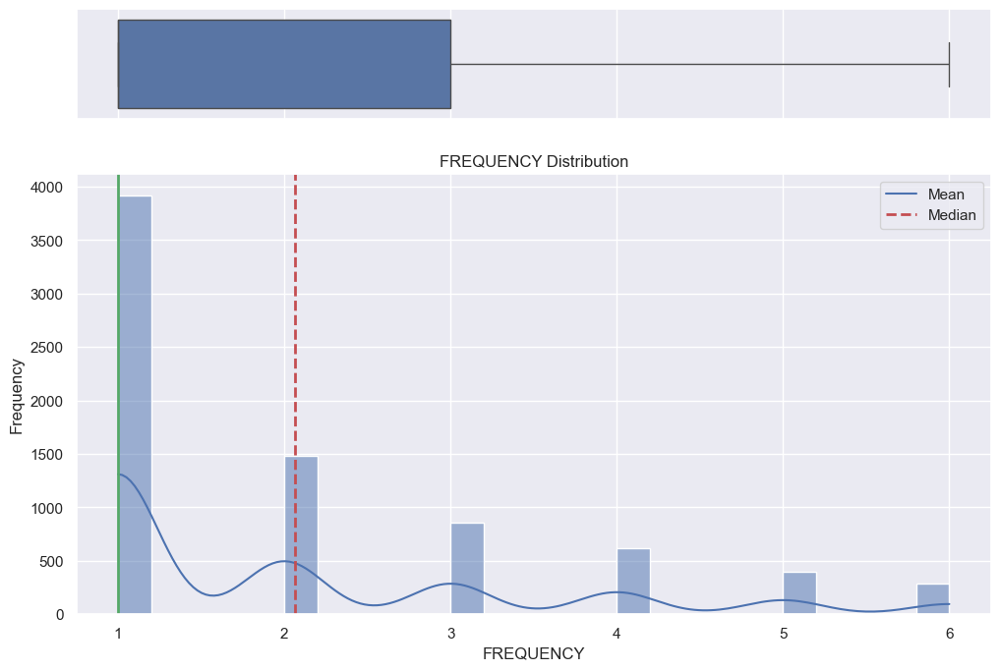

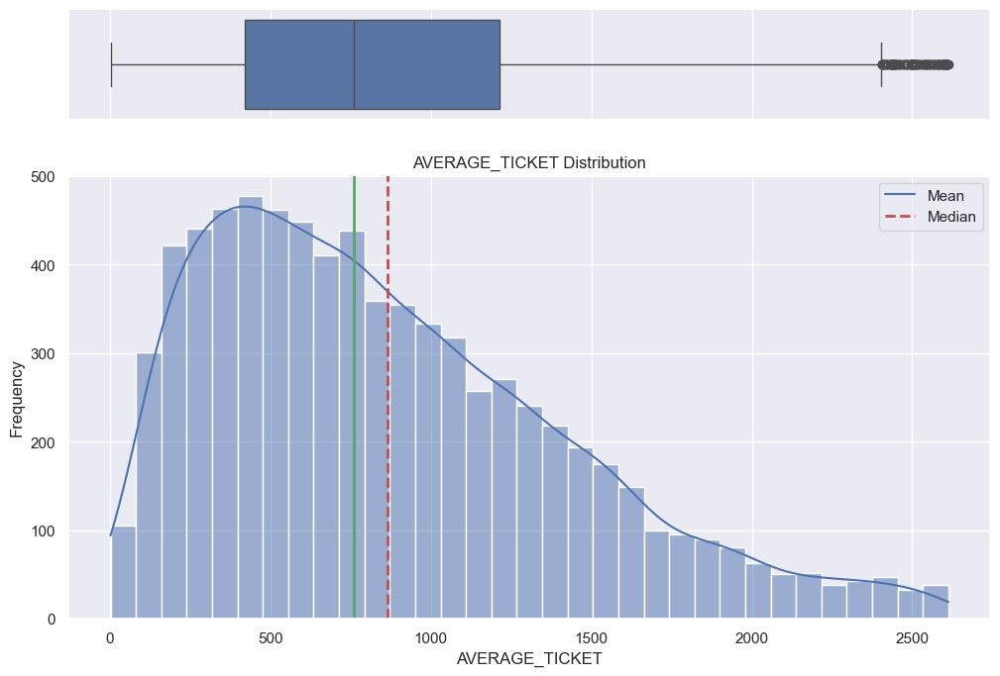

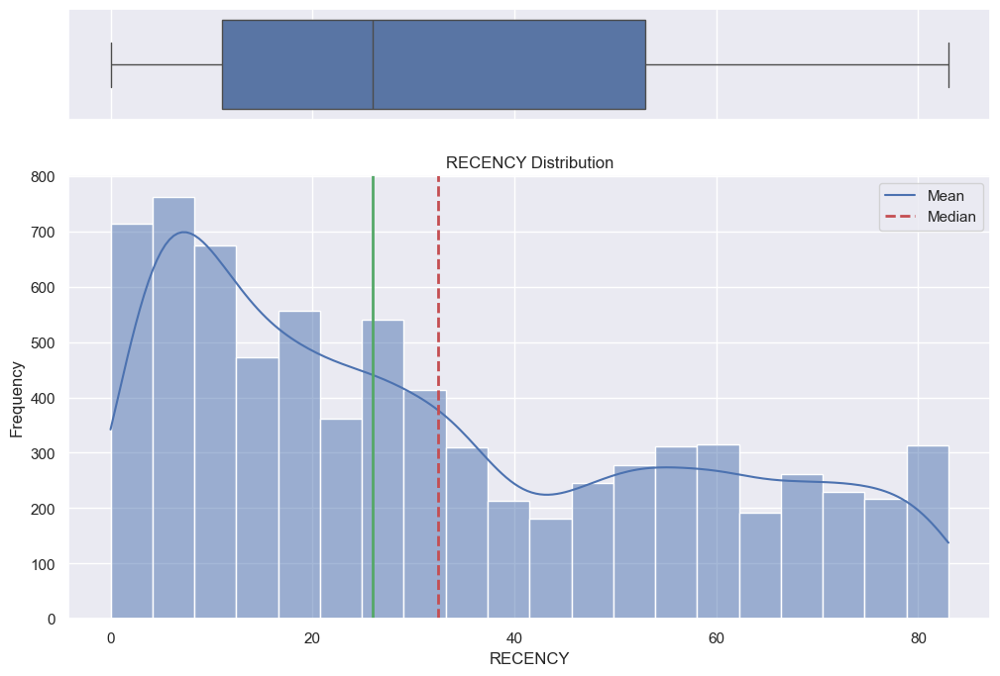

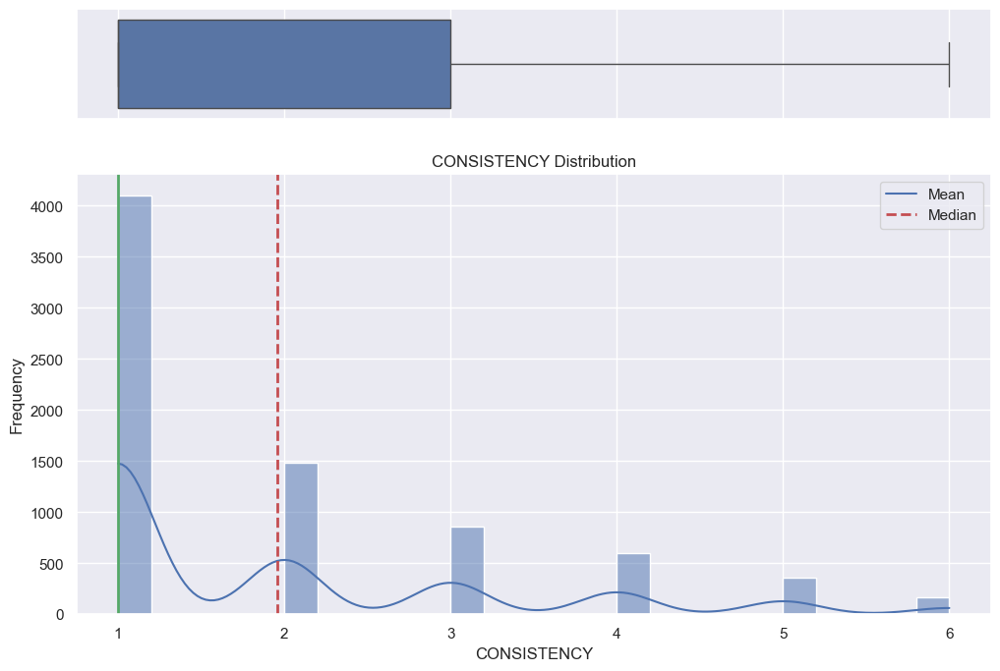

In [57]:
numerical_columns = ['CUMSALES', 'FREQUENCY', 'AVERAGE_TICKET', 'RECENCY', 'CONSISTENCY']

# Plot numerical variables
for column in numerical_columns:
    plot_histogram_boxplot(clean_data, column)

## Scaling Features

It is time to scale the data by standardization. By keeping features on similar scales, consistency across models improves, especially for models like Logistic Regression, SVM, and Lasso, which are sensitive to feature magnitudes. Scaling the features is crucial before model fitting to ensure that features with higher magnitudes don't disproportionately influence the model, preventing skewed coefficient predictions. But, before this we shall check if it is better to divide age into bins or take it as a continuous variable by plotting bivariate plots that could drive this decision home.

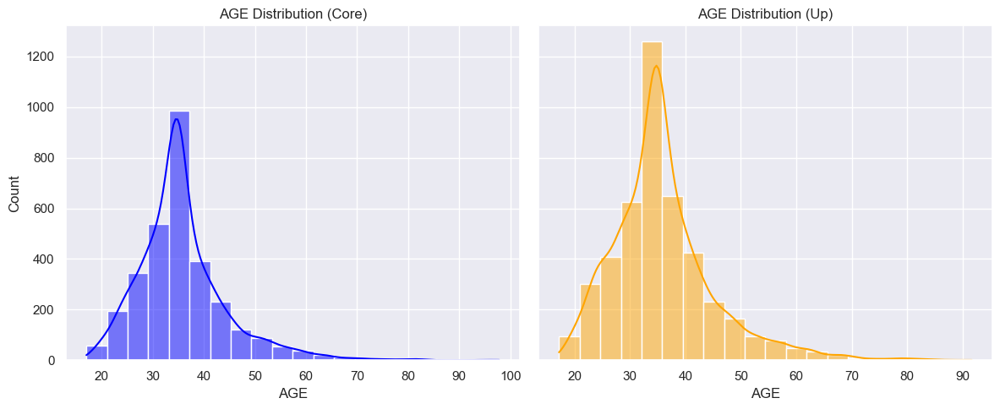

In [60]:
# Set up the figure with 2 subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Plot AGE distribution for 'Core' class
sns.histplot(clean_data[clean_data['SEGMENT_1'] == 'Core']['AGE'], bins=20, kde=True, ax=axes[0], color='blue')
axes[0].set_title('AGE Distribution (Core)')

# Plot AGE distribution for 'Up' class
sns.histplot(clean_data[clean_data['SEGMENT_1'] == 'Up']['AGE'], bins=20, kde=True, ax=axes[1], color='orange')
axes[1].set_title('AGE Distribution (Up)')

# Show the plots
plt.tight_layout()
plt.show()


Based on the distributions shown in the image, it seems that the age distributions for both "Core" and "Up" classes are quite similar, with peaks around the same age range (30-40). The "Up" class has a slightly higher peak but fewer total samples. Since there’s no clear visual separation or distinct thresholds between the age ranges of the two groups, binning may not add value. Keeping AGE continuous allows the model to capture any subtle differences that binning might oversimplify or overlook.

In [62]:
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUMSALES           7561 non-null   float64
 1   FREQUENCY          7561 non-null   int64  
 2   AVERAGE_TICKET     7561 non-null   float64
 3   RECENCY            7561 non-null   int64  
 4   CONSISTENCY        7561 non-null   int64  
 5   SEGMENT_1          7561 non-null   object 
 6   LOYALTY_GROUP      7561 non-null   object 
 7   PRICE_GROUP        7561 non-null   object 
 8   SEGMENT_2          7561 non-null   object 
 9   GENDER             7561 non-null   object 
 10  MARITAL_STATUS     7561 non-null   object 
 11  AGE                7561 non-null   float64
 12  MOSTUSED_PLATFORM  7561 non-null   object 
dtypes: float64(3), int64(3), object(7)
memory usage: 827.0+ KB


In [63]:
from sklearn.preprocessing import StandardScaler

# Create a copy of your cleaned data before scaling
scaled_data = clean_data.copy()

# List of numerical features to scale (excluding 'AGE' if needed)
num_features = ['CUMSALES', 'FREQUENCY', 'AVERAGE_TICKET', 'RECENCY', 'CONSISTENCY', 'AGE']

# Initialize the StandardScaler
scaler = StandardScaler()

# Apply the scaler to the numerical features
scaled_data[num_features] = scaler.fit_transform(clean_data[num_features])

# Check the scaled data (optional)
scaled_data[num_features].describe().T

,count,mean,std,min,25%,50%,75%,max
CUMSALES,7561.0,5.638482e-17,1.000066,-0.995693,-0.707614,-0.346994,0.324629,4.344515
FREQUENCY,7561.0,6.014381e-17,1.000066,-0.748322,-0.748322,-0.748322,0.655490,2.761207
AVERAGE_TICKET,7561.0,7.517976e-18,1.000066,-1.543541,-0.798491,-0.189948,0.621031,3.122194
RECENCY,7561.0,-9.303496e-17,1.000066,-1.330001,-0.878471,-0.262749,0.845550,2.076995
CONSISTENCY,7561.0,6.014381e-17,1.000066,-0.724761,-0.724761,-0.724761,0.786315,3.052928
AGE,7561.0,1.578775e-16,1.000066,-2.080734,-0.598641,-0.110166,0.393158,6.855153


Now, time for looking for bivariate relationships between features, as target is already a factor variable.

In [65]:
scaled_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUMSALES           7561 non-null   float64
 1   FREQUENCY          7561 non-null   float64
 2   AVERAGE_TICKET     7561 non-null   float64
 3   RECENCY            7561 non-null   float64
 4   CONSISTENCY        7561 non-null   float64
 5   SEGMENT_1          7561 non-null   object 
 6   LOYALTY_GROUP      7561 non-null   object 
 7   PRICE_GROUP        7561 non-null   object 
 8   SEGMENT_2          7561 non-null   object 
 9   GENDER             7561 non-null   object 
 10  MARITAL_STATUS     7561 non-null   object 
 11  AGE                7561 non-null   float64
 12  MOSTUSED_PLATFORM  7561 non-null   object 
dtypes: float64(6), object(7)
memory usage: 827.0+ KB


## Bivariate Visuals

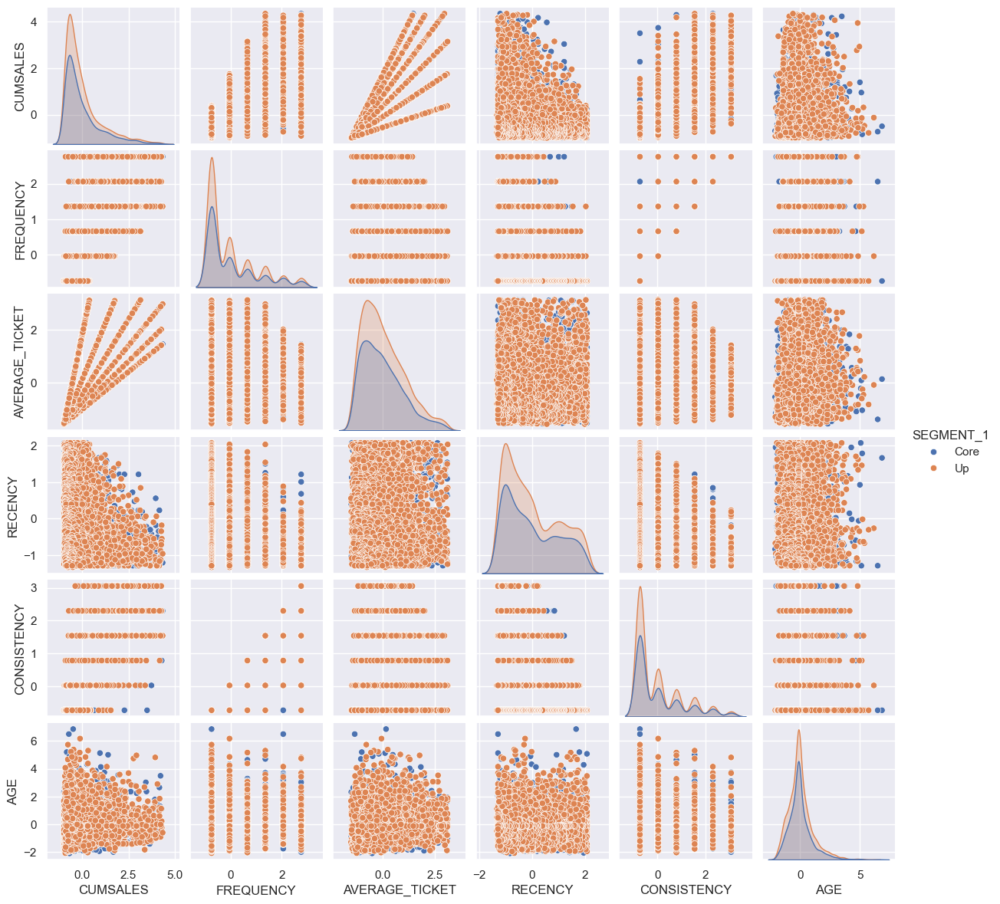

In [67]:
# Pair plot with 'SEGMENT_1' as the hue (color-coded by target class)
sns.pairplot(scaled_data, hue='SEGMENT_1', diag_kind='kde', height=2)
plt.show()

Based on the pair plot, the relationships between most variables and the target class (SEGMENT_1) appear to be non-linear. For instance, variables such as CUMSALES, FREQUENCY, and RECENCY do not exhibit clear linear trends, with the scatter plots showing more dispersed, non-linear patterns. Additionally, features like AVERAGE_TICKET and AGE demonstrate clustering without forming straight-line relationships with other variables. Therefore, using non-linear models such as decision trees, random forests, or boosting techniques etc might be more suitable for capturing these complex relationships effectively. Anyways, lets build all models and see if this turns out to be true, but no need of correlation matrix as it does not any sense here because of non-linear relationships.

In [69]:
scaled_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUMSALES           7561 non-null   float64
 1   FREQUENCY          7561 non-null   float64
 2   AVERAGE_TICKET     7561 non-null   float64
 3   RECENCY            7561 non-null   float64
 4   CONSISTENCY        7561 non-null   float64
 5   SEGMENT_1          7561 non-null   object 
 6   LOYALTY_GROUP      7561 non-null   object 
 7   PRICE_GROUP        7561 non-null   object 
 8   SEGMENT_2          7561 non-null   object 
 9   GENDER             7561 non-null   object 
 10  MARITAL_STATUS     7561 non-null   object 
 11  AGE                7561 non-null   float64
 12  MOSTUSED_PLATFORM  7561 non-null   object 
dtypes: float64(6), object(7)
memory usage: 827.0+ KB


### Correlations

In [71]:
from scipy.stats import chi2_contingency

# Assuming 'scaled_data' is your DataFrame
categorical_columns = ['LOYALTY_GROUP', 'PRICE_GROUP', 'SEGMENT_2', 'GENDER', 'MARITAL_STATUS', 'MOSTUSED_PLATFORM']
target = 'SEGMENT_1'

# Loop through each categorical variable
for col in categorical_columns:
    # Create a contingency table
    contingency_table = pd.crosstab(scaled_data[col], scaled_data[target])

    # Perform Chi-Square test
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)

    # Print the results
    print(f'Chi-Square Test for {col} vs {target}:')
    print(f'Chi2 Statistic = {chi2}, p-value = {p_value}\n')


Chi-Square Test for LOYALTY_GROUP vs SEGMENT_1:
Chi2 Statistic = 278.4182793540704, p-value = 4.6567110119511346e-60

Chi-Square Test for PRICE_GROUP vs SEGMENT_1:
Chi2 Statistic = 11.542819556187531, p-value = 0.02109539573677649

Chi-Square Test for SEGMENT_2 vs SEGMENT_1:
Chi2 Statistic = 7561.0, p-value = 0.0

Chi-Square Test for GENDER vs SEGMENT_1:
Chi2 Statistic = 1.8265144110019862, p-value = 0.17653980126228425

Chi-Square Test for MARITAL_STATUS vs SEGMENT_1:
Chi2 Statistic = 1.9754552675855324, p-value = 0.37242200941084663

Chi-Square Test for MOSTUSED_PLATFORM vs SEGMENT_1:
Chi2 Statistic = 57.912472538128725, p-value = 2.740440184863273e-14



The Chi-Square tests reveal that LOYALTY_GROUP, PRICE_GROUP, SEGMENT_2, and MOTSUSED_PLATFORM have a significant association with the target variable SEGMENT_1 (p-value < 0.05), indicating that these features are likely important for distinguishing between segments. Conversely, GENDER and MARITAL_STATUS show no significant association (p-value > 0.05), suggesting they may not be valuable predictors for the target, however they may still contribute in interaction with other features. So, let's keep them and thier count is just 2, not too many. Given that SEGMENT_2 is perfectly correlated correlated with SEGMENT_1 (it likely encodes the same information as SEGMENT_1), it should better be removed to avoid redundancy.

In [73]:
scaled_data= scaled_data.drop(columns=[col for col in scaled_data.columns if 'SEGMENT_2' in col])
scaled_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUMSALES           7561 non-null   float64
 1   FREQUENCY          7561 non-null   float64
 2   AVERAGE_TICKET     7561 non-null   float64
 3   RECENCY            7561 non-null   float64
 4   CONSISTENCY        7561 non-null   float64
 5   SEGMENT_1          7561 non-null   object 
 6   LOYALTY_GROUP      7561 non-null   object 
 7   PRICE_GROUP        7561 non-null   object 
 8   GENDER             7561 non-null   object 
 9   MARITAL_STATUS     7561 non-null   object 
 10  AGE                7561 non-null   float64
 11  MOSTUSED_PLATFORM  7561 non-null   object 
dtypes: float64(6), object(6)
memory usage: 767.9+ KB


## One-hot Encoding
One-hot encoding is necessary to convert categorical variables into a numeric format that models can process. For linear models (Logistic Regression, Lasso), drop_first=True avoids multicollinearity by removing one category. For non-linear models (Random Forest, XGBoost, SVM), drop_first=False is used to retain all categories, as multicollinearity is not an issue.

In [75]:
# Label encode the target variable 'SEGMENT_1'
le = LabelEncoder()
scaled_data['SEGMENT_1'] = le.fit_transform(scaled_data['SEGMENT_1'])

# List of categorical columns to one-hot encode (other features)
oneHotCols = ['LOYALTY_GROUP', 'PRICE_GROUP', 'GENDER', 'MARITAL_STATUS', 'MOSTUSED_PLATFORM']

# One-hot encode the categorical features and replace True/False with 1/0
model_data = pd.get_dummies(scaled_data, columns=oneHotCols).replace({True: 1, False: 0})

In [76]:
# Print the class assignment for SEGMENT_1
print(f"Class mapping for 'SEGMENT_1': {le.classes_[0]} -> 0, {le.classes_[1]} -> 1")

Class mapping for 'SEGMENT_1': Core -> 0, Up -> 1


In [77]:
#check linear model data

model_data.head()

,CUMSALES,FREQUENCY,AVERAGE_TICKET,RECENCY,CONSISTENCY,SEGMENT_1,AGE,LOYALTY_GROUP_Loyal,LOYALTY_GROUP_Ocasional,LOYALTY_GROUP_Split,LOYALTY_GROUP_Vip,PRICE_GROUP_Moderately Price Insensitive,PRICE_GROUP_Moderately Price Sensitive,PRICE_GROUP_Selective Price Sensitive,PRICE_GROUP_Very Price Insensitive,PRICE_GROUP_Very Price Sensitive,GENDER_Female,GENDER_Male,MARITAL_STATUS_Divorced,MARITAL_STATUS_Married,MARITAL_STATUS_Single,MOSTUSED_PLATFORM_Mobile,MOSTUSED_PLATFORM_Web
1,-0.541602,-0.748322,-0.009761,0.681358,-0.724761,0,-0.632580,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1
2,-0.162795,-0.046416,-0.139138,1.707561,-0.724761,0,0.614972,0,1,0,0,0,0,0,0,1,1,0,0,1,0,1,0
3,1.400982,0.655490,1.151894,-0.344846,0.030777,0,-0.529552,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0
5,0.494357,2.059301,-0.540529,-0.960568,2.297391,0,2.516753,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,1
6,-0.801804,-0.748322,-0.888646,-1.083712,-0.724761,0,2.736446,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1


## Class Imbalance in Target
Let's check the class imbalance in the target variable one last time as we near model fitting.

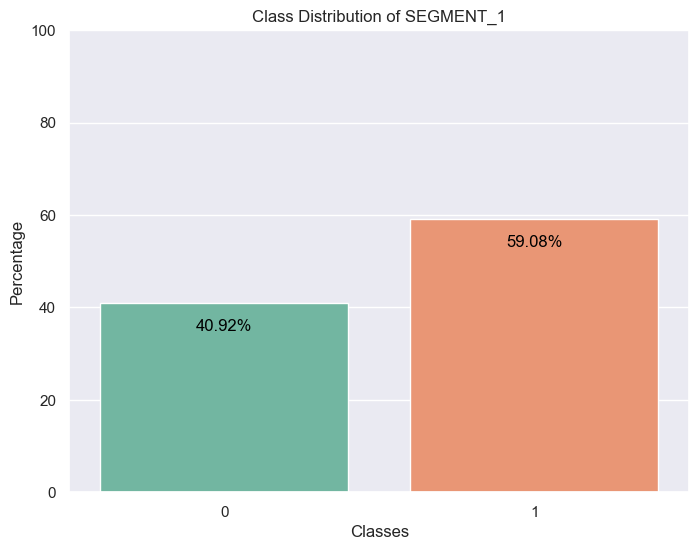

In [79]:
# Assuming class_counts is already computed with percentages
class_counts = model_data['SEGMENT_1'].value_counts(normalize=True) * 100

# Plot the class distribution
plt.figure(figsize=(8, 6))
colors = sns.color_palette("Set2")[:2]  # Limit the palette to 2 colors
ax = sns.barplot(x=class_counts.index, y=class_counts.values, palette=colors)

# Add percentage labels inside each bar, adjusting placement
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', 
                (p.get_x() + p.get_width() / 2., p.get_height() - 5),  # Position the label inside the bar
                ha='center', va='center', color='black', fontsize=12)

# Title and labels
plt.title('Class Distribution of SEGMENT_1')
plt.ylabel('Percentage')
plt.xlabel('Classes')
plt.ylim(0, 100)  # Set y-axis limit to ensure there's enough room for labels
plt.show()

60/40 split is good enough class balance in the target variable (Segment_1). We can proceed with next steps by maintaining this same slight imbalance across train test splits in upcoming steps. Here the classes are, 0- 'Core', 1- 'Up'

## Stratified Train-Test Split

Time to split train and test data. i choose a good enough 20% of data to testing keeping other part for training because of a good number of data available (7.5K observations total).

In [83]:
model_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 23 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   CUMSALES                                  7561 non-null   float64
 1   FREQUENCY                                 7561 non-null   float64
 2   AVERAGE_TICKET                            7561 non-null   float64
 3   RECENCY                                   7561 non-null   float64
 4   CONSISTENCY                               7561 non-null   float64
 5   SEGMENT_1                                 7561 non-null   int32  
 6   AGE                                       7561 non-null   float64
 7   LOYALTY_GROUP_Loyal                       7561 non-null   int64  
 8   LOYALTY_GROUP_Ocasional                   7561 non-null   int64  
 9   LOYALTY_GROUP_Split                       7561 non-null   int64  
 10  LOYALTY_GROUP_Vip                        

In [84]:
from sklearn.model_selection import train_test_split

# Linear model dataset
x = model_data.drop('SEGMENT_1', axis=1)  # Predictor columns
y = model_data['SEGMENT_1']               # Target variable

# Train-test split with stratification
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, stratify=y, random_state=1)

Stratification was applied during the initial train-test split to ensure that the class distribution in the target variable (SEGMENT_1) is proportionally represented in both the training and test sets. This is crucial for imbalanced classification problems, as it avoids bias in model evaluation and ensures that the test set reflects the real-world distribution of the target classes.

## PCA

Although not going to be implemented into the model, just doing this to know how it would turn out.

In [87]:
model_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 23 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   CUMSALES                                  7561 non-null   float64
 1   FREQUENCY                                 7561 non-null   float64
 2   AVERAGE_TICKET                            7561 non-null   float64
 3   RECENCY                                   7561 non-null   float64
 4   CONSISTENCY                               7561 non-null   float64
 5   SEGMENT_1                                 7561 non-null   int32  
 6   AGE                                       7561 non-null   float64
 7   LOYALTY_GROUP_Loyal                       7561 non-null   int64  
 8   LOYALTY_GROUP_Ocasional                   7561 non-null   int64  
 9   LOYALTY_GROUP_Split                       7561 non-null   int64  
 10  LOYALTY_GROUP_Vip                        

In [88]:
# List of numerical columns (float64 type) from dataset
columns_to_include = ['CUMSALES', 'FREQUENCY', 'AVERAGE_TICKET', 'RECENCY', 'CONSISTENCY', 'AGE']

# Creating the new DataFrame 'num_data' with only the selected numerical columns
num_data = model_data[columns_to_include].copy()

# Display the new DataFrame info to verify
num_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   CUMSALES        7561 non-null   float64
 1   FREQUENCY       7561 non-null   float64
 2   AVERAGE_TICKET  7561 non-null   float64
 3   RECENCY         7561 non-null   float64
 4   CONSISTENCY     7561 non-null   float64
 5   AGE             7561 non-null   float64
dtypes: float64(6)
memory usage: 413.5 KB


In [89]:
num_data.describe().T

,count,mean,std,min,25%,50%,75%,max
CUMSALES,7561.0,5.638482e-17,1.000066,-0.995693,-0.707614,-0.346994,0.324629,4.344515
FREQUENCY,7561.0,6.014381e-17,1.000066,-0.748322,-0.748322,-0.748322,0.655490,2.761207
AVERAGE_TICKET,7561.0,7.517976e-18,1.000066,-1.543541,-0.798491,-0.189948,0.621031,3.122194
RECENCY,7561.0,-9.303496e-17,1.000066,-1.330001,-0.878471,-0.262749,0.845550,2.076995
CONSISTENCY,7561.0,6.014381e-17,1.000066,-0.724761,-0.724761,-0.724761,0.786315,3.052928
AGE,7561.0,1.578775e-16,1.000066,-2.080734,-0.598641,-0.110166,0.393158,6.855153


All numercial features are already in scaled in form.

   Component  Explained Variance Ratio  Cumulative Explained Variance Ratio
0          1                  0.507246                             0.507246
1          2                  0.200068                             0.707313
2          3                  0.154415                             0.861728
3          4                  0.118946                             0.980674
4          5                  0.013588                             0.994262
5          6                  0.005738                             1.000000


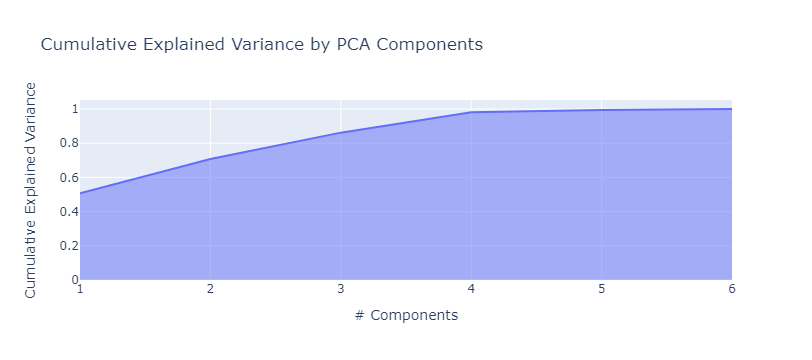

In [91]:
from sklearn.decomposition import PCA
import plotly.express as px

# Assuming 'num_data' is your scaled numerical dataset
pca = PCA()
pca.fit(num_data)

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Create a cumulative explained variance
exp_var_cumul = np.cumsum(explained_variance_ratio)

# Create a DataFrame for a table of explained variance
df_explained_variance = pd.DataFrame({
    "Component": range(1, len(explained_variance_ratio) + 1),
    "Explained Variance Ratio": explained_variance_ratio,
    "Cumulative Explained Variance Ratio": exp_var_cumul
})

# Display the DataFrame
print(df_explained_variance)

# Plot the cumulative explained variance using plotly
px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Cumulative Explained Variance"},
    title="Cumulative Explained Variance by PCA Components"
).show()


How do these new dimensions relate to our original 6 variables? Let’s examine how the original variables project onto the first two components.



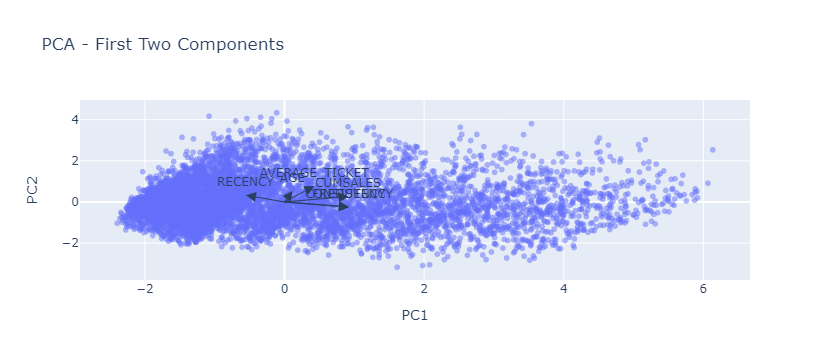

In [93]:
# List of your numerical features
features = ['CUMSALES', 'FREQUENCY', 'AVERAGE_TICKET', 'RECENCY', 'CONSISTENCY', 'AGE']

# Apply PCA to reduce to 2 components
pca = PCA(n_components=2)
components = pca.fit_transform(num_data)

# Get the loadings (correlation of each feature with the principal components)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# Create scatter plot of the first two principal components
fig = px.scatter(x=components[:, 0], y=components[:, 1], labels={'x': 'PC1', 'y': 'PC2'}, title="PCA - First Two Components", opacity= 0.5)

# Annotate the plot with feature names
for i, feature in enumerate(features):
    fig.add_annotation(
        ax=0, ay=0,
        axref="x", ayref="y",
        x=loadings[i, 0],
        y=loadings[i, 1],
        showarrow=True,
        arrowsize=2,
        arrowhead=2,
        xanchor="right",
        yanchor="top"
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        yshift=5,
    )

# Show the final plot
fig.show()


4 componenents explain most- 98% of the total variance. Dropping off the left out 2 compoenents is better as they only amount to less than 2% of total variance and thus we can thereby reduce dimensionality to an extent. We apply PCA with 4 components.

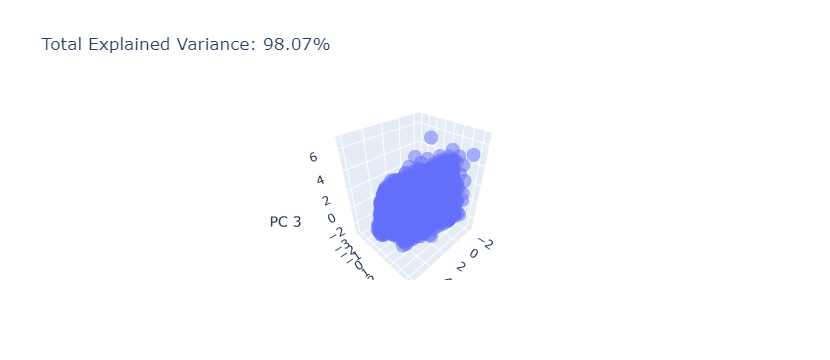

In [95]:
# Setting the number of components to 4
pca_4 = PCA(n_components=4)
components_4 = pca_4.fit_transform(num_data)

# Calculate the total variance explained by the "solution" of 4 components
total_var = pca_4.explained_variance_ratio_.sum() * 100

# Plotting a 3D scatter plot using the first 3 principal components
fig = px.scatter_3d(
    components_4, x=0, y=1, z=2,
    opacity= 0.5,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

In [96]:
# Create a new DataFrame with appropriate column names for the 4 principal components
data_pc_4 = pd.DataFrame(components_4, columns=['PC1', 'PC2', 'PC3', 'PC4'])

# Display the DataFrame with the principal components
data_pc_4

,PC1,PC2,PC3,PC4
0,-1.323349,0.091103,-0.687104,0.105848
1,-1.028868,0.844333,0.217720,1.344431
2,1.453591,0.642680,-1.057278,-0.332180
3,2.902479,-0.313900,2.806625,0.714700
4,-0.895076,0.513984,3.002227,-1.024102
...,...,...,...,...
7556,-0.976089,0.005727,2.789012,-1.162678
7557,-1.016056,-0.724264,1.122888,-1.321492
7558,-0.145599,0.551135,-0.995906,-1.954762
7559,-1.067307,-1.034568,0.629896,-1.350027


In [97]:
# Getting the names of the original features
feature_names = num_data.columns  # Use your numerical feature dataset

# Create a DataFrame to store the weights of each variable for each component
component_weights_df = pd.DataFrame(
    pca_4.components_,  # Adjusted for 4 components
    columns=feature_names,
    index=[f"Component {i+1}" for i in range(4)]  # 4 components
)

# Display the DataFrame with the component weights
component_weights_df

,CUMSALES,FREQUENCY,AVERAGE_TICKET,RECENCY,CONSISTENCY,AGE
Component 1,0.525089,0.526961,0.244727,-0.316388,0.531298,0.065759
Component 2,0.247993,-0.236718,0.711250,0.300925,-0.219109,0.487877
Component 3,-0.188231,0.077358,-0.397514,-0.207317,0.061491,0.868220
Component 4,0.071457,0.289258,-0.256798,0.875319,0.274380,0.061723


Since we are only leaving out 2 components by selecting 4 principal components, the value added by PCA may not be substantial enough to justify the loss in interpretability when evaluating model results. However, since our primary aim is to build the best predictive classification model rather than to interpret individual feature contributions, using PCA is a better choice as it reduces dimensionality and may improve model performance.

# 3- Building Predictive Models



#### Key Note
As we go ahead with model building by fine tuning hyparameters to make as a better model as possible, we use K-fold Cross-validation at 2 places- during hyperparameter tuning and final model evaluation for all the models. This CV is not being used to evaluate the base models in each model fitting due to computational limits and time constraints, but only after that to find optimal parameters during tuning and final model evaluation. To bring all the model performance metrics onto the same page inorder to make a valid comparison, random_seed= 1 is set across all models.

In [101]:
#Import necessary libraries for model building and evaluation
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_predict, StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

## 3.1 Parametric Models   

### 3.1.1 Logistic Regression

In [104]:
x.head()

,CUMSALES,FREQUENCY,AVERAGE_TICKET,RECENCY,CONSISTENCY,AGE,LOYALTY_GROUP_Loyal,LOYALTY_GROUP_Ocasional,LOYALTY_GROUP_Split,LOYALTY_GROUP_Vip,PRICE_GROUP_Moderately Price Insensitive,PRICE_GROUP_Moderately Price Sensitive,PRICE_GROUP_Selective Price Sensitive,PRICE_GROUP_Very Price Insensitive,PRICE_GROUP_Very Price Sensitive,GENDER_Female,GENDER_Male,MARITAL_STATUS_Divorced,MARITAL_STATUS_Married,MARITAL_STATUS_Single,MOSTUSED_PLATFORM_Mobile,MOSTUSED_PLATFORM_Web
1,-0.541602,-0.748322,-0.009761,0.681358,-0.724761,-0.632580,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1
2,-0.162795,-0.046416,-0.139138,1.707561,-0.724761,0.614972,0,1,0,0,0,0,0,0,1,1,0,0,1,0,1,0
3,1.400982,0.655490,1.151894,-0.344846,0.030777,-0.529552,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0
5,0.494357,2.059301,-0.540529,-0.960568,2.297391,2.516753,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,1
6,-0.801804,-0.748322,-0.888646,-1.083712,-0.724761,2.736446,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1


In [105]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7561 entries, 1 to 9503
Data columns (total 22 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   CUMSALES                                  7561 non-null   float64
 1   FREQUENCY                                 7561 non-null   float64
 2   AVERAGE_TICKET                            7561 non-null   float64
 3   RECENCY                                   7561 non-null   float64
 4   CONSISTENCY                               7561 non-null   float64
 5   AGE                                       7561 non-null   float64
 6   LOYALTY_GROUP_Loyal                       7561 non-null   int64  
 7   LOYALTY_GROUP_Ocasional                   7561 non-null   int64  
 8   LOYALTY_GROUP_Split                       7561 non-null   int64  
 9   LOYALTY_GROUP_Vip                         7561 non-null   int64  
 10  PRICE_GROUP_Moderately Price Insensitive 

In [106]:
y

1       0
2       0
3       0
5       0
6       0
       ..
9499    1
9500    1
9501    1
9502    1
9503    1
Name: SEGMENT_1, Length: 7561, dtype: int32

In [107]:
# Let's check the split of the data
print("{0:0.2f}% data is in training set".format((len(x_train)/len(model_data.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(x_test)/len(model_data.index)) * 100))

79.99% data is in training set
20.01% data is in test set


#### Baseline Model Fit

In [109]:
# Initialize the Logistic Regression model with the solver and random_state
logreg_model = LogisticRegression(solver="liblinear", random_state=1)

# Fit the model on the training data
logreg_model.fit(x_train, y_train)

# Predict on the test set
y_predict_logreg = logreg_model.predict(x_test)

#### Baseline Model Results

In [111]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

# Define a function to compute different metrics for classification models with model-specific names
def model_performance_classification_sklearn_with_threshold(model_name, model, predictors, target, threshold=0.5):
    """
    Function to compute different metrics, based on the threshold specified, to check classification model performance.

    model_name: string, name of the model for identification
    model: classifier model
    predictors: independent variables (features)
    target: dependent variable (target)
    threshold: threshold for classifying the observation as class 1
    """

    # Check if the model has predict_proba method
    if hasattr(model, "predict_proba"):
        pred_prob = model.predict_proba(predictors)[:, 1]
        pred = np.where(pred_prob > threshold, 1, 0)
    else:
        # For models without predict_proba, use predict directly
        pred = model.predict(predictors)

    # Calculate metrics
    acc = accuracy_score(target, pred)  # Accuracy
    recall = recall_score(target, pred)  # Recall
    precision = precision_score(target, pred, zero_division=0)  # Precision
    f1 = f1_score(target, pred)  # F1 Score

    # Creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Model": [model_name],
            "Accuracy": [acc],
            "Recall": [recall],
            "Precision": [precision],
            "F1 Score": [f1]
        }
    )

    return df_perf

In [112]:
from sklearn.metrics import confusion_matrix

def confusion_matrix_with_counts_and_percentage(model, predictors, target, threshold=0.5):
    """
    Function to compute and plot the confusion matrix for a classification model with both counts and percentages.

    model: classifier
    predictors: independent variables (features)
    target: dependent variable (actual labels)
    threshold: threshold for classifying the observation as class 1
    """
    # Check if the model has predict_proba method
    if hasattr(model, "predict_proba"):
        pred_prob = model.predict_proba(predictors)[:, 1]
        pred = np.where(pred_prob > threshold, model.classes_[1], model.classes_[0])
    else:
        # For models without predict_proba, use predict directly
        pred = model.predict(predictors)

    # Compute confusion matrix
    cm = confusion_matrix(target, pred, labels=model.classes_)

    # Compute percentages
    cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

    # Create an annotation matrix with counts and percentages
    annot = np.empty_like(cm).astype(str)
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            annot[i, j] = f'{cm[i, j]}\n{cm_percent[i, j]:.2f}%'

    # Plotting the confusion matrix with annotations for both counts and percentages
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=annot, fmt='', cmap='RdPu', cbar=False,
                xticklabels=model.classes_, yticklabels=model.classes_)
    plt.title('Confusion Matrix with Counts and Percentages')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

    return cm

Class mapping for 'SEGMENT_1': Core -> 0, Up -> 1


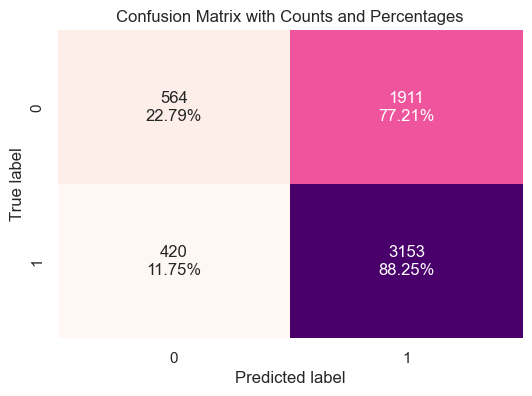

array([[ 564, 1911],
       [ 420, 3153]], dtype=int64)

In [113]:
# Print the class assignment for SEGMENT_1
print(f"Class mapping for 'SEGMENT_1': {le.classes_[0]} -> 0, {le.classes_[1]} -> 1")

# Confusion matrix for the training set
confusion_matrix_with_counts_and_percentage(logreg_model, x_train, y_train)

In [114]:
# Now we calculate measures of fit for the training set
log_reg_model_train_perf = model_performance_classification_sklearn_with_threshold('Logistic Regression',logreg_model, x_train, y_train)

# Calculating performance in the test set
log_reg_model_test_perf = model_performance_classification_sklearn_with_threshold('Logistic Regression',logreg_model, x_test, y_test)

# Combine both into a single table for comparison
log_reg_combined_perf = pd.concat([log_reg_model_train_perf, log_reg_model_test_perf], axis=0)
log_reg_combined_perf.index = ['Train', 'Test']  # Set index labels for clarity

# Display the combined performance table
print("Logistic Regression Training and Test Performance:")
log_reg_combined_perf.T

Logistic Regression Training and Test Performance:


,Train,Test
Model,Logistic Regression,Logistic Regression
Accuracy,0.614583,0.606742
Recall,0.882452,0.873602
Precision,0.62263,0.618369
F1 Score,0.730115,0.724154


display of coefficients alongside their corresponding variables.

In [116]:
# Create a DataFrame with coefficients and feature names
coef_df_logreg = pd.DataFrame(logreg_model.coef_.T, index=x_train.columns, columns=['Coefficient'])

# Add the intercept to the DataFrame
coef_df_logreg.loc['Intercept'] = logreg_model.intercept_

# Sort coefficients in descending order
coef_df_logreg = coef_df_logreg.sort_values(by='Coefficient', ascending=False)

# Display the coefficients DataFrame
print("Coefficients and Intercept:")
coef_df_logreg

Coefficients and Intercept:


,Coefficient
LOYALTY_GROUP_Vip,2.099112
LOYALTY_GROUP_Loyal,1.072741
Intercept,0.509945
MOSTUSED_PLATFORM_Web,0.444080
AVERAGE_TICKET,0.381331
GENDER_Female,0.324417
PRICE_GROUP_Moderately Price Insensitive,0.217088
MARITAL_STATUS_Single,0.197202
MARITAL_STATUS_Divorced,0.191661
PRICE_GROUP_Selective Price Sensitive,0.188782


#### Classification Metrics Using K-fold CV
With a slight class imbalance in the target variable- segment_1(60-40), a stratified K-fold does a good job at maintaining balanced proportions in each split.

In [118]:
from sklearn.model_selection import cross_val_predict, StratifiedKFold

# Deploying Stratified K-fold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

# Get cross-validated predictions for the entire dataset
y_pred_cv_logreg = cross_val_predict(logreg_model, x, y, cv=skf)

# Calculate metrics using the cross-validated predictions
accuracy_cv_logreg = accuracy_score(y, y_pred_cv_logreg)
precision_cv_logreg = precision_score(y, y_pred_cv_logreg)
recall_cv_logreg = recall_score(y, y_pred_cv_logreg)
f1_cv_logreg = f1_score(y, y_pred_cv_logreg)

# Creating a summary table for the CV results specific to Logistic Regression
logreg_cv_metrics = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Cross-Validated Score': [accuracy_cv_logreg, precision_cv_logreg, recall_cv_logreg, f1_cv_logreg]
})

# Display the metrics summary after cross-validation
print("Cross-Validation Performance for Logistic Regression:")
logreg_cv_metrics

Cross-Validation Performance for Logistic Regression:


,Metric,Cross-Validated Score
0,Accuracy,0.613675
1,Precision,0.621503
2,Recall,0.885158
3,F1 Score,0.730261


#### Confusion Matrix

Class mapping for 'SEGMENT_1': Core -> 0, Up -> 1


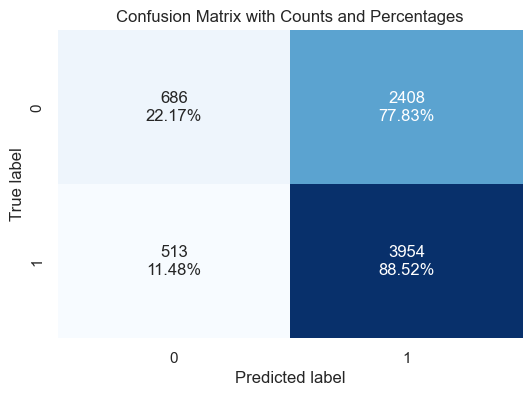

array([[ 686, 2408],
       [ 513, 3954]], dtype=int64)

In [120]:
#creating function that charts confusion matrix for CV results
def confusion_matrix_with_cv_predictions(y_true, y_pred, labels):
    """
    Function to compute and plot the confusion matrix with both counts and percentages using precomputed predictions.

    y_true: actual labels
    y_pred: predicted labels
    labels: model classes or label names
    """
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=labels)

    # Compute percentages
    cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

    # Create an annotation matrix with counts and percentages
    annot = np.empty_like(cm).astype(str)
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            annot[i, j] = f'{cm[i, j]}\n{cm_percent[i, j]:.2f}%'

    # Plot the confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=annot, fmt='', cmap='Blues', cbar=False, xticklabels=labels, yticklabels=labels)
    plt.title('Confusion Matrix with Counts and Percentages')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

    return cm  # Return the confusion matrix for further analysis if needed

# Print the class assignment for SEGMENT_1
print(f"Class mapping for 'SEGMENT_1': {le.classes_[0]} -> 0, {le.classes_[1]} -> 1")

# Plot confusion matrix for CV predictions
confusion_matrix_with_cv_predictions(y, y_pred_cv_logreg, labels=logreg_model.classes_)


### 3.1.2 Lasso
To avoid not so useful steps and that we have to tune parameters we jump straight into finding the optimal value for C (inverse alpha for logreg specific) for our Lasso model to build best lasso model directly.

#### Hyperparameter Tuning Using K-fold CV

Best C for Logistic Regression with Lasso: 0.0869 with Accuracy: 0.6171


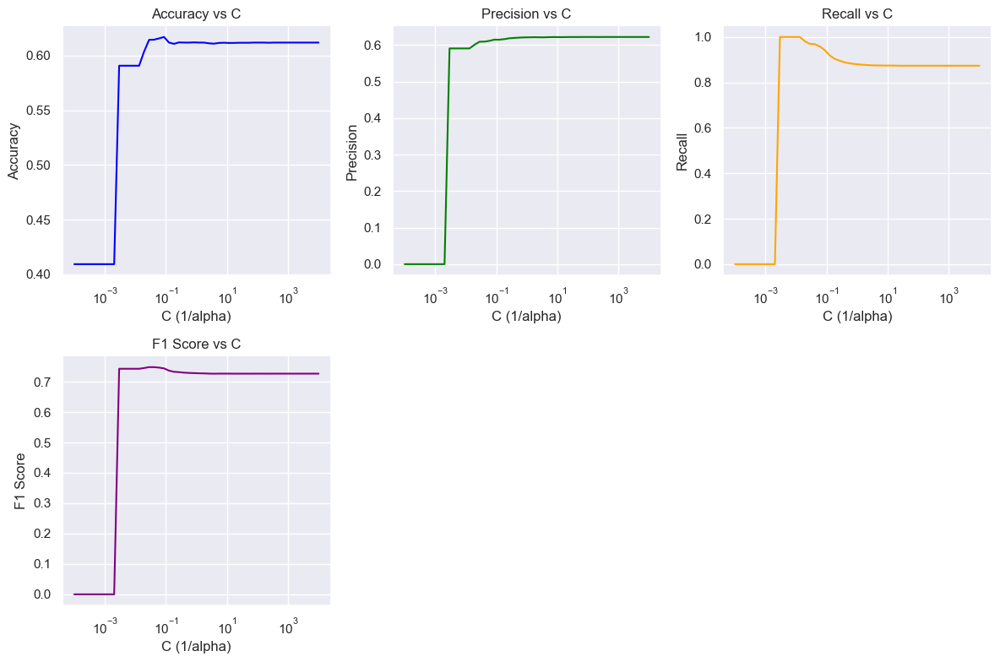

In [123]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.exceptions import UndefinedMetricWarning

# Suppress UndefinedMetricWarning
warnings.filterwarnings("ignore", category=UndefinedMetricWarning)

# Define a range of C values (inverse of alpha in Logistic Regression)
C_values = np.logspace(-4, 4, 50)  # Similar to alpha, where C is 1/alpha

# Initialize variables to store the best scores and corresponding C
best_accuracy = 0
best_C = None

# Lists to store metrics for each C value
accuracy_values = []
precision_values = []
recall_values = []
f1_values = []

# Perform cross-validation with StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

# Iterate over the C values (regularization strengths)
for C in C_values:
    logreg_lasso = LogisticRegression(penalty='l1', solver='liblinear', C=C, random_state=1)  # Logistic Regression with L1 regularization

    # Cross-validate the model
    cv_accuracy_scores = cross_val_score(logreg_lasso, x_train, y_train, cv=skf, scoring='accuracy')
    cv_precision_scores = cross_val_score(logreg_lasso, x_train, y_train, cv=skf, scoring='precision')
    cv_recall_scores = cross_val_score(logreg_lasso, x_train, y_train, cv=skf, scoring='recall')
    cv_f1_scores = cross_val_score(logreg_lasso, x_train, y_train, cv=skf, scoring='f1')

    # Calculate average cross-validation score for each metric
    accuracy = np.mean(cv_accuracy_scores)
    precision = np.mean(cv_precision_scores)
    recall = np.mean(cv_recall_scores)
    f1 = np.mean(cv_f1_scores)

    # Store metrics for plotting
    accuracy_values.append(accuracy)
    precision_values.append(precision)
    recall_values.append(recall)
    f1_values.append(f1)

    # Update the best score and C value based on accuracy
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_C = C

# Print the best C value and corresponding accuracy
print(f"Best C for Logistic Regression with Lasso: {best_C:.4f} with Accuracy: {best_accuracy:.4f}")

# Plot the metrics against C values
plt.figure(figsize=(12, 8))

# Accuracy plot
plt.subplot(2, 3, 1)
plt.plot(C_values, accuracy_values, label='Accuracy', color='blue')
plt.xscale('log')
plt.xlabel('C (1/alpha)')
plt.ylabel('Accuracy')
plt.title('Accuracy vs C')

# Precision plot
plt.subplot(2, 3, 2)
plt.plot(C_values, precision_values, label='Precision', color='green')
plt.xscale('log')
plt.xlabel('C (1/alpha)')
plt.ylabel('Precision')
plt.title('Precision vs C')

# Recall plot
plt.subplot(2, 3, 3)
plt.plot(C_values, recall_values, label='Recall', color='orange')
plt.xscale('log')
plt.xlabel('C (1/alpha)')
plt.ylabel('Recall')
plt.title('Recall vs C')

# F1 Score plot
plt.subplot(2, 3, 4)
plt.plot(C_values, f1_values, label='F1 Score', color='purple')
plt.xscale('log')
plt.xlabel('C (1/alpha)')
plt.ylabel('F1 Score')
plt.title('F1 Score vs C')

plt.tight_layout()
plt.show()

#### Optimal Model Fit

#### Classification Metrics Using K-fold CV 

In [126]:
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd

# Define the model
final_logreg_lasso = LogisticRegression(penalty='l1', solver='liblinear', C=best_C, random_state=1)

# Set up Stratified K-Fold cross-validation (e.g., 5 folds)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

# Get cross-validated predictions on the train set
y_pred_cv_train = cross_val_predict(final_logreg_lasso, x_train, y_train, cv=skf)

# Calculate metrics for cross-validated train set predictions
cv_accuracy_train = accuracy_score(y_train, y_pred_cv_train)
cv_precision_train = precision_score(y_train, y_pred_cv_train, zero_division=0)
cv_recall_train = recall_score(y_train, y_pred_cv_train)
cv_f1_train = f1_score(y_train, y_pred_cv_train)

# Fit the model on the entire train set and evaluate on the test set
final_logreg_lasso.fit(x_train, y_train)
y_pred_test = final_logreg_lasso.predict(x_test)

# Calculate metrics on the test set
accuracy_test = accuracy_score(y_test, y_pred_test)
precision_test = precision_score(y_test, y_pred_test, zero_division=0)
recall_test = recall_score(y_test, y_pred_test)
f1_test = f1_score(y_test, y_pred_test)

# Creating a DataFrame to compare metrics between cross-validated train set and test set
lasso_metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Lasso Train': [cv_accuracy_train, cv_precision_train, cv_recall_train, cv_f1_train],
    'Lasso Test': [accuracy_test, precision_test, recall_test, f1_test]
})

# Display the DataFrame with the performance metrics
print("Final Performance Metrics of Lasso after Tuning:")
lasso_metrics_df

Final Performance Metrics of Lasso after Tuning:


,Metric,Lasso Train,Lasso Test
0,Accuracy,0.617063,0.606742
1,Precision,0.614795,0.609846
2,Recall,0.942065,0.928412
3,F1 Score,0.744032,0.736142


#### Confusion Matrix

Class mapping for 'SEGMENT_1': Core -> 0, Up -> 1


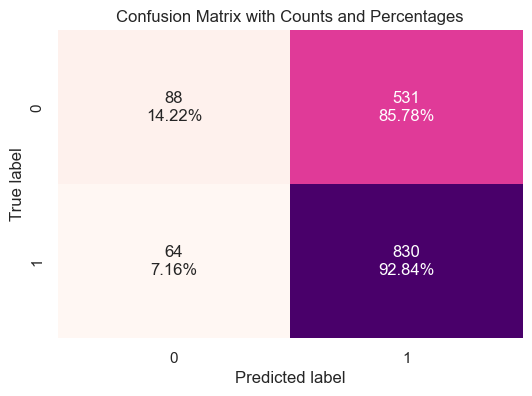

array([[ 88, 531],
       [ 64, 830]], dtype=int64)

In [128]:
# Print the class assignment for SEGMENT_1
print(f"Class mapping for 'SEGMENT_1': {le.classes_[0]} -> 0, {le.classes_[1]} -> 1")

# Confusion matrix for the test set
confusion_matrix_with_counts_and_percentage(final_logreg_lasso, x_test, y_test)

#### Feature Importance

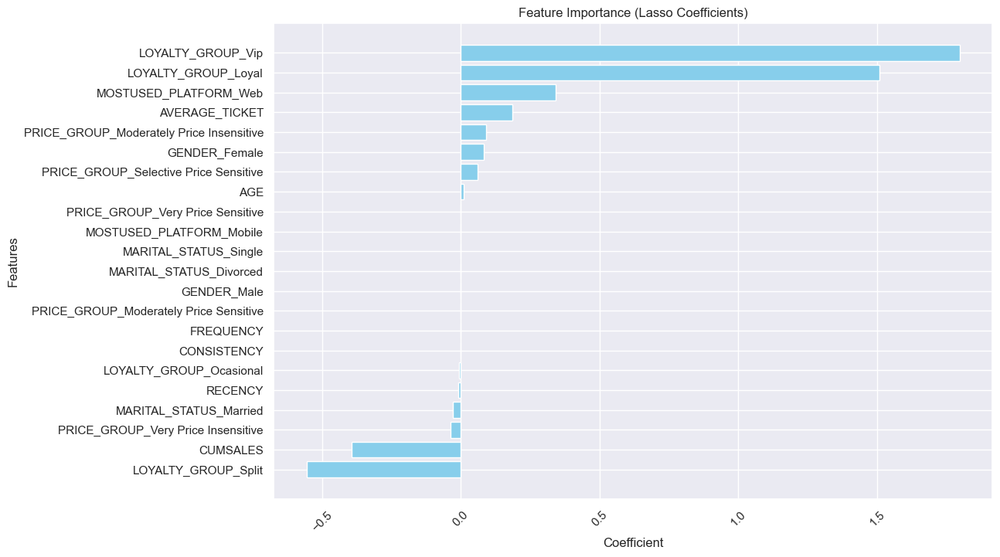

Feature Importance (Lasso Coefficients):


,Feature,Coefficient
0,LOYALTY_GROUP_Vip,1.798204
1,LOYALTY_GROUP_Loyal,1.507323
2,MOSTUSED_PLATFORM_Web,0.340726
3,AVERAGE_TICKET,0.185441
4,PRICE_GROUP_Moderately Price Insensitive,0.089952
5,GENDER_Female,0.082822
6,PRICE_GROUP_Selective Price Sensitive,0.060733
7,AGE,0.011581
8,PRICE_GROUP_Very Price Sensitive,0.000000
9,MOSTUSED_PLATFORM_Mobile,0.000000


In [130]:
# Retrieve the coefficients from the final Lasso model
lasso_coefficients = final_logreg_lasso.coef_[0]

# Create a DataFrame to display the coefficients alongside their corresponding feature names
lasso_coefficients_df = pd.DataFrame({
    'Feature': x_train.columns,  # Feature names
    'Coefficient': lasso_coefficients  # Lasso coefficients
})

# Sort the DataFrame based on Lasso coefficients for better clarity
lasso_coefficients_df = lasso_coefficients_df.sort_values(by='Coefficient', ascending=False).reset_index(drop=True)

# Plot the feature importance (coefficients)
plt.figure(figsize=(12, 8))  # Adjusting the size to accommodate many features
bars = plt.barh(lasso_coefficients_df['Feature'], lasso_coefficients_df['Coefficient'], color='skyblue')

# Make the plot scrollable by rotating labels and adjusting limits
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.xlabel('Coefficient')
plt.ylabel('Features')
plt.title('Feature Importance (Lasso Coefficients)')
plt.xticks(rotation=45)

# Display a horizontal scrollable plot by adjusting figsize width and label size
plt.show()

# Display the coefficients in a table
print("Feature Importance (Lasso Coefficients):")
lasso_coefficients_df



## 3.2 Non-Parametric Models

### 3.2.1 Random Forest

#### Baseline Model Fit
First, let's create a base model with 'n_estimators' set to 10, without specifying any other parameters.

In [134]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier

# Create a classifier object (instead of regressor)
rf_classifier = RandomForestClassifier(n_estimators=10, random_state=1)  # Specify 10 trees

# Fit the classifier with the training data
rf_classifier.fit(x_train, y_train)

RandomForestClassifier(n_estimators=10, random_state=1)

In [135]:
# We have created the model "rf_classifier", and it has been trained
# Let's see the specifications of the model created:
params_rf_classifier = rf_classifier.get_params()
print(params_rf_classifier)

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': 1, 'verbose': 0, 'warm_start': False}


Note that if we print params_rf_regressor (the variable containing the model's 'specifications'), we can see that MSE is the error criterion used, and the bootstrap option is set to TRUE. Additionally, there is no indication of the tree's depth or other parameters. Let's examine the results:

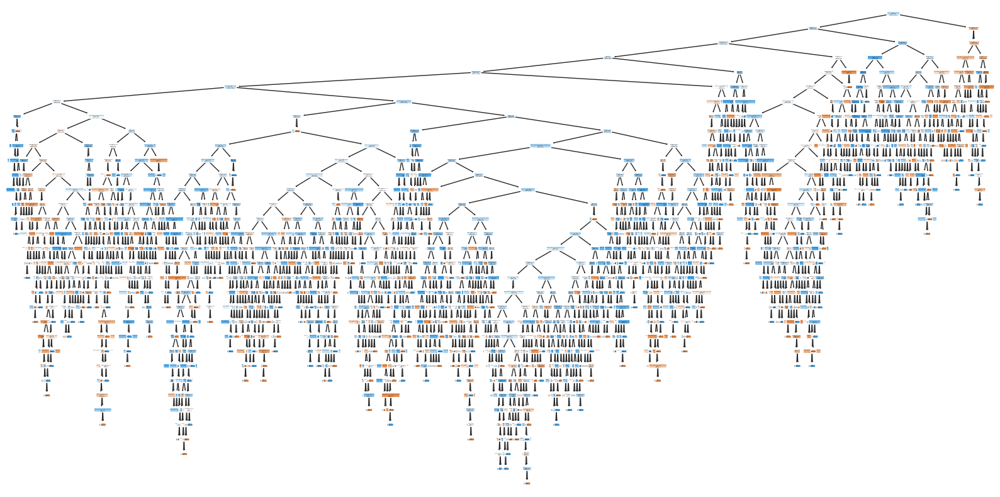

In [137]:
# Import necessary library for tree plotting
from sklearn.tree import plot_tree

# Choose one of the trees from the "Forest"
tree = rf_classifier.estimators_[1]  # Randomly picking the 2nd tree in the forest

# Plot the tree
plt.figure(figsize=(20,10))
plot_tree(tree, filled=True, feature_names=x_train.columns, rounded=True)
plt.savefig('decision_tree.jpg', format='jpg', dpi=300, bbox_inches='tight')
plt.show()

Examining a single tree in the 'forest' reveals a high level of complexity.

#### Baseline Model Results

In [140]:
# Make predictions on the training data
y_train_rf_base_pred = rf_classifier.predict(x_train)

# Calculate accuracy, precision, recall, F1-score for the training data
accuracy_train_rf_base = accuracy_score(y_train, y_train_rf_base_pred)
precision_train_rf_base = precision_score(y_train, y_train_rf_base_pred, average='binary', zero_division=0)
recall_train_rf_base = recall_score(y_train, y_train_rf_base_pred, average='binary')
f1_train_rf_base = f1_score(y_train, y_train_rf_base_pred, average='binary')

# Make predictions using the model on the test data
y_test_rf_base_pred = rf_classifier.predict(x_test)

# Calculate accuracy, precision, recall, F1-score for the test data
accuracy_test_rf_base = accuracy_score(y_test, y_test_rf_base_pred)
precision_test_rf_base = precision_score(y_test, y_test_rf_base_pred, average='binary', zero_division=0)
recall_test_rf_base = recall_score(y_test, y_test_rf_base_pred, average='binary')
f1_test_rf_base = f1_score(y_test, y_test_rf_base_pred, average='binary')

# Create a summary table
metrics = {
    'Accuracy': {'Train': accuracy_train_rf_base, 'Test': accuracy_test_rf_base},
    'Precision': {'Train': precision_train_rf_base, 'Test': precision_test_rf_base},
    'Recall': {'Train': recall_train_rf_base, 'Test': recall_test_rf_base},
    'F1 Score': {'Train': f1_train_rf_base, 'Test': f1_test_rf_base}
}

# Create the DataFrame from the dictionary
metrics_rf_base_df = pd.DataFrame(metrics)
print('Results for Basic RF model')
metrics_rf_base_df.T

Results for Basic RF model


,Train,Test
Accuracy,0.983300,0.575677
Precision,0.992063,0.645161
Recall,0.979569,0.626398
F1 Score,0.985777,0.635641


#### Hyperparameter Tuning Using K-fold CV
The significant drop in test accuracy than tarin accuracy shows that the model was overfit. It is time to prune it.

 Let's develop a function to determine the optimal maximum tree depth, number of trees, and the best variable selection for splits, with the goal of minimizing the test MSE. The general range for max_depth and n_estimators is set and can be increased if those limits for both those parameters are touched. It is kind of dynamic tuning approach.

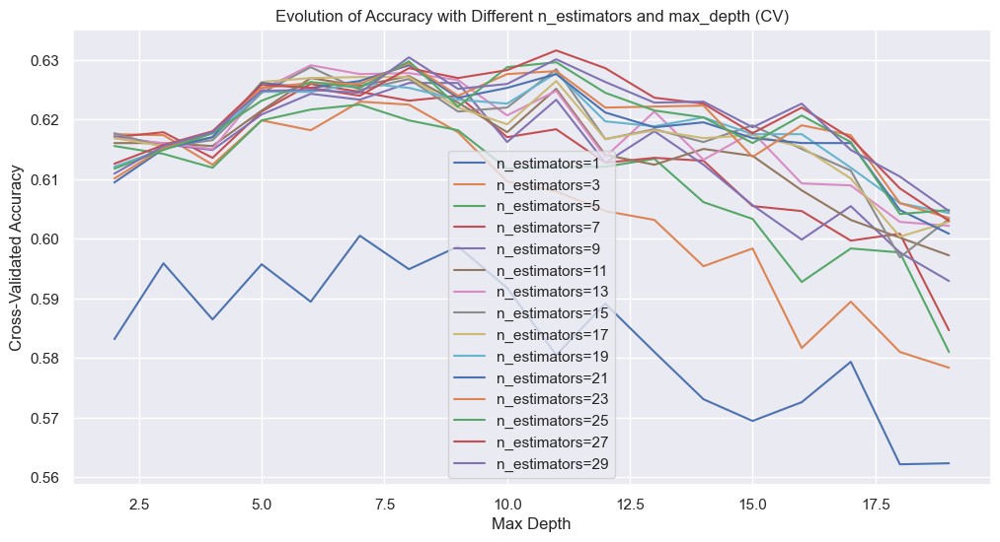

Optimal n_estimators: 27, Optimal max_depth: 11, Optimal Accuracy: 0.6316


In [143]:
from sklearn.model_selection import cross_val_score

def find_optimal_rf_params_and_plot_cv(x_train, y_train, n_estimators_range, max_depth_range, cv=5):
    # Initialize variables to store the optimal parameters and results for plotting
    max_accuracy = 0
    best_n_estimators = None
    best_max_depth = None
    plot_data = []

    # Iterate over all combinations of n_estimators and max_depth
    for n_estimators in n_estimators_range:
        for max_depth in max_depth_range:
            # Create RandomForestClassifier model
            rf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=1)

            # Perform cross-validation
            cv_scores = cross_val_score(rf, x_train, y_train, cv=cv, scoring='accuracy')

            # Calculate mean CV accuracy
            accuracy = cv_scores.mean()
            plot_data.append((n_estimators, max_depth, accuracy))

            # Update the optimal parameters if current accuracy is higher than max_accuracy
            if accuracy > max_accuracy:
                max_accuracy = accuracy
                best_n_estimators = n_estimators
                best_max_depth = max_depth

    # Plotting the results
    plot_df = pd.DataFrame(plot_data, columns=['n_estimators', 'max_depth', 'Accuracy'])
    fig, ax = plt.subplots(figsize=(12, 6))
    for n_estimator in n_estimators_range:
        subset = plot_df[plot_df['n_estimators'] == n_estimator]
        ax.plot(subset['max_depth'], subset['Accuracy'], label=f'n_estimators={n_estimator}')

    ax.set_xlabel('Max Depth')
    ax.set_ylabel('Cross-Validated Accuracy')
    ax.set_title('Evolution of Accuracy with Different n_estimators and max_depth (CV)')
    ax.legend()
    plt.show()

    return best_n_estimators, best_max_depth, max_accuracy

# Example usage with CV
n_estimators_range = range(1, 30, 2)  # Define ranges for n_estimators and max_depth
max_depth_range = range(2, 20)

optimal_n_estimators, optimal_max_depth, optimal_accuracy = find_optimal_rf_params_and_plot_cv(
    x_train, y_train, n_estimators_range, max_depth_range, cv=5
)

print(f"Optimal n_estimators: {optimal_n_estimators}, Optimal max_depth: {optimal_max_depth}, Optimal Accuracy: {optimal_accuracy:.4f}")


#### Optimal Model Fit
An optimal model, consisting of 27 trees with a maximum depth of 11 per tree, is identified for achieving the maximum accuracy. This suggests the inference of complex trees. But, with a patient and closer look at the graph would tell us that the model with n_estimators= 9 and max depth= 8 (slight eyeballing) performs as good as this best model, yet this one is much simpler than the best model found and giving CV accuracy almost very much close to that of the best model. So, it is best to prefer the model with 9 tress and depth of 8 that gives very good accuracy among all of these.

#### Classification Metrics Using K-fold CV

In [146]:
# Create the optimal RandomForestClassifier
optim_rf_classifier = RandomForestClassifier(n_estimators= 9, max_depth= 8, random_state=1)

# Perform cross-validation to evaluate performance on the training data (using accuracy, precision, recall, F1 score)
cv_accuracy_scores = cross_val_score(optim_rf_classifier, x_train, y_train, cv=5, scoring='accuracy')
cv_precision_scores = cross_val_score(optim_rf_classifier, x_train, y_train, cv=5, scoring='precision')
cv_recall_scores = cross_val_score(optim_rf_classifier, x_train, y_train, cv=5, scoring='recall')
cv_f1_scores = cross_val_score(optim_rf_classifier, x_train, y_train, cv=5, scoring='f1')

# Calculate mean CV scores
cv_accuracy = cv_accuracy_scores.mean()
cv_precision = cv_precision_scores.mean()
cv_recall = cv_recall_scores.mean()
cv_f1 = cv_f1_scores.mean()

# Now, fit the model on the full training data
optim_rf_classifier.fit(x_train, y_train)

# Predict on the test data
y_test_rf_optim_pred = optim_rf_classifier.predict(x_test)

# Calculate test set metrics
accuracy_test_rf_optim = accuracy_score(y_test, y_test_rf_optim_pred)
precision_test_rf_optim = precision_score(y_test, y_test_rf_optim_pred, zero_division=0)
recall_test_rf_optim = recall_score(y_test, y_test_rf_optim_pred)
f1_test_rf_optim = f1_score(y_test, y_test_rf_optim_pred)

# Creating a DataFrame to compare metrics between cross-validated train set and test set
rf_metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'RF Train': [cv_accuracy, cv_precision, cv_recall, cv_f1],
    'RFTest': [accuracy_test_rf_optim, precision_test_rf_optim, recall_test_rf_optim, f1_test_rf_optim]
})

# Display the DataFrame with the performance metrics
print("Performance Metrics of Random Forest:")
rf_metrics_df

Performance Metrics of Random Forest:


,Metric,RF Train,RFTest
0,Accuracy,0.626158,0.638467
1,Precision,0.624058,0.629963
2,Recall,0.923881,0.940716
3,F1 Score,0.744872,0.754598


Again, graph for 1 tree:

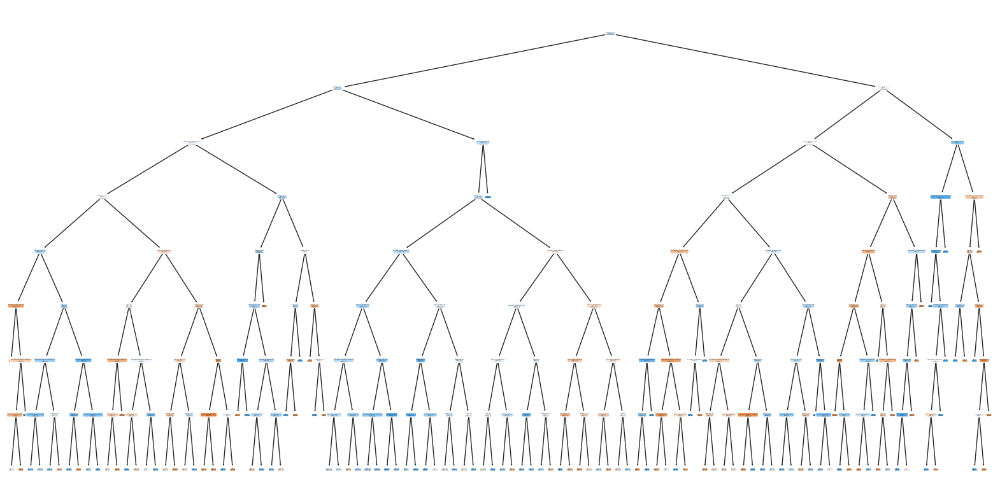

In [148]:
# Choose one tree from the forest
tree = optim_rf_classifier.estimators_[0]

# Plot the tree
plt.figure(figsize=(20,10))
plot_tree(tree, filled=True, feature_names=x_train.columns, rounded=True)
plt.show()

#### Confusion Matrix

Class mapping for 'SEGMENT_1': Core -> 0, Up -> 1


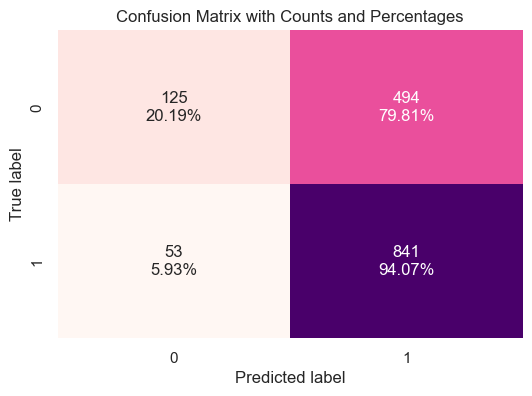

array([[125, 494],
       [ 53, 841]], dtype=int64)

In [150]:
# Print the class assignment for SEGMENT_1
print(f"Class mapping for 'SEGMENT_1': {le.classes_[0]} -> 0, {le.classes_[1]} -> 1")

# We've already defined the function `confusion_matrix_with_counts_and_percentage` earlier

# Call the function to display the confusion matrix for the Random Forest model
confusion_matrix_with_counts_and_percentage(optim_rf_classifier, x_test, y_test)

#### Feature Importance
Lets see the feature importance of each independent variable in our improvized model, *optim_rf_classifier*.

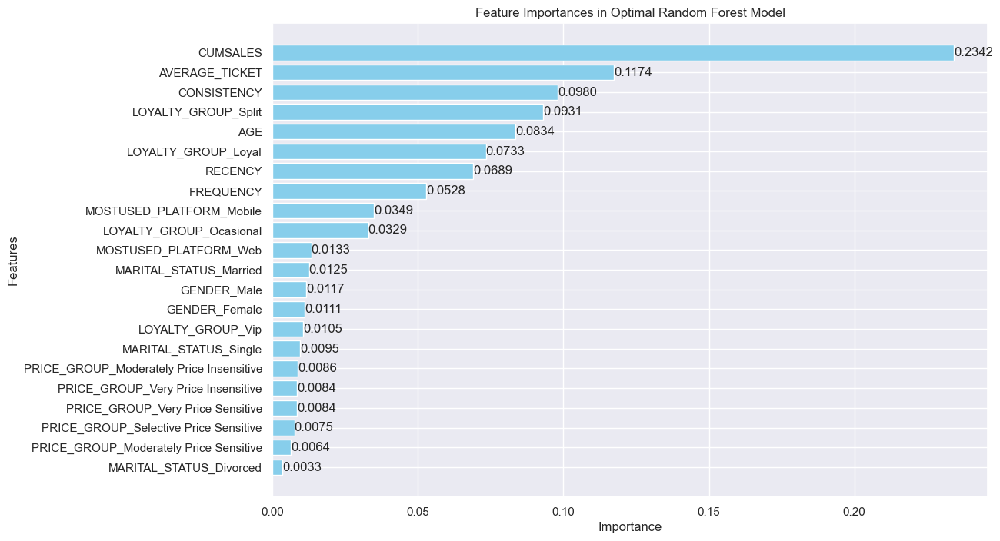

Feature Importances (Random Forest):


,Feature,Importance
0,CUMSALES,0.234167
1,AVERAGE_TICKET,0.117373
2,CONSISTENCY,0.098007
3,LOYALTY_GROUP_Split,0.093090
4,AGE,0.083430
5,LOYALTY_GROUP_Loyal,0.073319
6,RECENCY,0.068930
7,FREQUENCY,0.052817
8,MOSTUSED_PLATFORM_Mobile,0.034877
9,LOYALTY_GROUP_Ocasional,0.032877


In [152]:
# Get feature importances
feature_importances = optim_rf_classifier.feature_importances_

# Create a DataFrame for feature importances
RF_coefficients_df = pd.DataFrame({
    'Feature': x_train.columns,  # Feature names
    'Importance': feature_importances  # Feature importance from Random Forest
})

# Sort the DataFrame by importance for better clarity
RF_coefficients_df = RF_coefficients_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Plot the feature importances (horizontal bar chart)
plt.figure(figsize=(12, 8))  # Adjust the size to accommodate many features
bars = plt.barh(RF_coefficients_df['Feature'], RF_coefficients_df['Importance'], color='skyblue')

# Add importance values on top of bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():.4f}', va='center')

# Invert y-axis for better readability
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances in Optimal Random Forest Model')

# Display a horizontal scrollable plot by adjusting figsize width and label size
plt.show()

# Display the feature importances in a table
print("Feature Importances (Random Forest):")
RF_coefficients_df

### 3.2.2 Gradient Boost

#### Baseline Model Fit
To identify the best model, let's begin with a base Gradient Boosting model, setting *n_estimators* to 10, similar to our initial approach with the Random Forest base model.

In [155]:
# Import necessary libraries
from sklearn.ensemble import GradientBoostingClassifier

# Create a Gradient Boosting classifier object
gb_classifier = GradientBoostingClassifier(n_estimators=10, random_state=1)  # Specify 10 boosting stages (trees)

# Fit the classifier with the training data
gb_classifier.fit(x_train, y_train)

GradientBoostingClassifier(n_estimators=10, random_state=1)

In [156]:
# Get the parameters of the Gradient Boosting classifier model
params_gb_classifier = gb_classifier.get_params()

# Print the parameters
print(params_gb_classifier)

{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 10, 'n_iter_no_change': None, 'random_state': 1, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


Note that if we print params_gb_regressor (the variable containing the model's 'specifications'), we can see that the error criterion used is the friedman_mse, and the *max_depth* is set to 3 as a default value. Let's examine the results:

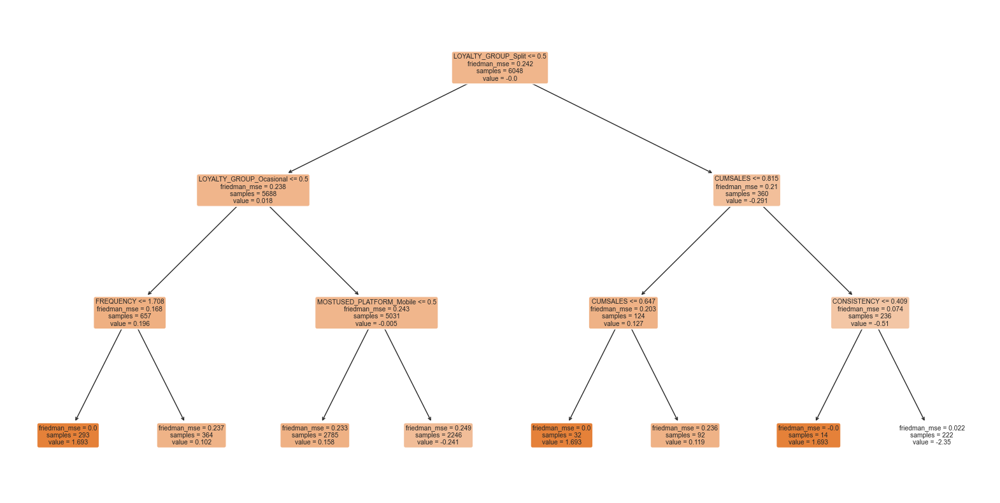

In [158]:
from sklearn.tree import plot_tree

# Choose which tree to visualize (0 for the first tree)
tree_index = 0

# Extract the tree from the classifier (use estimators_)
single_tree = gb_classifier.estimators_[tree_index, 0]

# Plot the specified decision tree
plt.figure(figsize=(20, 10))
plot_tree(single_tree, filled=True, feature_names=x_train.columns, rounded=True)
plt.show()

#### Baseline Model Results
The tree is both clear and easily interpretable, unlike in Random Forest. Now, let's review the performance measures, R-squared and MSE, for both the training and testing evaluations.

In [160]:
# Make predictions on the training data
y_train_gb_base_pred = gb_classifier.predict(x_train)

# Calculate accuracy, precision, recall, F1-score for the training data
accuracy_train_gb_base = accuracy_score(y_train, y_train_gb_base_pred)
precision_train_gb_base = precision_score(y_train, y_train_gb_base_pred, average='binary', zero_division=0)
recall_train_gb_base = recall_score(y_train, y_train_gb_base_pred, average='binary')
f1_train_gb_base = f1_score(y_train, y_train_gb_base_pred, average='binary')

# Make predictions using the model on the test data
y_test_gb_base_pred = gb_classifier.predict(x_test)

# Calculate accuracy, precision, recall, F1-score for the test data
accuracy_test_gb_base = accuracy_score(y_test, y_test_gb_base_pred)
precision_test_gb_base = precision_score(y_test, y_test_gb_base_pred, average='binary', zero_division=0)
recall_test_gb_base = recall_score(y_test, y_test_gb_base_pred, average='binary')
f1_test_gb_base = f1_score(y_test, y_test_gb_base_pred, average='binary')

# Create a summary table
metrics_gb_base = {
    'Accuracy': {'Train': accuracy_train_gb_base, 'Test': accuracy_test_gb_base},
    'Precision': {'Train': precision_train_gb_base, 'Test': precision_test_gb_base},
    'Recall': {'Train': recall_train_gb_base, 'Test': recall_test_gb_base},
    'F1 Score': {'Train': f1_train_gb_base, 'Test': f1_test_gb_base}
}

# Create the DataFrame from the dictionary
metrics_gb_base_df = pd.DataFrame(metrics_gb_base)
print('Results for Basic GB model')
metrics_gb_base_df.T

Results for Basic GB model


,Train,Test
Accuracy,0.626653,0.627231
Precision,0.612953,0.613324
Recall,0.998601,0.998881
F1 Score,0.759634,0.760000


#### Hyperparameter Tuning Using K-fold CV
All the train and test metrics are very close. Seems like we have hit the right parameters for the trees. Let's check.

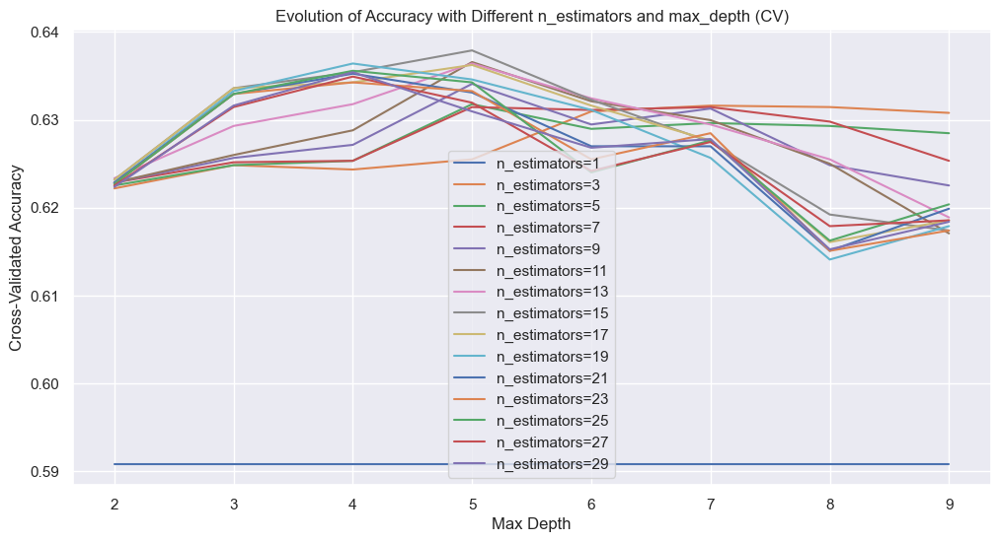

Optimal n_estimators: 15, Optimal max_depth: 5, Optimal Accuracy: 0.6379


In [162]:
def find_optimal_gb_params_and_plot_cv(x_train, y_train, n_estimators_range, max_depth_range, cv=5):
    # Initialize variables to store the optimal parameters and results for plotting
    max_accuracy = 0
    best_n_estimators = None
    best_max_depth = None
    plot_data = []

    # Iterate over all combinations of n_estimators and max_depth
    for n_estimators in n_estimators_range:
        for max_depth in max_depth_range:
            # Create GradientBoostingClassifier model
            gb = GradientBoostingClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=1)

            # Perform cross-validation
            cv_scores = cross_val_score(gb, x_train, y_train, cv=cv, scoring='accuracy')

            # Calculate mean CV accuracy
            accuracy = cv_scores.mean()
            plot_data.append((n_estimators, max_depth, accuracy))

            # Update the optimal parameters if current accuracy is higher than max_accuracy
            if accuracy > max_accuracy:
                max_accuracy = accuracy
                best_n_estimators = n_estimators
                best_max_depth = max_depth

    # Plotting the results
    plot_df = pd.DataFrame(plot_data, columns=['n_estimators', 'max_depth', 'Accuracy'])
    fig, ax = plt.subplots(figsize=(12, 6))
    for n_estimator in n_estimators_range:
        subset = plot_df[plot_df['n_estimators'] == n_estimator]
        ax.plot(subset['max_depth'], subset['Accuracy'], label=f'n_estimators={n_estimator}')

    ax.set_xlabel('Max Depth')
    ax.set_ylabel('Cross-Validated Accuracy')
    ax.set_title('Evolution of Accuracy with Different n_estimators and max_depth (CV)')
    ax.legend()
    plt.show()

    return best_n_estimators, best_max_depth, max_accuracy

# Example usage with CV
n_estimators_range = range(1, 30, 2)  # Define ranges for n_estimators and max_depth
max_depth_range = range(2, 10)

optimal_n_estimators, optimal_max_depth, optimal_accuracy = find_optimal_gb_params_and_plot_cv(
    x_train, y_train, n_estimators_range, max_depth_range, cv=5
)

print(f"Optimal n_estimators: {optimal_n_estimators}, Optimal max_depth: {optimal_max_depth}, Optimal Accuracy: {optimal_accuracy:.4f}")


#### Optimal Model Fit
A model with 15 trees and a maximum depth of 5 per tree is optimal for achieving the higher accuracy.

In [164]:
# Create the optimal GradientBoostingClassifier
optim_gb_classifier = GradientBoostingClassifier(n_estimators=optimal_n_estimators, max_depth=optimal_max_depth, random_state=1)

#### Classification Metrics Using K-fold CV
Let's examine the measures of fit for this optimal model, both for training and testing.

In [166]:
# Create the optimal GradientBoostingClassifier
optim_gb_classifier = GradientBoostingClassifier(n_estimators=optimal_n_estimators, max_depth=optimal_max_depth, random_state=1)

# Perform cross-validation to evaluate performance on the training data (using accuracy, precision, recall, F1 score)
cv_accuracy_scores = cross_val_score(optim_gb_classifier, x_train, y_train, cv=5, scoring='accuracy')
cv_precision_scores = cross_val_score(optim_gb_classifier, x_train, y_train, cv=5, scoring='precision')
cv_recall_scores = cross_val_score(optim_gb_classifier, x_train, y_train, cv=5, scoring='recall')
cv_f1_scores = cross_val_score(optim_gb_classifier, x_train, y_train, cv=5, scoring='f1')

# Calculate mean CV scores
cv_accuracy = cv_accuracy_scores.mean()
cv_precision = cv_precision_scores.mean()
cv_recall = cv_recall_scores.mean()
cv_f1 = cv_f1_scores.mean()

# Now, fit the model on the full training data
optim_gb_classifier.fit(x_train, y_train)

# Predict on the test data
y_test_gb_optim_pred = optim_gb_classifier.predict(x_test)

# Calculate test set metrics
accuracy_test_gb_optim = accuracy_score(y_test, y_test_gb_optim_pred)
precision_test_gb_optim = precision_score(y_test, y_test_gb_optim_pred, zero_division=0)
recall_test_gb_optim = recall_score(y_test, y_test_gb_optim_pred)
f1_test_gb_optim = f1_score(y_test, y_test_gb_optim_pred)

# Creating a DataFrame to compare metrics between cross-validated train set and test set
gb_metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'GB Train': [cv_accuracy, cv_precision, cv_recall, cv_f1],
    'GB Test': [accuracy_test_gb_optim, precision_test_gb_optim, recall_test_gb_optim, f1_test_gb_optim]
})

# Display the DataFrame with the performance metrics
print("Performance Metrics of Gradient Boosting:")
gb_metrics_df

Performance Metrics of Gradient Boosting:


,Metric,GB Train,GB Test
0,Accuracy,0.637897,0.634501
1,Precision,0.623253,0.620665
2,Recall,0.978733,0.980984
3,F1 Score,0.761541,0.760295


Let's see the a single tree from the tuned model.

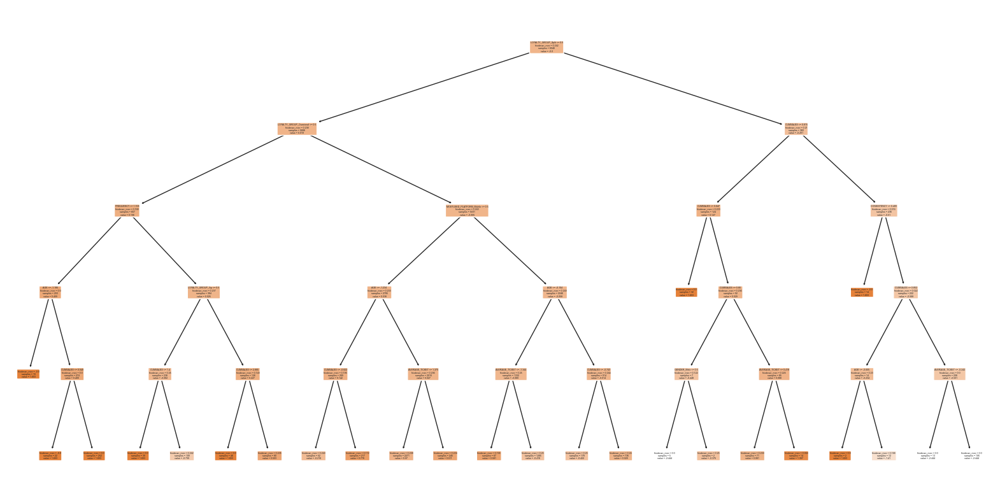

In [168]:
from sklearn.tree import plot_tree

# Choose which tree to visualize (0 for the first tree)
tree_index = 0

# Extract the tree from the classifier
single_tree = optim_gb_classifier.estimators_[tree_index, 0]  # Classifier version

# Plot the specified decision tree
plt.figure(figsize=(20, 10))
plot_tree(single_tree, filled=True, feature_names=x_train.columns, rounded=True)

# Save the plot to a file
plt.savefig('decision_tree.jpg', format='jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

#### Confusion Matrix

Class mapping for 'SEGMENT_1': Core -> 0, Up -> 1


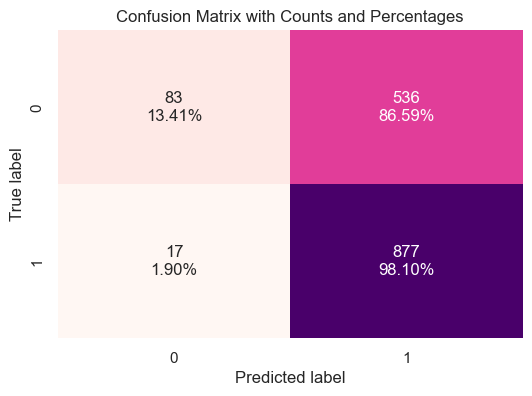

array([[ 83, 536],
       [ 17, 877]], dtype=int64)

In [170]:
# Print the class assignment for SEGMENT_1
print(f"Class mapping for 'SEGMENT_1': {le.classes_[0]} -> 0, {le.classes_[1]} -> 1")

# Call the function to display the confusion matrix for the Gradient Boosting model
confusion_matrix_with_counts_and_percentage(optim_gb_classifier, x_test, y_test)

#### Feature Importance
Let's see the feature importance according the gradient boosting model.

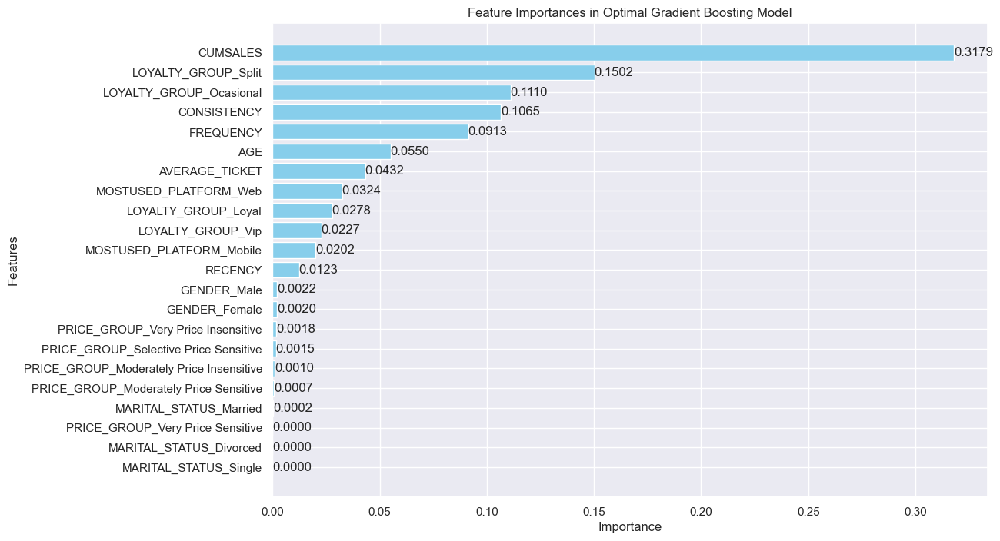

Feature Importances (Gradient Boosting):


,Feature,Importance
0,CUMSALES,0.317893
1,LOYALTY_GROUP_Split,0.150193
2,LOYALTY_GROUP_Ocasional,0.111037
3,CONSISTENCY,0.106472
4,FREQUENCY,0.091316
5,AGE,0.055004
6,AVERAGE_TICKET,0.043205
7,MOSTUSED_PLATFORM_Web,0.032430
8,LOYALTY_GROUP_Loyal,0.027799
9,LOYALTY_GROUP_Vip,0.022732


In [172]:
# Get feature importances
feature_importances_gb = optim_gb_classifier.feature_importances_

# Create a DataFrame for feature importances
GB_coefficients_df = pd.DataFrame({
    'Feature': x_train.columns,  # Feature names
    'Importance': feature_importances_gb  # Feature importance from Gradient Boosting
})

# Sort the DataFrame by importance for better clarity
GB_coefficients_df = GB_coefficients_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Plot the feature importances (horizontal bar chart)
plt.figure(figsize=(12, 8))  # Adjust the size to accommodate many features
bars = plt.barh(GB_coefficients_df['Feature'], GB_coefficients_df['Importance'], color='skyblue')

# Add importance values on top of bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():.4f}', va='center')

# Invert y-axis for better readability
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances in Optimal Gradient Boosting Model')

# Display a horizontal scrollable plot by adjusting figsize width and label size
plt.show()

# Display the feature importances in a table
print("Feature Importances (Gradient Boosting):")
GB_coefficients_df

Even gradient boost model gave some of the features some of which are common as in previous models- not so predictive power with low coefficient values.

### 3.2.3 Support Vector Machine

#### Bivariate Plots
Using the pair plot from EDA on the dataset before scaling, just with its raw variables can give an idea on what specifc kernal could be more suited through eye-balling.

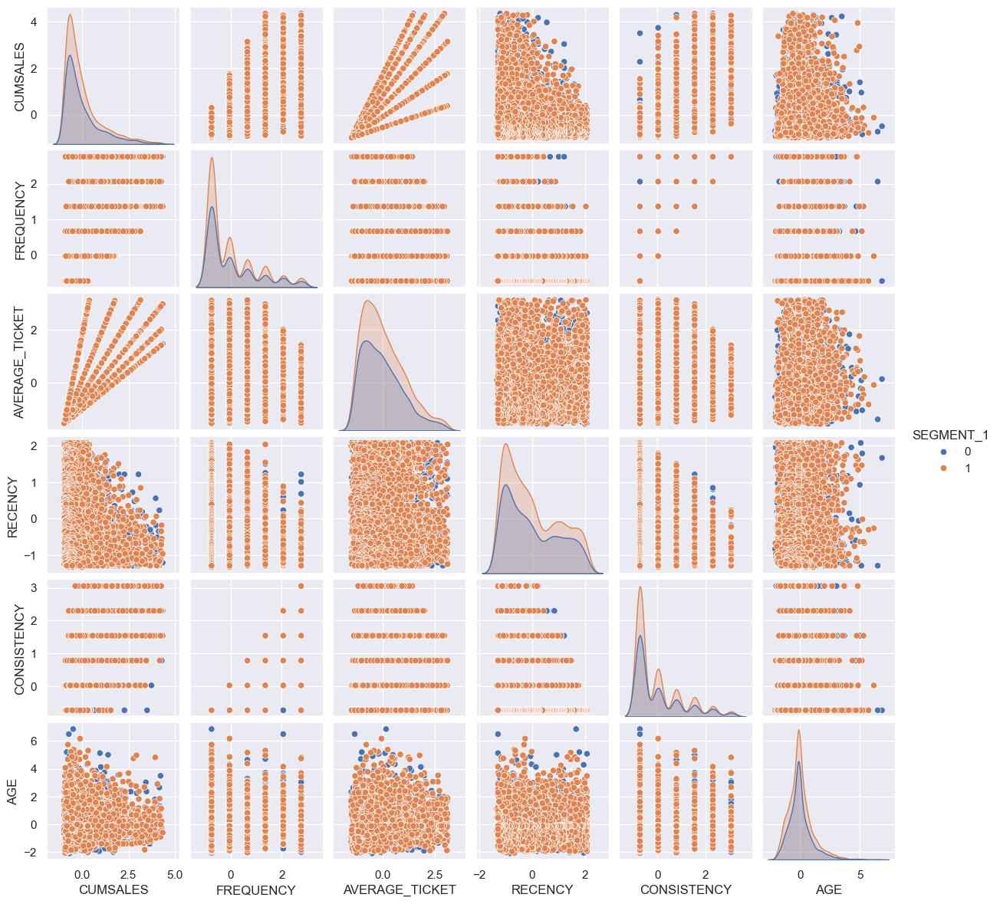

In [176]:
# Pair plot with 'SEGMENT_1' as the hue (color-coded by target class)
sns.pairplot(scaled_data, hue='SEGMENT_1', diag_kind='kde', height=2)
plt.show()

The above pairplot barely indicates any clear linear separation between the target classes among features. With the scattered points spread out everywhere, RBF Kernal or polynomial Kernal seems like better suited. But, even though pair plots might show scattered data in 2D, linear separation might be possible in higher dimensions. So, let's try all the Kernals which is better using Cross- validation.

#### Decision on Kernal- Linear Wins!

In [179]:
# Function to train and evaluate an SVM model with flexibility for C, gamma, and degree
def train_evaluate_svm(kernel_type, x_train, y_train, x_test, y_test, C=1, degree=3, gamma='scale'):
    svm_model = SVC(kernel=kernel_type, C=C, degree=degree, gamma=gamma, random_state=1)
    svm_model.fit(x_train, y_train)

    # Predictions
    y_train_pred = svm_model.predict(x_train)
    y_test_pred = svm_model.predict(x_test)

    # Metrics for Training Set
    metrics_train = {
        'Accuracy': accuracy_score(y_train, y_train_pred),
        'Precision': precision_score(y_train, y_train_pred),
        'Recall': recall_score(y_train, y_train_pred),
        'F1 Score': f1_score(y_train, y_train_pred)
    }

    # Metrics for Test Set
    metrics_test = {
        'Accuracy': accuracy_score(y_test, y_test_pred),
        'Precision': precision_score(y_test, y_test_pred),
        'Recall': recall_score(y_test, y_test_pred),
        'F1 Score': f1_score(y_test, y_test_pred)
    }

    return metrics_train, metrics_test

# Train and evaluate SVM kernels with different C and gamma values
# For linear kernel (no gamma or degree needed)
metrics_linear_train, metrics_linear_test = train_evaluate_svm('linear', x_train, y_train, x_test, y_test, C=1)

# For polynomial kernel (adjust C, gamma, degree)
metrics_poly_train, metrics_poly_test = train_evaluate_svm('poly', x_train, y_train, x_test, y_test, C=1, degree=3, gamma='scale')

# For RBF kernel (adjust C and gamma)
metrics_rbf_train, metrics_rbf_test = train_evaluate_svm('rbf', x_train, y_train, x_test, y_test, C=1, gamma='scale')

In [180]:
# Combine results into a DataFrame for easy comparison
metrics_data = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Linear (Train)': list(metrics_linear_train.values()),
    'Linear (Test)': list(metrics_linear_test.values()),
    'Polynomial (Train)': list(metrics_poly_train.values()),
    'Polynomial (Test)': list(metrics_poly_test.values()),
    'RBF (Train)': list(metrics_rbf_train.values()),
    'RBF (Test)': list(metrics_rbf_test.values())
}

# Convert to DataFrame and display
combined_metrics_df = pd.DataFrame(metrics_data)
print('===========================================================================================================')
print('COMPARISON OF METRICS FOR LINEAR, POLYNOMIAL, AND RBF KERNELS')
print('===========================================================================================================')
combined_metrics_df

COMPARISON OF METRICS FOR LINEAR, POLYNOMIAL, AND RBF KERNELS


,Metric,Linear (Train),Linear (Test),Polynomial (Train),Polynomial (Test),RBF (Train),RBF (Test)
0,Accuracy,0.614583,0.612690,0.656911,0.631857,0.645833,0.620621
1,Precision,0.609177,0.608146,0.638755,0.625840,0.630780,0.617130
2,Recall,0.969773,0.968680,0.965015,0.937360,0.965855,0.942953
3,F1 Score,0.748299,0.747196,0.768699,0.750560,0.763158,0.746018


A smaller difference between the training and test metrics suggests that the Polynomial kernel is less prone to overfitting in our specific case, meaning it generalizes slightly better than rbf, Linear dropped down the list in almost all the metrics compared to others. As our goal is to have a model that performs more consistently across different datasets, Polynomial may be the safer choice.

#### Hyperparameter Tuning Using K-fold CV

We'll perform a grid search to find the best C (regularization) value by cross-validating across multiple values of C.

In [183]:
# Define the parameter grid for C values
param_grid = {'C': [1, 10, 100, 1000]}

# Set up GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(SVC(kernel='poly', random_state=1), param_grid, cv=5, scoring='accuracy')

# Perform the grid search on the training data
grid_search.fit(x_train, y_train)


GridSearchCV(cv=5, estimator=SVC(kernel='poly', random_state=1),
             param_grid={'C': [1, 10, 100, 1000]}, scoring='accuracy')

Best C value: 1


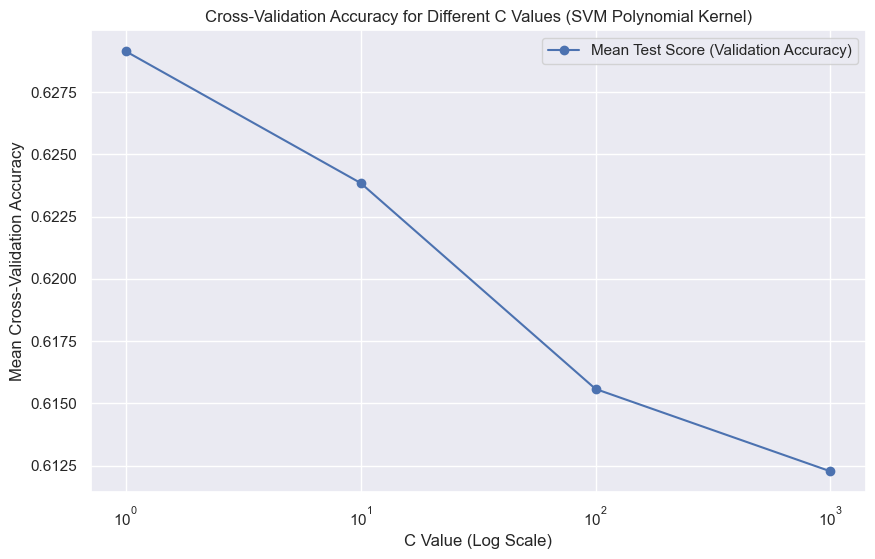

In [184]:
# Get the best C value found via cross-validation
best_C = grid_search.best_params_['C']
print(f'Best C value: {best_C}')

# Visualize C values vs accuracy changes
# Extract cross-validation results
results = pd.DataFrame(grid_search.cv_results_)

# Plot validation accuracy vs. C values
plt.figure(figsize=(10, 6))
plt.plot(param_grid['C'], results['mean_test_score'], marker='o', label='Mean Test Score (Validation Accuracy)')
plt.xscale('log')
plt.xlabel('C Value (Log Scale)')
plt.ylabel('Mean Cross-Validation Accuracy')
plt.title('Cross-Validation Accuracy for Different C Values (SVM Polynomial Kernel)')
plt.grid(True)
plt.legend()
plt.show()

Our results suggest that a moderate amount of regularization (C = 1) balances the bias-variance tradeoff. It prevents overfitting, which could happen with large C values (e.g., 1000 or 5000), and underfitting, which could happen with too small a C.

#### Optimal Model Fit
Let's refit the model with the best C value-

#### Classification Metrics Using K-fold CV

In [188]:
# Initialize the SVM model with polynomial kernel
final_svm_poly = SVC(kernel='poly', C=best_C, random_state=1)

# Set up Stratified K-Fold cross-validation (e.g., 5 folds)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

# Perform cross-validation to evaluate performance on the training data
cv_accuracy_scores = cross_val_score(final_svm_poly, x_train, y_train, cv=skf, scoring='accuracy')
cv_precision_scores = cross_val_score(final_svm_poly, x_train, y_train, cv=skf, scoring='precision')
cv_recall_scores = cross_val_score(final_svm_poly, x_train, y_train, cv=skf, scoring='recall')
cv_f1_scores = cross_val_score(final_svm_poly, x_train, y_train, cv=skf, scoring='f1')

# Calculate mean CV scores
cv_accuracy = cv_accuracy_scores.mean()
cv_precision = cv_precision_scores.mean()
cv_recall = cv_recall_scores.mean()
cv_f1 = cv_f1_scores.mean()

# Now, fit the model on the full training data
final_svm_poly.fit(x_train, y_train)

# Predict on the test data
y_test_pred_best = final_svm_poly.predict(x_test)

# Calculate test set metrics
accuracy_test = accuracy_score(y_test, y_test_pred_best)
precision_test = precision_score(y_test, y_test_pred_best, zero_division=0)
recall_test = recall_score(y_test, y_test_pred_best)
f1_test = f1_score(y_test, y_test_pred_best)

# Creating a DataFrame to compare metrics between cross-validated train set and test set
svm_metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'SVM Train': [cv_accuracy, cv_precision, cv_recall, cv_f1],
    'SVM Test': [accuracy_test, precision_test, recall_test, f1_test]
})

# Display the DataFrame with the performance metrics
print("Performance Metrics of SVM with Polynomial Kernel (Cross-Validated):")
svm_metrics_df

Performance Metrics of SVM with Polynomial Kernel (Cross-Validated):


,Metric,SVM Train,SVM Test
0,Accuracy,0.630454,0.631857
1,Precision,0.624090,0.625840
2,Recall,0.942065,0.937360
3,F1 Score,0.750757,0.750560


#### Confusion Matrix

Class mapping for 'SEGMENT_1': Core -> 0, Up -> 1


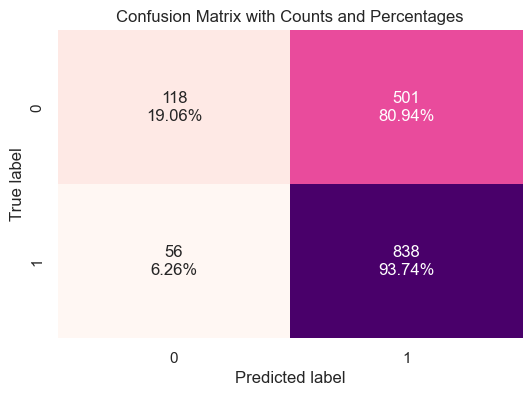

array([[118, 501],
       [ 56, 838]], dtype=int64)

In [190]:
# Print the class assignment for SEGMENT_1
print(f"Class mapping for 'SEGMENT_1': {le.classes_[0]} -> 0, {le.classes_[1]} -> 1")

# We already have the 'confusion_matrix_with_counts_and_percentage' function from earlier.
# Call the function to display the confusion matrix for SVM
confusion_matrix_with_counts_and_percentage(final_svm_poly, x_test, y_test)

#### Feature/Permutation Importance
To interpret feature importance for a polynomial kernel SVM, we need to perform permutation importance which shuffles the values of individual features and observe how the model's performance changes. The greater the performance drop when a feature is shuffled, the more important that feature is.

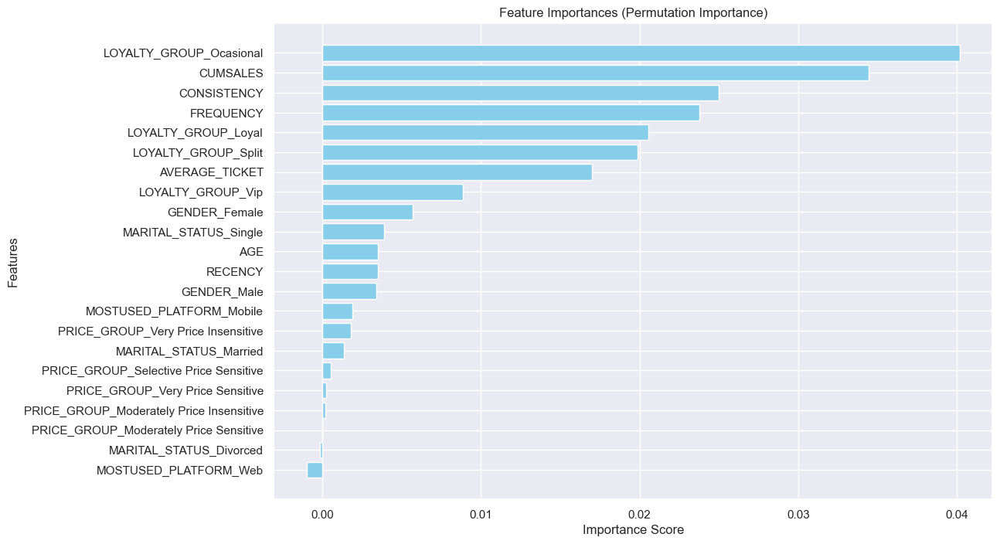

,Feature,Importance
0,LOYALTY_GROUP_Ocasional,0.0402
1,CUMSALES,0.0344
2,CONSISTENCY,0.0250
3,FREQUENCY,0.0238
4,LOYALTY_GROUP_Loyal,0.0206
5,LOYALTY_GROUP_Split,0.0199
6,AVERAGE_TICKET,0.0170
7,LOYALTY_GROUP_Vip,0.0089
8,GENDER_Female,0.0057
9,MARITAL_STATUS_Single,0.0039


In [192]:
from sklearn.inspection import permutation_importance

# Assuming 'final_svm_poly' is your trained SVM model with polynomial kernel
result = permutation_importance(final_svm_poly, x_test, y_test, n_repeats=10, random_state=1)

# Create a DataFrame for feature importances
perm_importances = pd.DataFrame({
    'Feature': x_train.columns,  # Feature names
    'Importance': result.importances_mean  # Mean importance scores
})

# Sort by importance for better readability
perm_importances = perm_importances.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Set pandas display options to show decimals instead of scientific notation
pd.set_option('display.float_format', '{:.4f}'.format)

# Plot feature importances
plt.figure(figsize=(12, 8))
bars = plt.barh(perm_importances['Feature'], perm_importances['Importance'], color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.title('Feature Importances (Permutation Importance)')
plt.show()

# Display the DataFrame with importances
perm_importances

## 3.2.4 Neural Networks

In [194]:
! pip install tensorflow

In [195]:
# import modules and tools as a classes from Tensorflow for constructing the NN
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation

# Other modlues and classes
import random
from tensorflow.keras import backend

import warnings

# Ignore specific UserWarnings (like the one from Keras)
warnings.filterwarnings("ignore", category=UserWarning, module='keras')

### Baseline Model Fit & Results
This neural network model is designed for binary classification. It has an input layer connected to the first hidden layer, which contains 2 times the number of input features as neurons, using ReLU activation for non-linearity. The output layer has one neuron with a sigmoid activation function to output a probability for binary classification.

The model is compiled with the Adam optimizer for efficient optimization and binary cross-entropy as the loss function, commonly used for binary classification. Accuracy is used as the metric to evaluate the model's performance during training.

In [197]:
# Create the model
model = Sequential()

# Add the input layer and first hidden layer
num_input_features = x_train.shape[1]  
num_hidden_neurons = 2 * num_input_features  # As per your architecture: 2 * number of input features

model.add(Dense(num_hidden_neurons, activation='relu', input_shape=(num_input_features,)))

# Add the output layer (sigmoid for binary classification)
model.add(Dense(1, activation='sigmoid'))

In [198]:
# Compile the model
model.compile(
    optimizer='adam',  # Adam optimizer
    loss='binary_crossentropy',  # Loss function for binary classification
    metrics=['accuracy']  # Metrics to track during training
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 44)             │         1,012 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            45 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,057 (4.13 KB)

 Trainable params: 1,057 (4.13 KB)

 Non-trainable params: 0 (0.00 B)

I chose 200 epochs to give the model enough time to learn while monitoring performance for early stopping. A batch size of 32 balances speed and resource efficiency. The 20% validation split allows me to track performance on unseen data without a separate test set, ensuring faster execution.

In [200]:
# Train the baseline model with full train data (x_train, y_train)
baseline_history = model.fit(
    x_train,  # Full training data
    y_train, 
    epochs=200, 
    batch_size=32, 
    validation_split=0.2,  # Use 20% of the training data as validation
    verbose=1
)

Epoch 1/200
152/152 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5546 - loss: 0.6909 - val_accuracy: 0.6273 - val_loss: 0.6564
Epoch 2/200
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6090 - loss: 0.6572 - val_accuracy: 0.6289 - val_loss: 0.6483
Epoch 3/200
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5904 - loss: 0.6633 - val_accuracy: 0.6248 - val_loss: 0.6440
Epoch 4/200
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6158 - loss: 0.6464 - val_accuracy: 0.6207 - val_loss: 0.6415
Epoch 5/200
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6178 - loss: 0.6446 - val_accuracy: 0.6264 - val_loss: 0.6377
Epoch 6/200
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6253 - loss: 0.6380 - val_accuracy: 0.6273 - val_loss: 0.6353
Epoch 7/200
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6198 - loss: 0.6377 - val_accuracy: 0.6298 - val_loss: 0.6337
Epoch 8/200
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6138 - loss: 0.6407 - val_accu

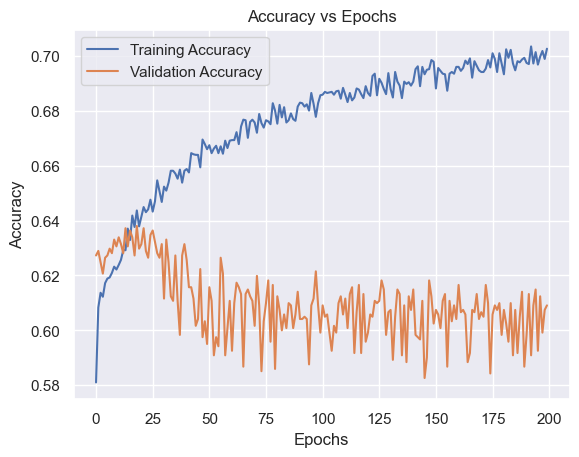

In [201]:
# Plot training and validation accuracy over epochs
plt.plot(baseline_history.history['accuracy'], label='Training Accuracy')
plt.plot(baseline_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epochs')
plt.legend()
plt.grid(True)  # Add grid for better readability
plt.show()

In [202]:
# Evaluate the baseline model on the full test set
baseline_loss, baseline_accuracy = model.evaluate(x_test, y_test, verbose=1)
print(f'Baseline Test Loss: {baseline_loss:.4f}')
print(f'Baseline Test Accuracy: {baseline_accuracy:.4f}')

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - accuracy: 0.5816 - loss: 0.6833
Baseline Test Loss: 0.6760
Baseline Test Accuracy: 0.5962


This gap between training accuracy (70%) and validation (little less than 60%)) represents overfitting, we need to tune parameters to find the optimal model with consistent performance.

### Subset for Tuning

In [205]:
# Fixing the seed for random number generators for reproducibility
np.random.seed(1)
random.seed(1)
tf.random.set_seed(1)

# Step 1: Subset data (50%) from the original train data (x_train and y_train remain the same)
x_train_subset, _, y_train_subset, _ = train_test_split(x_train, y_train, test_size=0.5, stratify=y_train, random_state=1)

# Step 2: Further split this subset into a training set and test set for tuning
x_train_subset_from_train, x_test_subset_from_train, y_train_subset_from_train, y_test_subset_from_train = train_test_split(
    x_train_subset, y_train_subset, test_size=0.3, stratify=y_train_subset, random_state=1)

# Verify the shape of the subset
print(f"Original Train size (which is 80% of main data): {x_train.shape[0]} records")
print(f"Subset size taken from training set (which is 50% of train data): {x_train_subset.shape[0]} records")
print(f"Train Subset size (which is 70% of subset): {x_train_subset_from_train.shape[0]} records")
print(f"Test Subset size (which is 30% of subset): {x_test_subset_from_train.shape[0]} records")

Original Train size (which is 80% of main data): 6048 records
Subset size taken from training set (which is 50% of train data): 3024 records
Train Subset size (which is 70% of subset): 2116 records
Test Subset size (which is 30% of subset): 908 records


Subsetting the Training Data for Hyperparameter Tuning:
A subset of the training data (50%) was selected to perform hyperparameter tuning. With the model going to be used being very time-consuming this approach reduces computational overhead, making the tuning process faster without sacrificing model quality. Stratification was applied during this step as well to maintain class balance in the subset, ensuring the model's performance during tuning is representative of the overall data distribution.

Further Split for Cross-Validation or Tuning:
The subset of the training data is then split into 70% training and 30% validation (for cross-validation or model tuning). This ensures that hyperparameter tuning is performed in a controlled environment with a training and validation set that is representative of the overall data, maintaining the integrity of the model evaluation during tuning.

Final Model Training and Evaluation:
Once the best hyperparameters are found using the subset, the final model will be trained on the full training set (x_train, y_train) and evaluated on the test set (x_test, y_test). This guarantees that the model's final evaluation is done on the full data, ensuring that the model generalizes well across the entire dataset.

Note- nowhere original test set is touched to make it usable for getting valid final model performance results at the end.

### Hyperparameter Tuning Using K-fold CV
I use the subset (both for training and testing) drawn from train set alone to tune hyperparameters because of computational limits and time constraints.

In [208]:
# Clear backend
backend.clear_session()

# Fix the seed
np.random.seed(1)
random.seed(1)
tf.random.set_seed(1)

In [209]:
# Step 1: Subset data (3.5k) from the original train data (x_train and y_train remain the same)
x_train_subset, _, y_train_subset, _ = train_test_split(x_train, y_train, test_size=0.5, stratify=y_train, random_state=1)

# Step 2: Further split this subset into a training set and test set for tuning
x_train_subset_from_train, x_test_subset_from_train, y_train_subset_from_train, y_test_subset_from_train = train_test_split(
    x_train_subset, y_train_subset, test_size=0.3, stratify=y_train_subset, random_state=1)

In [210]:
# Convert to NumPy arrays if they're in DataFrame format
x_train_subset_from_train = x_train_subset_from_train.values
y_train_subset_from_train = y_train_subset_from_train.values
x_test_subset_from_train = x_test_subset_from_train.values
y_test_subset_from_train = y_test_subset_from_train.values 

# Step 3: Define the model creation function
def create_model(n_layers, n_neurons, input_shape):
    model = Sequential()
    model.add(Dense(n_neurons, activation='relu', input_shape=(input_shape,)))
    for _ in range(1, n_layers):
        model.add(Dense(n_neurons, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))  # Assuming binary classification
    return model

In [211]:
# Step 4: Hyperparameter tuning using StratifiedKFold on the smaller train subset
def tune_model_with_cv(x_train_subset_from_train, y_train_subset_from_train, n_splits=5, epochs=200):
    results = []
    max_accuracy = 0
    optimal_layers = 0
    optimal_neurons = 0

    # Stratified K-Fold to preserve class balance
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)

    # Limiting neurons to input features and double that
    for n_neurons in [x_train_subset_from_train.shape[1], x_train_subset_from_train.shape[1] * 2]:
        for n_layers in range(1, 3):  # Limit layers to 1 or 2
            fold_accuracies = []

            for train_idx, val_idx in skf.split(x_train_subset_from_train, y_train_subset_from_train):
                model = create_model(n_layers, n_neurons, input_shape=x_train_subset_from_train.shape[1])
                model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

                # Train the model
                model.fit(x_train_subset_from_train[train_idx], y_train_subset_from_train[train_idx], epochs=epochs, verbose=0)

                # Evaluate on the validation fold
                _, val_accuracy = model.evaluate(x_train_subset_from_train[val_idx], y_train_subset_from_train[val_idx], verbose=0)
                fold_accuracies.append(val_accuracy)

            avg_accuracy = np.mean(fold_accuracies)
            results.append((n_layers, n_neurons, avg_accuracy))

            if avg_accuracy > max_accuracy:
                max_accuracy = avg_accuracy
                optimal_layers = n_layers
                optimal_neurons = n_neurons
                print(f"New optimal found: Accuracy={max_accuracy:.4f}, Layers={n_layers}, Neurons={n_neurons}")

    return max_accuracy, optimal_layers, optimal_neurons, results

# Step 5: Evaluate on test subset from train data
def evaluate_on_test_subset(best_layers, best_neurons):
    model = create_model(best_layers, best_neurons, input_shape=x_train_subset_from_train.shape[1])
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Train on the full train subset
    model.fit(x_train_subset_from_train, y_train_subset_from_train, epochs=200, verbose=1)

    # Evaluate on the test subset from train data
    _, test_accuracy = model.evaluate(x_test_subset_from_train, y_test_subset_from_train, verbose=1)
    print(f"Accuracy on the Test Subset of Train Data: {test_accuracy:.4f}")
    return model

In [212]:
from sklearn.model_selection import StratifiedKFold

# Running the tuning process
max_acc, layers, neurons, results = tune_model_with_cv(x_train_subset_from_train, y_train_subset_from_train)

New optimal found: Accuracy=0.5945, Layers=1, Neurons=22


In [213]:
# Evaluating on test subset of the train data
best_model = evaluate_on_test_subset(layers, neurons)

Epoch 1/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5361 - loss: 0.7039
Epoch 2/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.5616 - loss: 0.6841
Epoch 3/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5817 - loss: 0.6747
Epoch 4/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5940 - loss: 0.6696
Epoch 5/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5993 - loss: 0.6646
Epoch 6/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - accuracy: 0.6079 - loss: 0.6618
Epoch 7/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - accuracy: 0.6088 - loss: 0.6594
Epoch 8/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - accuracy: 0.6024 - loss: 0.6571
Epoch 9/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - accuracy: 0.5996 - loss: 0.6565
Epoch 10/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - accuracy: 0.6064 - loss: 0.6534
Epoch 11/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - accuracy: 0.6038 - loss: 0.6517
Epoch 12/200
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/

### Optimal Model Fit
Now the best parameters found were of a simpler NN with 1 Layer and 22 Neurons that gave 59.5% on train subset and 63% on test subset. Using these on original/main train and test sets to evaluate model. 

### Classification Metrics Using K-fold CV

In [216]:
# Define function for cross-validation and evaluation on Neural Network
def cross_validate_and_evaluate_nn(best_layers, best_neurons, n_splits=5, epochs=200):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)

    # Initialize lists to store metrics for cross-validation on the train set
    fold_accuracy_train, fold_precision_train, fold_recall_train, fold_f1_train = [], [], [], []

    for train_idx, val_idx in skf.split(x_train, y_train):
        # Create a new model for each fold
        model = create_model(best_layers, best_neurons, input_shape=x_train.shape[1])
        model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train on the training fold
        model.fit(x_train.iloc[train_idx], y_train.iloc[train_idx], epochs=epochs, verbose=0)

        # Evaluate on the validation fold
        y_val_pred = (model.predict(x_train.iloc[val_idx]) > 0.5).astype("int32")

        # Calculate metrics for this fold
        fold_accuracy_train.append(accuracy_score(y_train.iloc[val_idx], y_val_pred))
        fold_precision_train.append(precision_score(y_train.iloc[val_idx], y_val_pred, zero_division=0))
        fold_recall_train.append(recall_score(y_train.iloc[val_idx], y_val_pred))
        fold_f1_train.append(f1_score(y_train.iloc[val_idx], y_val_pred))

    # Average cross-validated metrics on the train set
    avg_cv_accuracy_train = np.mean(fold_accuracy_train)
    avg_cv_precision_train = np.mean(fold_precision_train)
    avg_cv_recall_train = np.mean(fold_recall_train)
    avg_cv_f1_train = np.mean(fold_f1_train)

    # Train final model on the full training set
    final_nn_model = create_model(best_layers, best_neurons, input_shape=x_train.shape[1])
    final_nn_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    final_nn_model.fit(x_train, y_train, epochs=epochs, verbose=1)

    # Evaluate on the test set
    y_test_pred = (final_nn_model.predict(x_test) > 0.5).astype("int32")

    # Calculate test set metrics
    accuracy_test = accuracy_score(y_test, y_test_pred)
    precision_test = precision_score(y_test, y_test_pred, zero_division=0)
    recall_test = recall_score(y_test, y_test_pred)
    f1_test = f1_score(y_test, y_test_pred)

    # Create a simplified DataFrame to compare train (CV) and test metrics
    nn_metrics_df = pd.DataFrame({
        'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
        'NN Train': [avg_cv_accuracy_train, avg_cv_precision_train, avg_cv_recall_train, avg_cv_f1_train],
        'NN Test': [accuracy_test, precision_test, recall_test, f1_test]
    })

      # Return both the model and metrics DataFrame
    return final_nn_model, nn_metrics_df

# Run the function and store the metrics DataFrame
final_nn_model, nn_metrics_df = cross_validate_and_evaluate_nn(layers, neurons)

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Epoch 1/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 1s 965us/step - accuracy: 0.5695 - loss: 0.6850
Epoch 2/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.6086 - loss: 0.6675
Epoch 3/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - accuracy: 0.6165 - loss: 0.6593
Epoch 4/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - accuracy: 0.6147 - loss: 0.6531
Epoch 5/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - accuracy: 0.6147 - loss: 0.6483
Epoch 6/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - accuracy: 0.6154 - loss: 0.6448
Epoch 7/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.6176 - loss: 0.6419
Epoch 8/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - accuracy: 0.6186 - loss: 0.6392
Epoch 9/200
189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - accuracy: 0.6165 - loss: 0.6369
Epoc

In [217]:
# Now display the DataFrame with the performance metrics
print("Performance Metrics of Neural Network:")
nn_metrics_df

Performance Metrics of Neural Network:


,Metric,NN Train,NN Test
0,Accuracy,0.6156,0.5856
1,Precision,0.6435,0.6320
2,Recall,0.7834,0.7148
3,F1 Score,0.7064,0.6709


The model achieved a cross-validated accuracy of 61.56% on the full training set, and a final test accuracy of around 58.5% after tuning on a subset. That is a considerable amount of drop from train to test accuracy. Further fine-tuning with regularization techniques or optimizing hyperparameters on the full dataset may slightly improve the results, but overall, the model's performance is fine given the time-efficient tuning strategy. Also early stopping can also be inlcuded as I noticed that the loss and accurcay has stated to stagnate after a while in testing.

### Confusion Matrix

In [220]:
def confusion_matrix_with_counts_and_percentage_keras(model, predictors, target, threshold=0.5):
    """
    Function to compute and plot the confusion matrix for a Keras classification model with both counts and percentages.

    model: Keras classifier model
    predictors: independent variables (features)
    target: dependent variable (actual labels)
    threshold: threshold for classifying the observation as class 1
    """
    # Get the predictions
    pred_prob = model.predict(predictors)
    
    # Convert probabilities to class labels based on the threshold
    pred = np.where(pred_prob > threshold, 1, 0)
    
    # Compute confusion matrix
    cm = confusion_matrix(target, pred)
    
    # Compute percentages
    cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
    
    # Create an annotation matrix with counts and percentages
    annot = np.empty_like(cm).astype(str)
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            annot[i, j] = f'{cm[i, j]}\n{cm_percent[i, j]:.2f}%'
    
    # Plot the confusion matrix with annotations for both counts and percentages
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=annot, fmt='', cmap='Blues', cbar=False,
                xticklabels=[0, 1], yticklabels=[0, 1])
    plt.title('Confusion Matrix with Counts and Percentages')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

    return cm

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


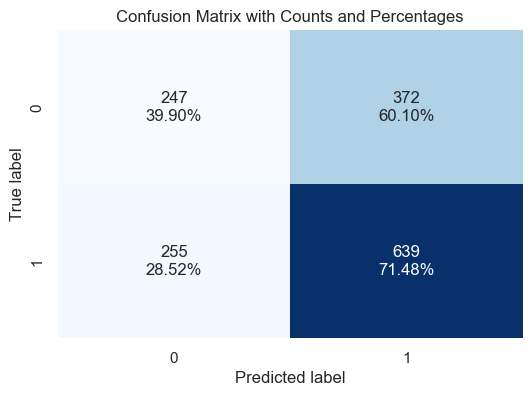

array([[247, 372],
       [255, 639]], dtype=int64)

In [221]:
# Call the modified function for Keras models to display the confusion matrix
confusion_matrix_with_counts_and_percentage_keras(final_nn_model, x_test, y_test)


### Feature/Permutation Importance

In [223]:
# Step 1: Define a scoring function to evaluate the model's accuracy
def model_score(final_nn_model, x, y):
    pred_prob = final_nn_model.predict(x)
    pred = np.where(pred_prob > 0.5, 1, 0)
    return accuracy_score(y, pred)

# Step 2: Calculate permutation importance
perm_importance = permutation_importance(final_nn_model, x_test, y_test, n_repeats=10, scoring=model_score, random_state=1)

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 721us/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/st

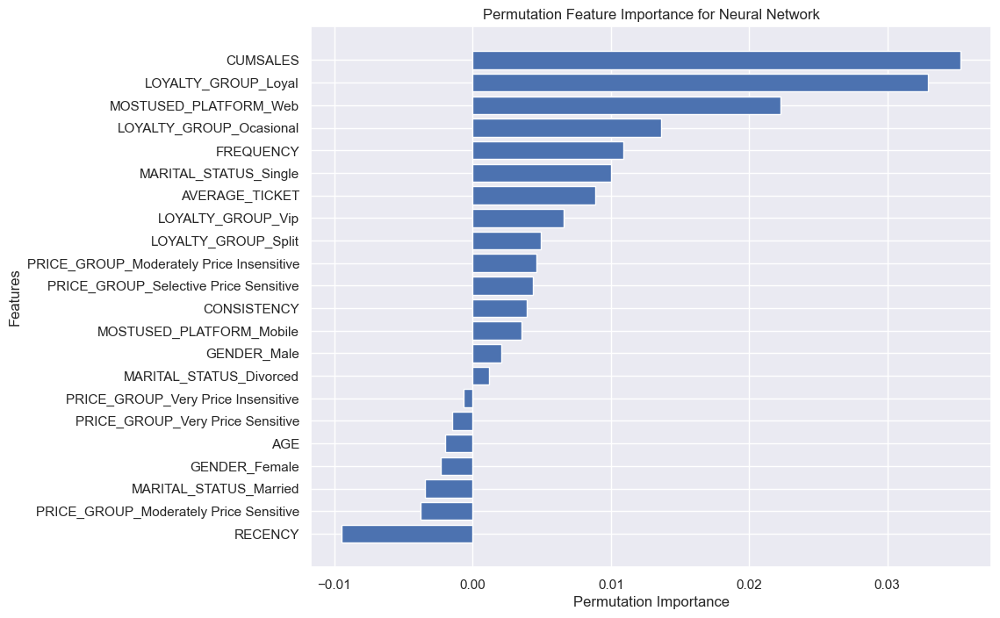

,Feature,Importance
0,CUMSALES,0.0353
1,LOYALTY_GROUP_Loyal,0.0329
2,MOSTUSED_PLATFORM_Web,0.0223
3,LOYALTY_GROUP_Ocasional,0.0136
4,FREQUENCY,0.0109
5,MARITAL_STATUS_Single,0.0100
6,AVERAGE_TICKET,0.0089
7,LOYALTY_GROUP_Vip,0.0066
8,LOYALTY_GROUP_Split,0.0050
9,PRICE_GROUP_Moderately Price Insensitive,0.0046


In [224]:
# Step 3: Extract feature importance and plot
sorted_idx = perm_importance.importances_mean.argsort()
plt.figure(figsize=(10, 8))
plt.barh(x_test.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")
plt.ylabel("Features")
plt.title("Permutation Feature Importance for Neural Network")
plt.show()

# Step 4: Create a DataFrame for feature importance
nn_feature_importance_df = pd.DataFrame({
    'Feature': x_test.columns,
    'Importance': perm_importance.importances_mean
}).sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Display the feature importance DataFrame
nn_feature_importance_df

# 5- Reporting Results

## 5.1 Final Confusion Matrix

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step


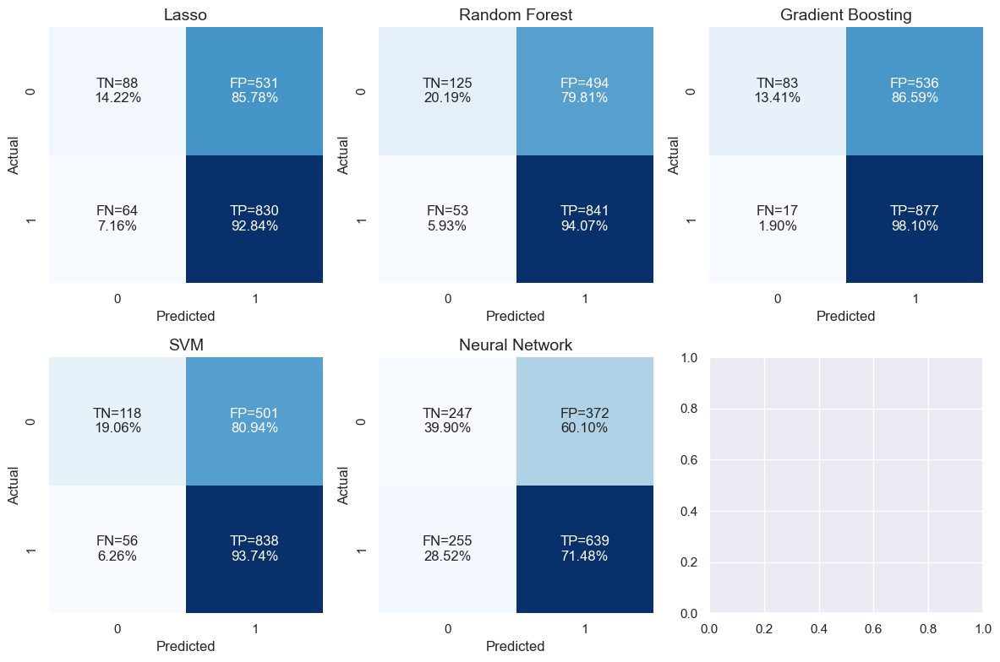

In [226]:
# Function to plot a confusion matrix with TP, FP, TN, FN labels and row-wise percentages
def plot_confusion_matrix_with_labels(ax, model, X, y_true, model_name, is_nn=False):
    # For NN models, convert probabilities to class predictions
    if is_nn:
        y_pred_prob = model.predict(X)
        y_pred = (y_pred_prob > 0.5).astype(int)  # Threshold for binary classification
    else:
        y_pred = model.predict(X)
    
    cm = confusion_matrix(y_true, y_pred)
    
    # Normalize the confusion matrix row-wise (i.e., per actual class)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Calculate TP, TN, FP, FN
    tn, fp, fn, tp = cm.ravel()
    
    # Create annotation labels with counts and row-wise percentages
    annot = [[f'TN={tn}\n{cm_normalized[0, 0]:.2%}', f'FP={fp}\n{cm_normalized[0, 1]:.2%}'],
             [f'FN={fn}\n{cm_normalized[1, 0]:.2%}', f'TP={tp}\n{cm_normalized[1, 1]:.2%}']]
    
    # Plot confusion matrix in the provided axes object
    sns.heatmap(cm, annot=annot, fmt='', cmap='Blues', cbar=False, ax=ax, annot_kws={"size": 12})
    ax.set_title(f'{model_name}', fontsize=14)
    ax.set_ylabel('Actual', fontsize=12)
    ax.set_xlabel('Predicted', fontsize=12)

# Create a 2x3 grid for confusion matrices
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# Plot each model's confusion matrix in a subplot

# Lasso
plot_confusion_matrix_with_labels(axes[0, 0], final_logreg_lasso, x_test, y_test, "Lasso")

# Random Forest
plot_confusion_matrix_with_labels(axes[0, 1], optim_rf_classifier, x_test, y_test, "Random Forest")

# Gradient Boosting
plot_confusion_matrix_with_labels(axes[0, 2], optim_gb_classifier, x_test, y_test, "Gradient Boosting")

# SVM
plot_confusion_matrix_with_labels(axes[1, 0], final_svm_poly, x_test, y_test, "SVM")

# Neural Network (set is_nn=True to handle NN predictions)
plot_confusion_matrix_with_labels(axes[1, 1], final_nn_model, x_test, y_test, "Neural Network", is_nn=True)

# Adjust layout for clarity
plt.tight_layout()
plt.show()


In [227]:
# Print the class assignment for SEGMENT_1
print(f"Class mapping for 'SEGMENT_1': {le.classes_[0]} -> 0, {le.classes_[1]} -> 1")

Class mapping for 'SEGMENT_1': Core -> 0, Up -> 1


While the True Positive (TP) rates are impressively high across all models, especially for Gradient Boosting at 98.10%, the True Negative (TN) rates are notably lower, indicating a significant number of False Positives (FP). This imbalance suggests that while the models are highly sensitive, they may be over-predicting the positive class. Adjusting the classification cut-off thresholds could help better balance the trade-off between TP and TN, potentially reducing the high FP rate and improving overall model performance. 

## 5.2 Final Classification Metrics

In [230]:
# Function to compute all the necessary metrics from the confusion matrix
def compute_metrics(y_true, y_pred):
    # Calculate confusion matrix values
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    # Calculate rates
    accuracy = accuracy_score(y_true, y_pred)
    tp_rate = recall_score(y_true, y_pred)  # Recall is the TP Rate
    tn_rate = tn / (tn + fp)  # TN Rate (Specificity)
    fp_rate = fp / (fp + tn)  # FP Rate
    fn_rate = fn / (fn + tp)  # FN Rate
    precision = precision_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    
    # Return the metrics in a dictionary
    return {
        'Accuracy': accuracy,
        'TP Rate (Recall)': tp_rate,
        'TN Rate (Specificity)': tn_rate,
        'FP Rate': fp_rate,
        'FN Rate': fn_rate,
        'Precision': precision,
        'Recall (TP Rate)': tp_rate,  # Repeated for clarity
        'F1-Score': f1
    }

# Create a function to get predictions and compute metrics for each model
def get_metrics_for_model(model, X_test, y_test, model_name, is_nn=False):
    if is_nn:
        y_pred_prob = model.predict(X_test)
        y_pred = (y_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions
    else:
        y_pred = model.predict(X_test)
    
    metrics = compute_metrics(y_test, y_pred)
    return model_name, metrics

# Collect metrics for each model
metrics_data = {}

metrics_data['Lasso'] = get_metrics_for_model(final_logreg_lasso, x_test, y_test, "Lasso")[1]
metrics_data['Random Forest'] = get_metrics_for_model(optim_rf_classifier, x_test, y_test, "Random Forest")[1]
metrics_data['Gradient Boosting'] = get_metrics_for_model(optim_gb_classifier, x_test, y_test, "Gradient Boosting")[1]
metrics_data['SVM'] = get_metrics_for_model(final_svm_poly, x_test, y_test, "SVM")[1]
metrics_data['Neural Network'] = get_metrics_for_model(final_nn_model, x_test, y_test, "Neural Network", is_nn=True)[1]

# Convert the dictionary to a DataFrame for better visualization
metrics_df = pd.DataFrame(metrics_data).T

# Display the DataFrame
metrics_df


48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step


,Accuracy,TP Rate (Recall),TN Rate (Specificity),FP Rate,FN Rate,Precision,Recall (TP Rate),F1-Score
Lasso,0.6067,0.9284,0.1422,0.8578,0.0716,0.6098,0.9284,0.7361
Random Forest,0.6385,0.9407,0.2019,0.7981,0.0593,0.6300,0.9407,0.7546
Gradient Boosting,0.6345,0.9810,0.1341,0.8659,0.0190,0.6207,0.9810,0.7603
SVM,0.6319,0.9374,0.1906,0.8094,0.0626,0.6258,0.9374,0.7506
Neural Network,0.5856,0.7148,0.3990,0.6010,0.2852,0.6320,0.7148,0.6709


### What is the Business Goal here? 
Assumption: 

With no clear documentation available for the dataset variables, I referred to common customer segmentation practices outlined in (The Good-Better-Best Approach to Pricing, 2018). Based on this model, it’s reasonable to assume that the 'Core' segment represents regular customers who prefer basic products, while the 'Up' segment includes premium customers who opt for higher-end or better-value offerings. 'Up' customers often become the focus of loyalty programs, personalized marketing, and upselling strategies due to their higher lifetime value. Understanding the distinction between 'Core' and 'Up' helps businesses refine strategies tailored to each customer segment.

Alligning with this common industry practices, here is the possible business goal of building this classification model-

For this project, the focus is on correctly identifying as many 'Up' customers as possible, since they represent a higher-value segment with more potential for revenue through personalized marketing, loyalty programs, and upselling. It is tolerable to misclassify 'Core' customers as 'Up', as the business impact of sending marketing or upselling efforts to the 'Core' group is relatively low compared to losing an 'Up' customer by classifying them as 'Core' (which could mean missed revenue opportunities).

Thus, in this context:

1). Maximizing Recall (i.e., capturing as many actual 'Up' customers as possible- True Positives) is the top priority.

2). Misclassifying 'Core' as 'Up' (false positives) is acceptable/ tolerable.

3). Good balance in F-1 Score and lesser False Negative Rate is benificial.

### What is the Use of this Classification Model?
Considering the above mentioned business goal, here is how this E-Commerce Classification Model can improve the business-

For this e-commerce dataset, where 0 is 'Core' (40%) and 1 is 'Up' (60%), the most critical metrics are Recall (TP Rate) and F1-Score. These are vital because the business likely cares more about correctly identifying as many 'Up' customers (majority class) as possible. In the best-performing model, Gradient Boosting, Recall stands at 98.10%, indicating that the model captures most of the 'Up' customers, minimizing the risk of missing revenue opportunities.

Precision (how many predicted 'Up' customers are correct) is also important, but the cost of sending marketing material to the wrong 'Core' customers might not be as significant as missing the 'Up' ones. For Gradient Boosting, Precision is 62.07%, reflecting a good balance but showing some trade-off with Precision for higher Recall. Thus, Recall takes precedence over Precision.

The False Negative Rate (FNR), which is the rate of misclassifying 'Up' customers as 'Core', is crucial as well. Gradient Boosting's FNR is 1.90%, indicating the model is very effective at minimizing the loss of potential high-value customers.

F1-Score, as a balance between Precision and Recall, provides a comprehensive view of model performance. Gradient Boosting has the highest F1-Score at 76.03%, making it a highly valuable metric in this context.

On the other hand, Accuracy alone is not very reliable due to the class imbalance (60-40 split). A model could achieve high accuracy by focusing on the majority class ('Up'), but this would overlook the importance of correctly identifying 'Core' customers. The best model, Gradient Boosting, has an accuracy of 63.45%, but this doesn't capture the full story in the presence of imbalance.

In summary, the focus should be on Recall (98.10%), F1-Score (76.03%), and False Negative Rate (1.90%) for the best model, Gradient Boosting, as these metrics align with the goal of identifying as many 'Up' customers as possible while minimizing lost opportunities due to misclassification.

### Which is the Best Performing Model?
Gradient Boosting (GB) stands out as the best-performing model for this dataset, with higher Recall and F1-Score compared to Logistic Regression, Random Forest, and SVM. This means GB is more effective at correctly identifying 'Up' customers while maintaining a strong balance between Precision and Recall. While Random Forest also performs well, GB's ability to handle the class imbalance and provide more accurate predictions makes it the optimal choice for this segmentation task.

### This Model predicts TP well, what about TN?
However, if True Negatives (TN)—that is, correctly identifying 'Core' customers—are equally important, given that 'Core' represents a significant 40% of the customer base, adjusting the probability threshold for classification could help balance the trade-off between True Positives (Up customers) and True Negatives (Core customers). By altering the default threshold from 50% to a lower or higher value, the business can better tune the model to either prioritize Core or Up customers based on specific business goals, such as customer retention or upselling.

### Can this Model Allign to a Different Business Goal?
Also, on this similar ideology, if the business goal is different, then the model that performs well on those related metrics can be chosen over others. For example, if the goal is to minimize false positives (FP) — misclassifying 'Core' customers as 'Up' — then Random Forest may be a better option, as it can handle non-linear relationships more effectively compared to Logistic Regression and does the job. However, if the focus is maximizing F1-Score for a balance between precision and recall, Gradient Boosting would still be the optimal choice. At the end, it is always a trade-off in the field of Data Science or for that matter business as well.

## 5.3 Final Feature Importance

### Visual

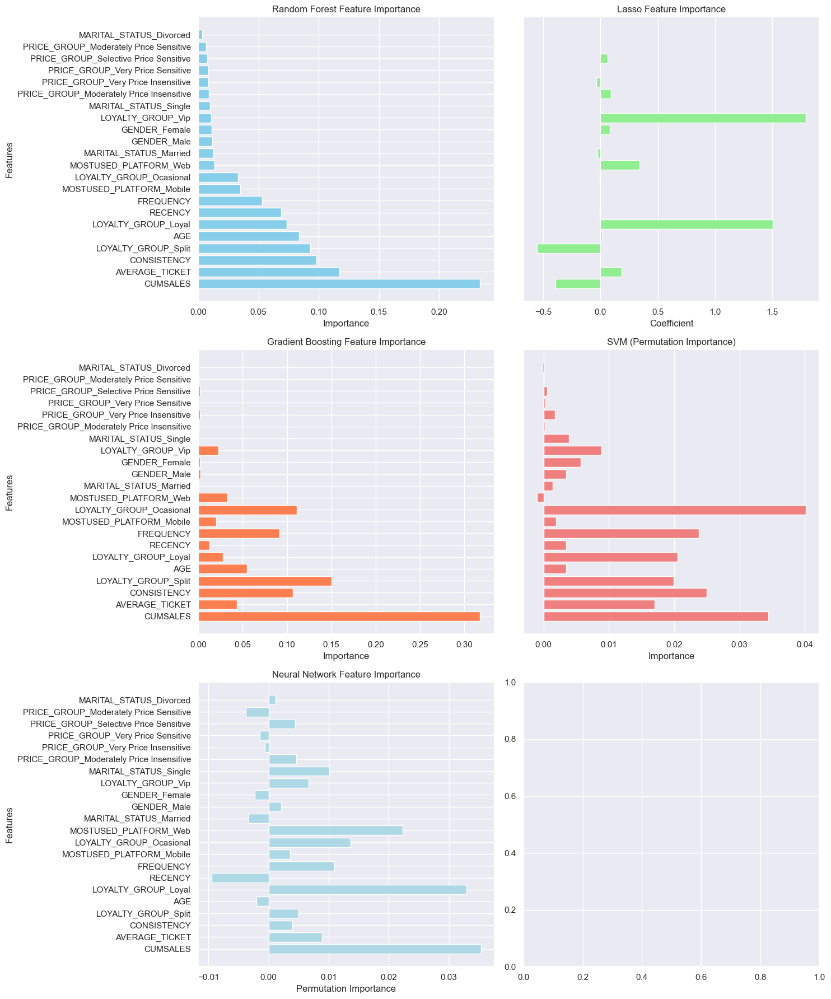

In [238]:
# Random Forest: RF_coefficients_df
# Lasso: lasso_coefficients_df
# Gradient Boosting: GB_coefficients_df
# SVM: perm_importances (for permutation importance)
# Neural Network: nn_feature_importance_df (calculated using permutation importance)

# Reindex all feature importance DataFrames to align with Random Forest order
feature_order = RF_coefficients_df['Feature']

# Now ensure all other models follow the same feature order
lasso_coefficients_df = lasso_coefficients_df.set_index('Feature').reindex(feature_order).reset_index()
GB_coefficients_df = GB_coefficients_df.set_index('Feature').reindex(feature_order).reset_index()
perm_importances = perm_importances.set_index('Feature').reindex(feature_order).reset_index()  # SVM permutation importance
nn_feature_importance_df = nn_feature_importance_df.set_index('Feature').reindex(feature_order).reset_index()

# Plot feature importance for all models, including the Neural Network
fig, axs = plt.subplots(3, 2, figsize=(15, 18))  # Adjusting layout to fit NN

# Random Forest (Top Left)
axs[0, 0].barh(RF_coefficients_df['Feature'], RF_coefficients_df['Importance'], color='skyblue')
axs[0, 0].set_title('Random Forest Feature Importance')
axs[0, 0].set_xlabel('Importance')
axs[0, 0].set_ylabel('Features')

# Lasso (Top Right)
axs[0, 1].barh(lasso_coefficients_df['Feature'], lasso_coefficients_df['Coefficient'], color='lightgreen')
axs[0, 1].set_title('Lasso Feature Importance')
axs[0, 1].set_xlabel('Coefficient')
axs[0, 1].set_yticks([])

# Gradient Boosting (Middle Left)
axs[1, 0].barh(GB_coefficients_df['Feature'], GB_coefficients_df['Importance'], color='coral')
axs[1, 0].set_title('Gradient Boosting Feature Importance')
axs[1, 0].set_xlabel('Importance')
axs[1, 0].set_ylabel('Features')

# SVM (Middle Right) - using permutation importance
axs[1, 1].barh(perm_importances['Feature'], perm_importances['Importance'], color='lightcoral')
axs[1, 1].set_title('SVM (Permutation Importance)')
axs[1, 1].set_xlabel('Importance')
axs[1, 1].set_yticks([])

# Neural Network (Bottom Left)
axs[2, 0].barh(nn_feature_importance_df['Feature'], nn_feature_importance_df['Importance'], color='lightblue')
axs[2, 0].set_title('Neural Network Feature Importance')
axs[2, 0].set_xlabel('Permutation Importance')
axs[2, 0].set_ylabel('Features')

# Adjust layout for clarity
plt.tight_layout()
plt.show()

Predictors like cummulative sales, consistency, average_ticket, loyalty group stood out with more importance, whereas marital status, price group, age stood out least important across all models. 

### Ranking Table

In [241]:
# Reindex all feature importance DataFrames to align with Gradient Boosting order
feature_order = GB_coefficients_df['Feature']

# Now ensure all other models follow the same feature order
RF_coefficients_df = RF_coefficients_df.set_index('Feature').reindex(feature_order).reset_index()
lasso_coefficients_df = lasso_coefficients_df.set_index('Feature').reindex(feature_order).reset_index()
perm_importances = perm_importances.set_index('Feature').reindex(feature_order).reset_index()  # SVM permutation importance
nn_feature_importance_df = nn_feature_importance_df.set_index('Feature').reindex(feature_order).reset_index()

# Create a DataFrame to aggregate ranks
rank_df = pd.DataFrame({
    'Feature': feature_order,
    'Gradient Boosting Rank': GB_coefficients_df['Importance'].rank(ascending=False),
    'Random Forest Rank': RF_coefficients_df['Importance'].rank(ascending=False),
    'Lasso Rank': lasso_coefficients_df['Coefficient'].rank(ascending=False),
    'SVM Rank': perm_importances['Importance'].rank(ascending=False),
    'Neural Network Rank': nn_feature_importance_df['Importance'].rank(ascending=False)
})

# Calculate the aggregate rank (mean rank across all models) excluding the 'Feature' column
rank_df['Aggregate Rank (Mean)'] = rank_df[['Gradient Boosting Rank', 'Random Forest Rank', 'Lasso Rank', 'SVM Rank', 'Neural Network Rank']].mean(axis=1)

# Sort by the aggregate rank and reset index starting from 1
rank_df = rank_df.sort_values(by='Aggregate Rank (Mean)').reset_index(drop=True)

# Set the index starting from 1 for ranking
rank_df.index = rank_df.index + 1

# Display the final ranking DataFrame with index starting from 1
rank_df

,Feature,Gradient Boosting Rank,Random Forest Rank,Lasso Rank,SVM Rank,Neural Network Rank,Aggregate Rank (Mean)
1,LOYALTY_GROUP_Loyal,9.0000,6.0000,2.0000,5.0000,2.0000,4.8000
2,CUMSALES,1.0000,1.0000,21.0000,2.0000,1.0000,5.2000
3,AVERAGE_TICKET,7.0000,2.0000,4.0000,7.0000,7.0000,5.4000
4,CONSISTENCY,4.0000,3.0000,12.5000,3.0000,12.0000,6.9000
5,FREQUENCY,5.0000,8.0000,12.5000,4.0000,5.0000,6.9000
6,LOYALTY_GROUP_Ocasional,3.0000,10.0000,17.0000,1.0000,4.0000,7.0000
7,LOYALTY_GROUP_Vip,10.0000,15.0000,1.0000,8.0000,8.0000,8.4000
8,LOYALTY_GROUP_Split,2.0000,4.0000,22.0000,6.0000,9.0000,8.6000
9,MOSTUSED_PLATFORM_Web,8.0000,11.0000,3.0000,22.0000,3.0000,9.4000
10,AGE,6.0000,5.0000,8.0000,11.0000,18.0000,9.6000


### Why Feature Importance Ranking on 'Mean' is better than Sum?

In this case, using the mean rank is more appropriate as it balances the importance of features across both simple linear models like Lasso and more complex, non-linear models like Gradient Boosting and Random Forest. Since your dataset shows non-linear relationships, mean rank provides a fair representation of each feature's overall significance across different types of models. The sum rank might exaggerate features that are only strong in specific models, making the mean rank a better choice for balanced insights.

# 6- Conclusions

## Parametric Vs Non-Parametric Models- Which are Better?
Given the clear non-linear relationships between the outcome and predictors that we saw from bivariate plots, non-parametric models like SVM (with non-linear kernels), Random Forests, Gradient Boosting, and Neural Networks outperform Logistic Regression and Lasso, as these capture complex relationships better by handling the variance more effectively. Logistic Regression and Lasso are biased towards simpler, linear relationships and may struggle with underfitting due to their inability to capture non-linear patterns effectively.

## Is building a more Interpretable Models with Higher Performance Possible?
Across all models, predictors like Average_ticket (which is essentially capturing the same information as cumulative sales), Loyalty_group, Consistency,  Cumulative_sales, and Frequency consistently stood out as the most important features. On the other hand, Marital_status and Price_group were consistently ranked as the least important across all models. 

Interestingly, the Chi-square test and correlations conducted in the Bi-variate analysis indicated that marital_status and age were not significant and had very low correlations with the target variable, segment_1. However, the final model’s feature importance rankings ranked Age feature as good enough (average rank) across all models and the Price_Group, which initially appeared significant with a high correlation, turned out to be less important across all models. This suggests the potential presence of multicollinearity among features, where similar features like loyalty group may have overshadowed the price group. 

PCA can be looked into & Cluster Analysis is highly recommended to find out possible features which are grouped together, so that in the future, a more interpretable model if not efficient model can be built by dropping the less important/redundant ones from the model by focusing on the more important ones with higher predictive power. 

### PCA & Clustering Proposal

Here are the comments on PCA and clustering and how incorporating it in the project would result in enhanced models.

PCA: Conducting PCA on the predictor variables makes sense as it allows us to reduce dimensionality by retaining 4 principal components that explain 98% of the total variance, while dropping 2 components that account for less than 2%. Although this reduces interpretability, the goal is to improve predictive performance rather than focus on individual feature contributions. By applying PCA, we streamline the dataset and potentially improve model efficiency without significant information loss.

Clustering: Given the feature importance findings, clustering can help address overlaps between features like loyalty group and price group, which may exhibit multicollinearity. By grouping customers into clusters based on patterns across all features, we can capture underlying relationships not easily distinguished in feature importance. These clusters could serve as new, meaningful features in the model, highlighting segments of customers where certain features are more relevant, improving model accuracy. Additionally, with all our models heavily reliant on categorical features, clustering can help simplify the model by reducing the impact of categorical features with many classes, minimizing unnecessary complexity while maintaining performance.

Overall, it is better to conduct PCA and it is highly recomended to do cluster analysis for our model needs.

## What is the ranking of these Models- Performance Perspective?
1). Gradient Boosting offers the best performance with Recall (0.9810) and F1-Score (0.7603). It’s ideal for identifying true positives but has a false positive rate of 0.8659, which could be improved.

2). Random Forest balances well between Precision (0.6300) and Recall (0.9407), with a slightly lower F1-Score (0.7546) than Gradient Boosting, making it a fast, reliable option.

3). SVM shows moderate results with Precision (0.6258) and Recall (0.9374), but its F1-Score (0.7506) suggests it lags slightly behind the top two models.

4). Lasso is the simplest but performs weaker, with a Recall of 0.9284 and F1-Score of 0.7361, making it less suited for non-linear relationships.

5). Neural Networks have a lower F1-Score (0.6709) and the highest false negative rate (0.2852), indicating the need for tuning or feature engineering.

In summary, Gradient Boosting is the top performer, while Random Forest is a solid, faster alternative.

## What is the ranking of these Models- Business Perspective?

In [249]:
# Creating the consolidated metrics DataFrame for all models

# Concatenating all DataFrames to form a single table
consolidated_metrics_df = pd.concat([lasso_metrics_df.set_index('Metric'),
                                     rf_metrics_df.set_index('Metric'),
                                     gb_metrics_df.set_index('Metric'),
                                     svm_metrics_df.set_index('Metric'),
                                     nn_metrics_df.set_index('Metric')],
                                     axis=1)

# Display the consolidated DataFrame
print("Consolidated Performance Metrics for All Models:")
consolidated_metrics_df

Consolidated Performance Metrics for All Models:


,Lasso Train,Lasso Test,RF Train,RFTest,GB Train,GB Test,SVM Train,SVM Test,NN Train,NN Test
Metric,,,,,,,,,,
Accuracy,0.6171,0.6067,0.6262,0.6385,0.6379,0.6345,0.6305,0.6319,0.6156,0.5856
Precision,0.6148,0.6098,0.6241,0.6300,0.6233,0.6207,0.6241,0.6258,0.6435,0.6320
Recall,0.9421,0.9284,0.9239,0.9407,0.9787,0.9810,0.9421,0.9374,0.7834,0.7148
F1 Score,0.7440,0.7361,0.7449,0.7546,0.7615,0.7603,0.7508,0.7506,0.7064,0.6709


Given the context of the dataset, where we’re dealing with non-linear relationships and slight class imbalance, here is how a model choice can be made based on the situation and necessity:

1). Best Predictive Performance (Testing Set Alone): 

Gradient Boosting emerges as the top choice, with the highest recall (0.9810) and F1-score (0.7603) on the test set. This makes it highly suited for capturing the complex, non-linear relationships present in our dataset. Since the goal is maximizing predictive performance, Gradient Boosting’s ability to handle class imbalance and offer strong performance without heavy overfitting is crucial.

2). Difference Between Training and Testing Set (Least Overfitting Tendency): 

Random Forest shows a more balanced performance across training and testing sets, with an accuracy difference of only around 1% (0.6262 on train vs. 0.6385 on test). While Gradient Boosting performs slightly better overall, Random Forest demonstrates lower overfitting, making it a strong contender if we want robust generalization to new data.

3). Good Enough Solution Quickly: 

Lasso Regression is the best for quick solutions. With a relatively balanced performance (Accuracy of 60.54% on test, F1-score 0.7230 on test), it runs faster and is easier to interpret compared to more complex models. While it doesn't fully capture the non-linearities as well as Gradient Boosting or Random Forest, it still provides an adequate solution with good precision and recall, making it a good fallback option when speed and simplicity are prioritized.

# References

The Good-Better-Best Approach to Pricing. (2018, August 21). Harvard Business Review. https://hbr.org/2018/09/the-good-better-best-approach-to-pricing

Wilber, J., & Werness, B. (2021, January). Bias Variance Tradeoff. https://mlu-explain.github.io/bias-variance/

MLU-Explain. (n.d.). https://mlu-explain.github.io/

James, G., Witten, D., Hastie, T., & Tibshirani, R. (2013). An Introduction to Statistical Learning. https://www.statlearning.com/